# 4. Models demand per zones

In the previous notebook, models have been developed to predict the demand for bicycles per hour at an aggregateD level, i.e. taking into account the overall demand for the entire service.

In order to be able to make business decisions and to know where more bicycles should be restocked and which zones have the highest and lower demand, we are going to make a model for each area of Madrid.

To do this, we will first analyze how we divide into zones the whole area covered by Bicimad services.

Secondly, we will model each zone separately.


In [67]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [68]:
rides_per_station = pd.read_csv("rides_per_station.csv")

In [3]:
rides_per_station

,Unnamed: 0,idunplug_station,date,weekday,hour,month,year,day,time,datetime,rides,id,address,name,total_bases,longitude,latitude,postal_code
0,0,1,2019-01-01,Tuesday,8,1,2019,1,08:00:00,2019-01-01 08:00:00,1,1,Puerta del Sol nº 1,Puerta del Sol A,30,-3.701834,40.417214,28014
1,1,1,2019-01-01,Tuesday,11,1,2019,1,11:00:00,2019-01-01 11:00:00,1,1,Puerta del Sol nº 1,Puerta del Sol A,30,-3.701834,40.417214,28014
2,2,1,2019-01-01,Tuesday,13,1,2019,1,13:00:00,2019-01-01 13:00:00,1,1,Puerta del Sol nº 1,Puerta del Sol A,30,-3.701834,40.417214,28014
3,3,1,2019-01-01,Tuesday,14,1,2019,1,14:00:00,2019-01-01 14:00:00,1,1,Puerta del Sol nº 1,Puerta del Sol A,30,-3.701834,40.417214,28014
4,4,1,2019-01-01,Tuesday,15,1,2019,1,15:00:00,2019-01-01 15:00:00,2,1,Puerta del Sol nº 1,Puerta del Sol A,30,-3.701834,40.417214,28014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2629781,2629781,270,2021-06-30,Wednesday,18,6,2021,30,18:00:00,2021-06-30 18:00:00,4,270,Calle Zurbano nº 90,Zurbano,24,-3.692810,40.438370,28003
2629782,2629782,270,2021-06-30,Wednesday,19,6,2021,30,19:00:00,2021-06-30 19:00:00,2,270,Calle Zurbano nº 90,Zurbano,24,-3.692810,40.438370,28003
2629783,2629783,270,2021-06-30,Wednesday,20,6,2021,30,20:00:00,2021-06-30 20:00:00,2,270,Calle Zurbano nº 90,Zurbano,24,-3.692810,40.438370,28003
2629784,2629784,270,2021-06-30,Wednesday,21,6,2021,30,21:00:00,2021-06-30 21:00:00,1,270,Calle Zurbano nº 90,Zurbano,24,-3.692810,40.438370,28003


## 4.1. Modeling the zones

As a first approach we are going to divide the stations depending on the postal code. 

On the first notebook we created a csv with the stations we are going to consider and the postal code, now we are going to use that file to understand how many zones we are going to consider

In [81]:
stations = pd.read_csv("all_stations.csv")
stations

,Unnamed: 0,id,address,name,total_bases,longitude,latitude,postal_code
0,0,1,Puerta del Sol nº 1,Puerta del Sol A,30,-3.701834,40.417214,28014
1,1,2,Puerta del Sol nº 1,Puerta del Sol B,30,-3.701603,40.417313,28014
2,2,3,Calle Miguel Moya nº 1,Miguel Moya,24,-3.705842,40.420589,28004
3,3,4,Plaza del Conde del Valle de Súchil nº 3,Plaza Conde Suchil,18,-3.706917,40.430294,28001
4,4,5,Calle Manuela Malasaña nº 5,Malasaña,24,-3.702587,40.428552,28004
...,...,...,...,...,...,...,...,...
259,259,265,Avenida Juan de Herrera frente a la calle Paul...,INEF,24,-3.729970,40.438960,28001
260,260,266,Avenida de la Complutense (Metro Ciudad Univer...,Ciudad Universitaria 1,24,-3.726990,40.443750,28001
261,261,267,Avenida de la Complutense (Metro Ciudad Univer...,Ciudad Universitaria 2,24,-3.726930,40.443420,28001
262,262,268,Calle José Antonio Novais frente al nº 12,Facultad Biología,24,-3.727295,40.448332,28001


In [82]:
stations_per_postal = stations.groupby(['postal_code'])['id'].count()
stations_per_postal = stations_per_postal.sort_values(ascending=False)
stations_per_postal = stations_per_postal.reset_index()

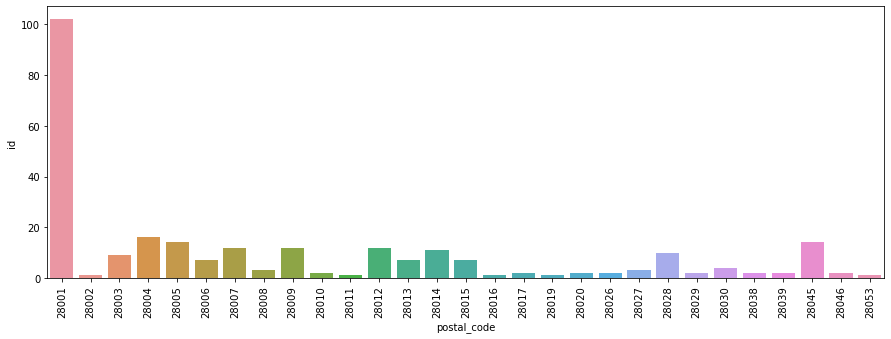

In [83]:
fig = plt.figure(figsize=(15,5))

sns.barplot(data=stations_per_postal, x='postal_code', y = 'id');
plt.xticks(rotation=90);

As we can see in the plot above the postal code 28001 (Madrid), has a lot of stations, we are going to perform a cluster analysis in this zone so the number of stations per zone is equally distributed

In [84]:
#We create a dataframe with the stations of the postal code 28001
stations_28001 = stations[stations['postal_code']==28001]

In [85]:
stations_28001

,Unnamed: 0,id,address,name,total_bases,longitude,latitude,postal_code
3,3,4,Plaza del Conde del Valle de Súchil nº 3,Plaza Conde Suchil,18,-3.706917,40.430294,28001
8,8,9,Plaza de Alonso Martínez nº 5,Alonso Martínez,24,-3.695440,40.427868,28001
14,14,15,Calle Duque de Liria,Ventura Rodríguez,24,-3.713479,40.426096,28001
18,18,19,Plaza de Pedro Zerolo nº 1,Plaza de Pedro Zerolo,24,-3.699650,40.420777,28001
21,21,25,Calle Jacometrezo nº 3,Jacometrezo,24,-3.706538,40.420078,28001
...,...,...,...,...,...,...,...,...
259,259,265,Avenida Juan de Herrera frente a la calle Paul...,INEF,24,-3.729970,40.438960,28001
260,260,266,Avenida de la Complutense (Metro Ciudad Univer...,Ciudad Universitaria 1,24,-3.726990,40.443750,28001
261,261,267,Avenida de la Complutense (Metro Ciudad Univer...,Ciudad Universitaria 2,24,-3.726930,40.443420,28001
262,262,268,Calle José Antonio Novais frente al nº 12,Facultad Biología,24,-3.727295,40.448332,28001


To cluster the zone we are going to use KMeans.K-means clustering is a simple unsupervised learning algorithm that is used to solve clustering problems. It follows a simple procedure of classifying a given data set into a number of clusters, defined by the letter "k," which is fixed beforehand. The clusters are then positioned as points and all observations or data points are associated with the nearest cluster, computed, adjusted and then the process starts over using the new adjustments until a desired result is reached.

We are interested in the group the stations by proximity in terms on coordinates (latitude and longitude).

In [86]:
#library to perform the Kmeans
from sklearn.cluster import KMeans


In [87]:
#We select the columns we are interested in
stations_28001 = stations_28001[['id', 'longitude', 'latitude']]

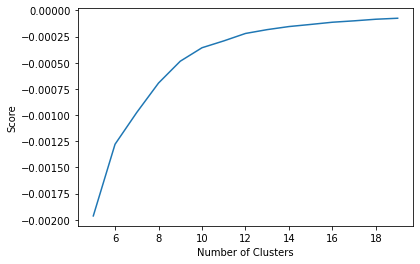

In [88]:
#Kmeans to understand the number of clusters in which we are going to divide the zone
K_clusters = range(5,20)
kmeans = [KMeans(n_clusters=i) for i in K_clusters]
Y_axis = stations_28001[['latitude']]
X_axis = stations_28001[['longitude']]
score = [kmeans[i].fit(Y_axis).score(Y_axis) for i in range(len(kmeans))]
# Visualization
plt.plot(K_clusters, score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.show()

From the elbow curve above we can see that from 10 clusters on the slope remains almost constant, so more than 10 clusters are not going to be useful

In [89]:
#Perform the KMeans with 10 clusters
kmeans = KMeans(n_clusters = 10, init ='k-means++')
kmeans.fit(stations_28001[stations_28001.columns[1:3]]) # Compute k-means clustering.

stations_28001['cluster_label'] = kmeans.fit_predict(stations_28001[stations_28001.columns[1:3]])

centers = kmeans.cluster_centers_ # Coordinates of cluster centers.
labels = kmeans.predict(stations_28001[stations_28001.columns[1:3]]) # Labels of each point
stations_28001.head(10)


,id,longitude,latitude,cluster_label
3,4,-3.706917,40.430294,2
8,9,-3.695440,40.427868,8
14,15,-3.713479,40.426096,2
18,19,-3.699650,40.420777,7
21,25,-3.706538,40.420078,7
23,27,-3.710692,40.417908,7
30,34,-3.711504,40.419210,7
32,36,-3.706103,40.415010,7
34,38,-3.703683,40.414676,7
41,45,-3.699115,40.412205,7


<AxesSubplot:xlabel='latitude', ylabel='longitude'>

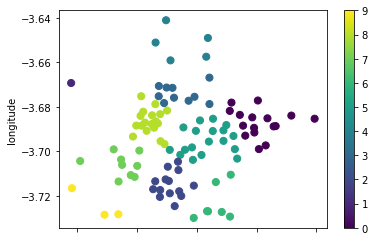

In [90]:
#Plot the clusters obtained in the KMeans
stations_28001.plot.scatter(x = 'latitude', y = 'longitude', c=labels, s=50, cmap='viridis')

In the plot above we see the division per zones depending on the latitude and longitude. This is the division we are going to do in order to predict the demand

In [91]:
#We create a new column on the dataframe, that contains the postal code and the number of the cluster

stations_28001['postal_code'] = "28001_" + stations_28001['cluster_label'].map(str)
stations_28001

,id,longitude,latitude,cluster_label,postal_code
3,4,-3.706917,40.430294,2,28001_2
8,9,-3.695440,40.427868,8,28001_8
14,15,-3.713479,40.426096,2,28001_2
18,19,-3.699650,40.420777,7,28001_7
21,25,-3.706538,40.420078,7,28001_7
...,...,...,...,...,...
259,265,-3.729970,40.438960,6,28001_6
260,266,-3.726990,40.443750,6,28001_6
261,267,-3.726930,40.443420,6,28001_6
262,268,-3.727295,40.448332,6,28001_6


In [92]:
stations_28001 = stations.merge(stations_28001, how='inner', left_on='id', right_on='id')
stations_28001 = stations_28001[['id', 'address', 'name', 'total_bases', 'longitude_x', 'latitude_x', 'postal_code_y']]

In [93]:
stations_28001

,id,address,name,total_bases,longitude_x,latitude_x,postal_code_y
0,4,Plaza del Conde del Valle de Súchil nº 3,Plaza Conde Suchil,18,-3.706917,40.430294,28001_2
1,9,Plaza de Alonso Martínez nº 5,Alonso Martínez,24,-3.695440,40.427868,28001_8
2,15,Calle Duque de Liria,Ventura Rodríguez,24,-3.713479,40.426096,28001_2
3,19,Plaza de Pedro Zerolo nº 1,Plaza de Pedro Zerolo,24,-3.699650,40.420777,28001_7
4,25,Calle Jacometrezo nº 3,Jacometrezo,24,-3.706538,40.420078,28001_7
...,...,...,...,...,...,...,...
97,265,Avenida Juan de Herrera frente a la calle Paul...,INEF,24,-3.729970,40.438960,28001_6
98,266,Avenida de la Complutense (Metro Ciudad Univer...,Ciudad Universitaria 1,24,-3.726990,40.443750,28001_6
99,267,Avenida de la Complutense (Metro Ciudad Univer...,Ciudad Universitaria 2,24,-3.726930,40.443420,28001_6
100,268,Calle José Antonio Novais frente al nº 12,Facultad Biología,24,-3.727295,40.448332,28001_6


In [94]:
stations_28001['longitude'] =stations_28001['longitude_x'] 
stations_28001['latitude'] =stations_28001['latitude_x'] 
stations_28001['postal_code'] = stations_28001['postal_code_y']
stations_28001 = stations_28001.drop(['longitude_x'], axis=1)
stations_28001 = stations_28001.drop(['latitude_x'], axis=1)
stations_28001 = stations_28001.drop(['postal_code_y'], axis=1)

In [17]:
stations_28001

,id,address,name,total_bases,longitude,latitude,postal_code
0,4,Plaza del Conde del Valle de Súchil nº 3,Plaza Conde Suchil,18,-3.706917,40.430294,28001_7
1,9,Plaza de Alonso Martínez nº 5,Alonso Martínez,24,-3.695440,40.427868,28001_6
2,15,Calle Duque de Liria,Ventura Rodríguez,24,-3.713479,40.426096,28001_7
3,19,Plaza de Pedro Zerolo nº 1,Plaza de Pedro Zerolo,24,-3.699650,40.420777,28001_4
4,25,Calle Jacometrezo nº 3,Jacometrezo,24,-3.706538,40.420078,28001_4
...,...,...,...,...,...,...,...
97,265,Avenida Juan de Herrera frente a la calle Paul...,INEF,24,-3.729970,40.438960,28001_1
98,266,Avenida de la Complutense (Metro Ciudad Univer...,Ciudad Universitaria 1,24,-3.726990,40.443750,28001_1
99,267,Avenida de la Complutense (Metro Ciudad Univer...,Ciudad Universitaria 2,24,-3.726930,40.443420,28001_1
100,268,Calle José Antonio Novais frente al nº 12,Facultad Biología,24,-3.727295,40.448332,28001_1


Now we have a dataframe with the cluster we've made, we are going to merge this data frame with the rest of the postal codes

In [95]:
stations = stations[stations['postal_code'] != 28001]
stations = stations [['id','address', 'name', 'total_bases', 'longitude', 'latitude', 'postal_code']]
stations

,id,address,name,total_bases,longitude,latitude,postal_code
0,1,Puerta del Sol nº 1,Puerta del Sol A,30,-3.701834,40.417214,28014
1,2,Puerta del Sol nº 1,Puerta del Sol B,30,-3.701603,40.417313,28014
2,3,Calle Miguel Moya nº 1,Miguel Moya,24,-3.705842,40.420589,28004
4,5,Calle Manuela Malasaña nº 5,Malasaña,24,-3.702587,40.428552,28004
5,6,Calle Fuencarral nº 108,Fuencarral,27,-3.702050,40.428520,28004
...,...,...,...,...,...,...,...
245,251,Calle Cartagena nº 34,Cartagena,24,-3.670120,40.435030,28028
246,252,Calle Isaac Peral nº 44,Hospital Clínico,24,-3.717570,40.440030,28003
247,253,Calle Galileo nº 63,Galileo,24,-3.710190,40.436400,28015
249,270,Calle Zurbano nº 90,Zurbano,24,-3.692810,40.438370,28003


In [96]:
#We append both dataframes to have all the information in one dataframe
stations = stations.append(stations_28001)
stations

,id,address,name,total_bases,longitude,latitude,postal_code
0,1,Puerta del Sol nº 1,Puerta del Sol A,30,-3.701834,40.417214,28014
1,2,Puerta del Sol nº 1,Puerta del Sol B,30,-3.701603,40.417313,28014
2,3,Calle Miguel Moya nº 1,Miguel Moya,24,-3.705842,40.420589,28004
4,5,Calle Manuela Malasaña nº 5,Malasaña,24,-3.702587,40.428552,28004
5,6,Calle Fuencarral nº 108,Fuencarral,27,-3.702050,40.428520,28004
...,...,...,...,...,...,...,...
97,265,Avenida Juan de Herrera frente a la calle Paul...,INEF,24,-3.729970,40.438960,28001_6
98,266,Avenida de la Complutense (Metro Ciudad Univer...,Ciudad Universitaria 1,24,-3.726990,40.443750,28001_6
99,267,Avenida de la Complutense (Metro Ciudad Univer...,Ciudad Universitaria 2,24,-3.726930,40.443420,28001_6
100,268,Calle José Antonio Novais frente al nº 12,Facultad Biología,24,-3.727295,40.448332,28001_6


In [20]:
#We save the new dataframe of the stations in a new csv file
stations.to_csv("stations_postal_code.csv")

Now we are going to plot the number of stations per zone

In [21]:
stations_per_postal = stations.groupby(['postal_code'])['id'].count()
stations_per_postal = stations_per_postal.sort_values(ascending=False)
stations_per_postal = stations_per_postal.reset_index()

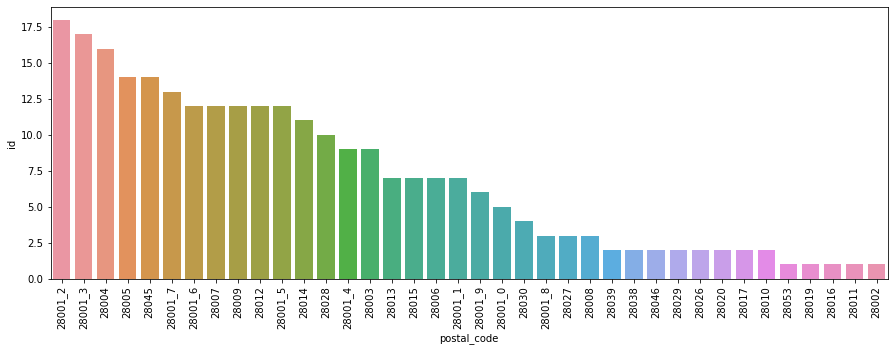

In [22]:
fig = plt.figure(figsize=(15,5))

sns.barplot(data=stations_per_postal, x='postal_code', y = 'id');
plt.xticks(rotation=90);

Distribution now makes sense, the zone with more stations is located in the center, and has 36 stations.

## 4.2. Models by area

Now that we have the areas defined we are going to predict the demand of each zone. We are going to do the same process for each of the 36 stations. 

We are going to make the detailed models for one station, and then we will do the same process for the others.

We are going to use the same models that we used in the previous notebook, where we predict the global demand

In [100]:
rides_per_station = rides_per_station[['datetime','date', 'idunplug_station', 'weekday', 'hour', 
                                       'month', 'year', 'time', 'rides', 'total_bases','address', 'name', 'id']]

In [101]:
rides_per_station = rides_per_station.merge(stations, how='inner', left_on='id', right_on='id')

In [102]:
rides_per_station = rides_per_station[['datetime', 'date', 'idunplug_station', 'weekday', 'hour', 'month','rides',
                                       'year', 'time', 'total_bases_x', 'address_x', 'name_x', 'longitude', 'latitude', 
                                       'postal_code']]
rides_per_station['total_bases'] = rides_per_station['total_bases_x']
rides_per_station = rides_per_station.drop('total_bases_x', axis=1)
rides_per_station['address'] = rides_per_station['address_x']
rides_per_station = rides_per_station.drop('address_x', axis=1)
rides_per_station['name'] = rides_per_station['name_x']
rides_per_station = rides_per_station.drop('name_x', axis=1)

In [103]:
rides_per_station

,datetime,date,idunplug_station,weekday,hour,month,rides,year,time,longitude,latitude,postal_code,total_bases,address,name
0,2019-01-01 08:00:00,2019-01-01,1,Tuesday,8,1,1,2019,08:00:00,-3.701834,40.417214,28014,30,Puerta del Sol nº 1,Puerta del Sol A
1,2019-01-01 11:00:00,2019-01-01,1,Tuesday,11,1,1,2019,11:00:00,-3.701834,40.417214,28014,30,Puerta del Sol nº 1,Puerta del Sol A
2,2019-01-01 13:00:00,2019-01-01,1,Tuesday,13,1,1,2019,13:00:00,-3.701834,40.417214,28014,30,Puerta del Sol nº 1,Puerta del Sol A
3,2019-01-01 14:00:00,2019-01-01,1,Tuesday,14,1,1,2019,14:00:00,-3.701834,40.417214,28014,30,Puerta del Sol nº 1,Puerta del Sol A
4,2019-01-01 15:00:00,2019-01-01,1,Tuesday,15,1,2,2019,15:00:00,-3.701834,40.417214,28014,30,Puerta del Sol nº 1,Puerta del Sol A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2629781,2021-06-30 18:00:00,2021-06-30,270,Wednesday,18,6,4,2021,18:00:00,-3.692810,40.438370,28003,24,Calle Zurbano nº 90,Zurbano
2629782,2021-06-30 19:00:00,2021-06-30,270,Wednesday,19,6,2,2021,19:00:00,-3.692810,40.438370,28003,24,Calle Zurbano nº 90,Zurbano
2629783,2021-06-30 20:00:00,2021-06-30,270,Wednesday,20,6,2,2021,20:00:00,-3.692810,40.438370,28003,24,Calle Zurbano nº 90,Zurbano
2629784,2021-06-30 21:00:00,2021-06-30,270,Wednesday,21,6,1,2021,21:00:00,-3.692810,40.438370,28003,24,Calle Zurbano nº 90,Zurbano


### 4.2.1. Demand prediction for zone: 28001_0

In [27]:
rides_per_zone_1 = rides_per_station[rides_per_station['postal_code']=="28001_0"]
#rides_per_zone_1 = rides_per_zone_1

In [28]:
rides_per_zone_1 = rides_per_zone_1.groupby(['date', 'weekday', 'hour', 'month',
                                             'year', 'time','datetime']).rides.sum().reset_index()

In [29]:
rides_per_zone_1

,date,weekday,hour,month,year,time,datetime,rides
0,2019-09-06,Friday,9,9,2019,09:00:00,2019-09-06 09:00:00,1
1,2019-09-06,Friday,12,9,2019,12:00:00,2019-09-06 12:00:00,1
2,2019-09-06,Friday,17,9,2019,17:00:00,2019-09-06 17:00:00,2
3,2019-09-06,Friday,18,9,2019,18:00:00,2019-09-06 18:00:00,1
4,2019-09-06,Friday,20,9,2019,20:00:00,2019-09-06 20:00:00,1
...,...,...,...,...,...,...,...,...
9411,2021-06-30,Wednesday,18,6,2021,18:00:00,2021-06-30 18:00:00,7
9412,2021-06-30,Wednesday,19,6,2021,19:00:00,2021-06-30 19:00:00,6
9413,2021-06-30,Wednesday,20,6,2021,20:00:00,2021-06-30 20:00:00,2
9414,2021-06-30,Wednesday,21,6,2021,21:00:00,2021-06-30 21:00:00,7


In [30]:
#Converting the column datetime to a datetime format
rides_per_zone_1['datetime'] = pd.to_datetime(rides_per_zone_1['datetime'])


In [31]:
#Resample to fill all values of the time series
rides_per_zone_1.set_index('datetime',inplace=True)
rides_per_zone_1.sort_index(inplace=True)
rides_per_zone_1.resample('1H').sum()
rides_per_zone_1

,date,weekday,hour,month,year,time,rides
datetime,,,,,,,
2019-09-06 09:00:00,2019-09-06,Friday,9,9,2019,09:00:00,1
2019-09-06 12:00:00,2019-09-06,Friday,12,9,2019,12:00:00,1
2019-09-06 17:00:00,2019-09-06,Friday,17,9,2019,17:00:00,2
2019-09-06 18:00:00,2019-09-06,Friday,18,9,2019,18:00:00,1
2019-09-06 20:00:00,2019-09-06,Friday,20,9,2019,20:00:00,1
...,...,...,...,...,...,...,...
2021-06-30 18:00:00,2021-06-30,Wednesday,18,6,2021,18:00:00,7
2021-06-30 19:00:00,2021-06-30,Wednesday,19,6,2021,19:00:00,6
2021-06-30 20:00:00,2021-06-30,Wednesday,20,6,2021,20:00:00,2


##### Plotting the time series

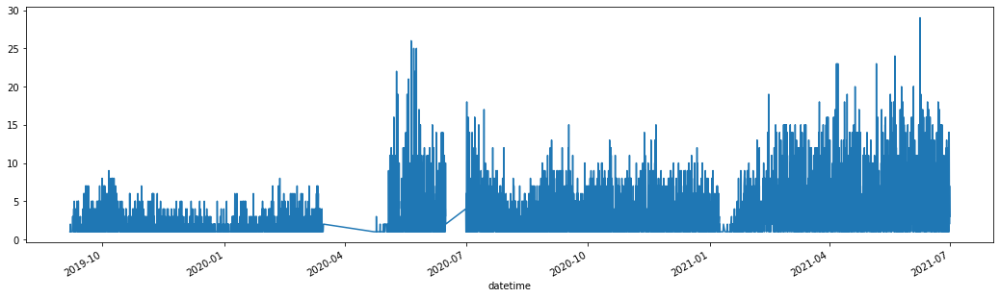

In [32]:
plt.figure(figsize=(18,5))

rides_per_zone_1['rides'].plot()
plt.show()

##### Adding lag values : feature engineering

In [33]:
rides_per_zone_1['rides_lag_7'] = rides_per_zone_1['rides'].shift(7*24)
rides_per_zone_1['rides_lag_1'] = rides_per_zone_1['rides'].shift(1*24)
rides_per_zone_1['rides_lag_2'] = rides_per_zone_1['rides'].shift(2*24)
rides_per_zone_1['rides_lag_1_month'] = rides_per_zone_1['rides'].shift(30*24)
rides_per_zone_1['rides_lag_12_hours'] = rides_per_zone_1['rides'].shift(12)

##### Correlation between variables

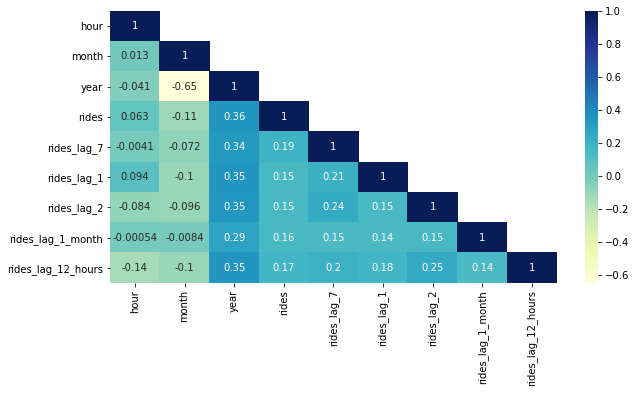

In [34]:
corr_matrix = rides_per_zone_1.corr()
fig = plt.figure(figsize=(10, 5))

mask = np.array(corr_matrix)
mask[np.tril_indices_from(mask)] = False

sns.heatmap(corr_matrix, mask = mask, annot=True, cbar=True,cmap="YlGnBu")
plt.show()

##### Evaluating models

In [35]:
from sklearn import metrics
def calculate_metrics(forecast,demand):
    mse = metrics.mean_squared_error(forecast,demand)
    mae = metrics.mean_absolute_error(forecast,demand)
    rmse = np.sqrt(metrics.mean_squared_error(forecast,demand))
    r2 = metrics.r2_score(forecast,demand)
    return mse, mae, rmse, r2

In [36]:
evaluation_model_1 = pd.DataFrame(columns=["model", "MSE", "MAE", "RMSE", "R2"])

#### 4.2.1.1. Machine learning models

###### One-hot encoding for categorical variables

In [37]:
rides_per_zone_1 = pd.get_dummies(rides_per_zone_1, columns = ['weekday', 'hour', 'month'])

In [38]:
#We save the columns we are using as predictors in columns for model and the target we want to predict in target
columns_for_model = [column for column in rides_per_zone_1.columns
                      if column.startswith(('weekday', 'hour', 'month'))]

#columns_for_model.extend(['is_holiday_x', 'is_weekend'])

target = 'rides'

##### Division in train and test

We are going to consider the last 14 days of information as the test set to evaluate the model

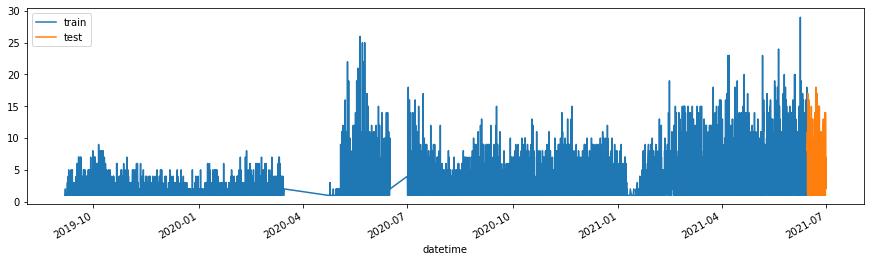

In [39]:
steps = 24*14 # 14 days
train = rides_per_zone_1[:-steps]
test = rides_per_zone_1[-steps:]

fig, ax = plt.subplots(figsize=(15, 4))
train['rides'].plot(ax=ax, label='train')
test['rides'].plot(ax=ax, label='test')
ax.legend();

#### Random Forest

In [40]:
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestRegressor
from skforecast.ForecasterAutoreg import ForecasterAutoreg
from skforecast.ForecasterAutoregCustom import ForecasterAutoregCustom
from skforecast.ForecasterAutoregMultiOutput import ForecasterAutoregMultiOutput
from skforecast.model_selection import grid_search_forecaster
from skforecast.model_selection import backtesting_forecaster
import warnings
warnings.filterwarnings('ignore')

We train a forecaster autoregressor with a Random Forest regressor, using the lag values of the past 7 days at the same hour as predictors

In [42]:
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123),
                              lags = [24,24*2,24*3,24*4,24*5,24*6,24*7])
forecaster.fit(y=train['rides'])
forecaster

ForecasterAutoreg 
Regressor: RandomForestRegressor(random_state=123) 
Lags: [ 24  48  72  96 120 144 168] 
Window size: 168 
Included exogenous: False 
Type of exogenous variable: None 
Exogenous variables names: None 
Training range: [0, 18504] 
Training index type: RangeIndex 
Training index frequency: 1 
Regressor parameters: {'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 123, 'verbose': 0, 'warm_start': False} 
Creation date: 2022-05-29 17:24:11 
Last fit date: 2022-05-29 17:24:18 
Skforecast version: 0.4.3 

In [43]:
steps = 14*24 #Predictions for the next 14 days
predictions = forecaster.predict(steps = steps)
predictions = predictions.reset_index()
predictions = predictions['pred']
predictions

0      76.08
1      52.99
2      42.73
3      35.08
4      35.02
       ...  
331    49.15
332    43.14
333    41.99
334    38.23
335    46.95
Name: pred, Length: 336, dtype: float64

In [44]:
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']
demand

0       6
1      18
2      27
3      25
4      14
       ..
331    47
332    39
333    30
334    36
335    14
Name: rides, Length: 336, dtype: int64

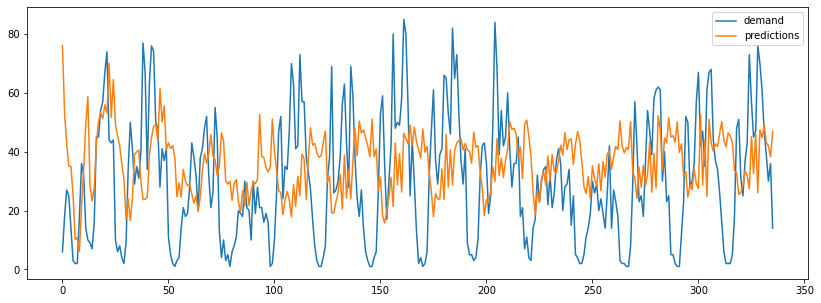

In [45]:
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [46]:
#Metrics for the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_1 = evaluation_model_1.append({'model':'ForecastAutoreg', 'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_1

,model,MSE,MAE,RMSE,R2
0,ForecastAutoreg,612.384337,20.105952,24.7464,-4.888336


In [219]:
#Looking for the best hyperparameters: grid search

steps = 14*24
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123),
                              lags = [24*7])
#Number of lags used as predictors
lags_grid = [[24,24*2,24*3,24*4,24*5,24*6,24*7], [24,24*7], [24*7]]

#Regressor hyperparameters
param_grid = {'n_estimators':[100,500],
             'max_depth': [3,5,10]}

#Grid search
grid_seach = grid_search_forecaster(forecaster = forecaster,
                                   y = train['rides'],
                                   param_grid = param_grid,
                                   lags_grid = lags_grid,
                                   steps = steps,
                                   refit = True,
                                   metric = 'mean_squared_error',
                                   initial_train_size = int(len(train)*0.25),
                                    fixed_train_size=False,
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                              | 0/6 [00:00<?, ?it/s]

Number of models compared: 18


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(

loop param_grid:  17%|██████▏                              | 1/6 [01:55<09:35, 115.17s/it]C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex 

C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(

loop param_grid:  33%|████████████▎                        | 2/6 [11:26<25:33, 383.40s/it]C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex 

C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(
C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 24  48  72  96 120 144 168] 
  Parameters: {'max_depth': 5, 'n_estimators': 100}
  Backtesting metric: 3340.211789782864



C:\Users\paula\Anaconda3\lib\site-packages\skforecast\utils\utils.py:246: UserWarning: `y` has DatetimeIndex index but no frequency. Index is overwritten with a RangeIndex of step 1.
  warnings.warn(


In [221]:
#Results of the grid search
grid_seach

,lags,params,metric,max_depth,n_estimators
2,"[24, 48, 72, 96, 120, 144, 168]","{'max_depth': 5, 'n_estimators': 100}",3340.211790,5,100
3,"[24, 48, 72, 96, 120, 144, 168]","{'max_depth': 5, 'n_estimators': 500}",3343.340955,5,500
5,"[24, 48, 72, 96, 120, 144, 168]","{'max_depth': 10, 'n_estimators': 500}",3384.224528,10,500
4,"[24, 48, 72, 96, 120, 144, 168]","{'max_depth': 10, 'n_estimators': 100}",3403.263176,10,100
13,[168],"{'max_depth': 3, 'n_estimators': 500}",3440.770247,3,500
15,[168],"{'max_depth': 5, 'n_estimators': 500}",3443.727651,5,500
12,[168],"{'max_depth': 3, 'n_estimators': 100}",3444.832883,3,100
14,[168],"{'max_depth': 5, 'n_estimators': 100}",3446.547958,5,100
17,[168],"{'max_depth': 10, 'n_estimators': 500}",3473.581676,10,500
16,[168],"{'max_depth': 10, 'n_estimators': 100}",3479.332452,10,100


Best results are obtained with variable lags of the last 7 days at the same hour and a Random Forest hyperparameters max_depth = 5 and n_estimators = 100

In [47]:
#We create and train the model with the hyperparameters obtained
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(max_depth=5,n_estimators=100, random_state = 123),
                               lags = [24,48,72,96,120,144,168])
forecaster.fit(y=train['rides'])
forecaster

ForecasterAutoreg 
Regressor: RandomForestRegressor(max_depth=5, random_state=123) 
Lags: [ 24  48  72  96 120 144 168] 
Window size: 168 
Included exogenous: False 
Type of exogenous variable: None 
Exogenous variables names: None 
Training range: [0, 18504] 
Training index type: RangeIndex 
Training index frequency: 1 
Regressor parameters: {'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': 5, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 123, 'verbose': 0, 'warm_start': False} 
Creation date: 2022-05-29 17:24:53 
Last fit date: 2022-05-29 17:24:55 
Skforecast version: 0.4.3 

In [48]:
steps = 14*24 #Predictions for the next 14 days
predictions = forecaster.predict(steps = steps)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

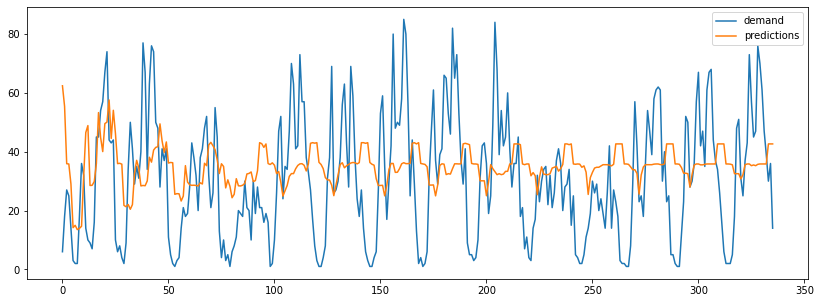

In [49]:
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [50]:
#Metrics for the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_1 = evaluation_model_1.append({'model':'ForecastAutoreg', 'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_1

,model,MSE,MAE,RMSE,R2
0,ForecastAutoreg,612.384337,20.105952,24.746400,-4.888336
1,ForecastAutoreg,485.862672,18.281056,22.042293,-11.156086


In [51]:
#Backtesting
steps = 14*24
n_backtesting = 24*30*2 # Se separan para el backtest los últimos 9 años

metric, backtesting_predictions = backtesting_forecaster(
                                    forecaster         = forecaster,
                                    y                  = train['rides'],
                                    initial_train_size = len(train) - n_backtesting,
                                    fixed_train_size   = False,
                                    steps              = steps,
                                    refit              = True,
                                    metric             = 'mean_squared_error',
                                    verbose            = True
                                 )
metric


Information of backtesting process
----------------------------------
Number of observations used for initial training: 17065
Number of observations used for backtesting: 1440
    Number of folds: 5
    Number of steps per fold: 336
    Last fold only includes 96 observations.

Data partition in fold: 0
    Training:   2018-12-31 23:00:00 -- 2021-04-11 11:00:00
    Validation: 2021-04-11 12:00:00 -- 2021-04-28 08:00:00
Data partition in fold: 1
    Training:   2018-12-31 23:00:00 -- 2021-04-28 08:00:00
    Validation: 2021-04-28 09:00:00 -- 2021-05-14 07:00:00
Data partition in fold: 2
    Training:   2018-12-31 23:00:00 -- 2021-05-14 07:00:00
    Validation: 2021-05-14 08:00:00 -- 2021-05-29 02:00:00
Data partition in fold: 3
    Training:   2018-12-31 23:00:00 -- 2021-05-29 02:00:00
    Validation: 2021-05-29 03:00:00 -- 2021-06-12 12:00:00
Data partition in fold: 4
    Training:   2018-12-31 23:00:00 -- 2021-06-12 12:00:00
    Validation: 2021-06-12 13:00:00 -- 2021-06-16 18:00:00



485.8238491973605

In [52]:
#Feature importance
feature_importance = forecaster.get_feature_importance()
feature_importance = feature_importance.sort_values(by='importance', ascending = False)
feature_importance

,feature,importance
0,lag_24,0.837586
5,lag_144,0.042917
6,lag_168,0.035501
4,lag_120,0.035426
3,lag_96,0.019664
2,lag_72,0.018032
1,lag_48,0.010875


The most important feature is the demand of the last 24 hours

###### Including exogenous variables

We saved the exogenous variables we want to use for our model (hour, weekday, month) in the variable ``columns_for_model``

In [57]:
#Create and train forecaster
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123),
                              lags = [24,48,72,96,120,144,168])
forecaster.fit(y=train['rides'], exog = train[columns_for_model])
forecaster

ForecasterAutoreg 
Regressor: RandomForestRegressor(random_state=123) 
Lags: [ 24  48  72  96 120 144 168] 
Window size: 168 
Included exogenous: True 
Type of exogenous variable: <class 'pandas.core.frame.DataFrame'> 
Exogenous variables names: ['weekday_Friday', 'weekday_Monday', 'weekday_Saturday', 'weekday_Sunday', 'weekday_Thursday', 'weekday_Tuesday', 'weekday_Wednesday', 'hour_0', 'hour_1', 'hour_2', 'hour_3', 'hour_4', 'hour_5', 'hour_6', 'hour_7', 'hour_8', 'hour_9', 'hour_10', 'hour_11', 'hour_12', 'hour_13', 'hour_14', 'hour_15', 'hour_16', 'hour_17', 'hour_18', 'hour_19', 'hour_20', 'hour_21', 'hour_22', 'hour_23', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12'] 
Training range: [0, 18504] 
Training index type: RangeIndex 
Training index frequency: 1 
Regressor parameters: {'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': None, 'max_features': 'auto', 'max_l

In [58]:
#Predictions and demand
predictions = forecaster.predict(steps=steps, exog = test[columns_for_model])
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

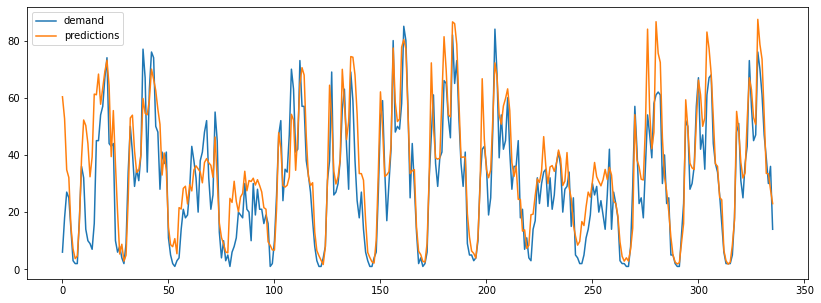

In [59]:
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [60]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_1 = evaluation_model_1.append({'model':'ForecastAutoreg with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_1

,model,MSE,MAE,RMSE,R2
0,ForecastAutoreg,612.384337,20.105952,24.746400,-4.888336
1,ForecastAutoreg,485.862672,18.281056,22.042293,-11.156086
2,ForecastAutoreg with exog. variables,126.021387,8.160119,11.225925,0.717933


In [249]:
#Looking for the best hyperparameters: grid search

steps = 14*24
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123),
                              lags = [24*7])
#Number of lags used as predictors
lags_grid = [[24,24*2,24*3,24*4,24*5,24*6,24*7], [24*7]]

#Regressor hyperparameters
param_grid = {'n_estimators':[100,200,500],
             'max_depth': [3,5,10]}

#Grid search
grid_seach = grid_search_forecaster(forecaster = forecaster,
                                   y = train['rides'],
                                    exog = train[columns_for_model],
                                   param_grid = param_grid,
                                   lags_grid = lags_grid,
                                   steps = steps,
                                   refit = True,
                                   metric = 'mean_squared_error',
                                   initial_train_size = int(len(train)*0.25),
                                    fixed_train_size=False,
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                              | 0/9 [00:00<?, ?it/s]

Number of models compared: 18



loop lags_grid: 100%|███████████████████████████████████| 2/2 [2:27:06<00:00, 4413.15s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'max_depth': 10, 'n_estimators': 500}
  Backtesting metric: 1807.6882209501296



In [250]:
#Results of grid search
grid_seach


,lags,params,metric,max_depth,n_estimators
17,[168],"{'max_depth': 10, 'n_estimators': 500}",1807.688221,10,500
15,[168],"{'max_depth': 10, 'n_estimators': 100}",1811.862795,10,100
16,[168],"{'max_depth': 10, 'n_estimators': 200}",1812.459364,10,200
8,"[24, 48, 72, 96, 120, 144, 168]","{'max_depth': 10, 'n_estimators': 500}",2262.339253,10,500
6,"[24, 48, 72, 96, 120, 144, 168]","{'max_depth': 10, 'n_estimators': 100}",2268.773179,10,100
7,"[24, 48, 72, 96, 120, 144, 168]","{'max_depth': 10, 'n_estimators': 200}",2272.120589,10,200
14,[168],"{'max_depth': 5, 'n_estimators': 500}",2659.882289,5,500
13,[168],"{'max_depth': 5, 'n_estimators': 200}",2661.594503,5,200
12,[168],"{'max_depth': 5, 'n_estimators': 100}",2664.577232,5,100
4,"[24, 48, 72, 96, 120, 144, 168]","{'max_depth': 5, 'n_estimators': 200}",2996.305613,5,200


Best results are obtained with variable lags of the last 7 days at the same hour and a Random Forest hyperparameters max_depth = 10 and n_estimators = 500

In [61]:
#We create and train the model with the hyperparameters obtained
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(max_depth=10,n_estimators=500, random_state = 123),
                               lags = [168])
forecaster.fit(y=train['rides'], exog = train[columns_for_model])
forecaster

ForecasterAutoreg 
Regressor: RandomForestRegressor(max_depth=10, n_estimators=500, random_state=123) 
Lags: [168] 
Window size: 168 
Included exogenous: True 
Type of exogenous variable: <class 'pandas.core.frame.DataFrame'> 
Exogenous variables names: ['weekday_Friday', 'weekday_Monday', 'weekday_Saturday', 'weekday_Sunday', 'weekday_Thursday', 'weekday_Tuesday', 'weekday_Wednesday', 'hour_0', 'hour_1', 'hour_2', 'hour_3', 'hour_4', 'hour_5', 'hour_6', 'hour_7', 'hour_8', 'hour_9', 'hour_10', 'hour_11', 'hour_12', 'hour_13', 'hour_14', 'hour_15', 'hour_16', 'hour_17', 'hour_18', 'hour_19', 'hour_20', 'hour_21', 'hour_22', 'hour_23', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12'] 
Training range: [0, 18504] 
Training index type: RangeIndex 
Training index frequency: 1 
Regressor parameters: {'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': 10, 'max_features': 'auto', 

In [62]:
#Final model
predictions = forecaster.predict(steps=steps,
                                exog = test[columns_for_model])
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

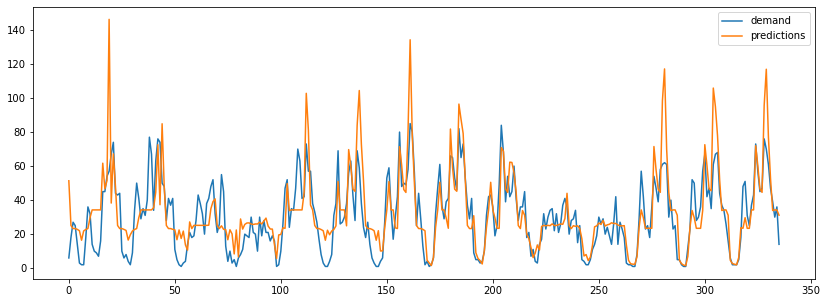

In [63]:
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [64]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_1 = evaluation_model_1.append({'model':'ForecastAutoreg with exog. variables BM', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_1

,model,MSE,MAE,RMSE,R2
0,ForecastAutoreg,612.384337,20.105952,24.746400,-4.888336
1,ForecastAutoreg,485.862672,18.281056,22.042293,-11.156086
2,ForecastAutoreg with exog. variables,126.021387,8.160119,11.225925,0.717933
3,ForecastAutoreg with exog. variables BM,225.565887,10.734731,15.018851,0.547796


In [65]:
#Feature importance
feature_importance = forecaster.get_feature_importance()
feature_importance = feature_importance.sort_values(by='importance', ascending = False)
feature_importance

,feature,importance
0,lag_168,1.563384e-01
25,hour_17,6.657001e-02
4,weekday_Sunday,6.284317e-02
3,weekday_Saturday,5.909716e-02
26,hour_18,5.357980e-02
24,hour_16,4.593091e-02
12,hour_4,4.533871e-02
11,hour_3,4.497649e-02
9,hour_1,4.221612e-02
13,hour_5,4.043474e-02


#### Recursive autoregressive model. Linear regression with ridge attenuation

In [66]:
from sklearn.linear_model import Ridge
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler


In [67]:
#Create and train the forecaster
forecaster = ForecasterAutoreg(regressor = make_pipeline(StandardScaler(), Ridge()),
                              lags = 24*14)
forecaster.fit(y=train['rides'])
forecaster

ForecasterAutoreg 
Regressor: Pipeline(steps=[('standardscaler', StandardScaler()), ('ridge', Ridge())]) 
Lags: [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126
 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144
 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162
 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180
 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198
 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216
 217 218 219

We evaluate the model as if each day we predict the next 24 hours

In [68]:
#Backtesting (predictions)
metric, predictions = backtesting_forecaster(forecaster = forecaster,
                                            y = rides_per_zone_1['rides'],
                                            initial_train_size = len(train),
                                            fixed_train_size=False,
                                            steps=24,
                                            metric = 'mean_absolute_error',
                                            refit = False,
                                            verbose=True)

Information of backtesting process
----------------------------------
Number of observations used for initial training or as initial window: 18505
Number of observations used for backtesting: 336
    Number of folds: 14
    Number of steps per fold: 24

Data partition in fold: 0
    Training:   2018-12-31 23:00:00 -- 2021-06-16 18:00:00
    Validation: 2021-06-16 19:00:00 -- 2021-06-17 20:00:00
Data partition in fold: 1
    Training:   2018-12-31 23:00:00 -- 2021-06-16 18:00:00
    Validation: 2021-06-17 21:00:00 -- 2021-06-18 21:00:00
Data partition in fold: 2
    Training:   2018-12-31 23:00:00 -- 2021-06-16 18:00:00
    Validation: 2021-06-18 22:00:00 -- 2021-06-19 21:00:00
Data partition in fold: 3
    Training:   2018-12-31 23:00:00 -- 2021-06-16 18:00:00
    Validation: 2021-06-19 22:00:00 -- 2021-06-20 21:00:00
Data partition in fold: 4
    Training:   2018-12-31 23:00:00 -- 2021-06-16 18:00:00
    Validation: 2021-06-20 22:00:00 -- 2021-06-21 23:00:00
Data partition in fold: 5


In [69]:


predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

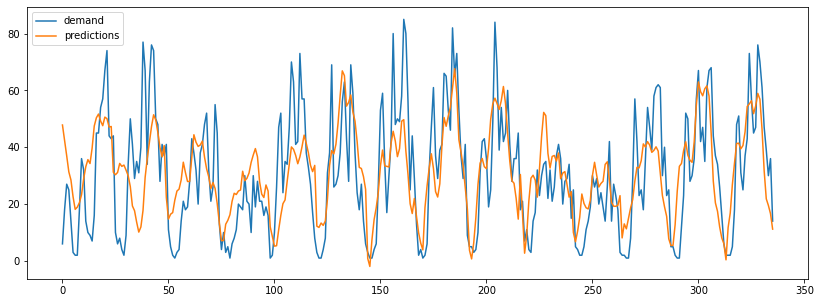

In [70]:
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [71]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_1 = evaluation_model_1.append({'model':'Linear regresion', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_1

,model,MSE,MAE,RMSE,R2
0,ForecastAutoreg,612.384337,20.105952,24.746400,-4.888336
1,ForecastAutoreg,485.862672,18.281056,22.042293,-11.156086
2,ForecastAutoreg with exog. variables,126.021387,8.160119,11.225925,0.717933
3,ForecastAutoreg with exog. variables BM,225.565887,10.734731,15.018851,0.547796
4,Linear regresion,240.432612,12.525301,15.505890,-0.139165


In [286]:
###### Optimizing hyperparameters

forecaster = ForecasterAutoreg(regressor = make_pipeline(StandardScaler(),Ridge()),
                              lags = 24)
lags_grid = [[24*7], [24,24*7]]

param_grid = {'ridge__alpha': np.logspace(-3,5,12)}

grid_search = grid_search_forecaster(forecaster = forecaster,
                                     y = rides_per_zone_1['rides'],
                                     param_grid = param_grid,
                                     lags_grid = lags_grid,
                                     steps=24,
                                     metric = 'mean_absolute_error',
                                     initial_train_size = len(train),
                                     fixed_train_size=False,
                                     return_best = True,
                                     verbose=False) 

loop param_grid:   8%|███                                  | 1/12 [00:00<00:01,  6.60it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:05<00:00,  2.93s/it]

`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 24 168] 
  Parameters: {'ridge__alpha': 0.001}
  Backtesting metric: 33.13153973132694



In [91]:
forecaster = ForecasterAutoreg(regressor = make_pipeline(StandardScaler(),Ridge(alpha=0.001)),
                              lags = [24,168])
forecaster

ForecasterAutoreg 
Regressor: Pipeline(steps=[('standardscaler', StandardScaler()),
                ('ridge', Ridge(alpha=0.001))]) 
Lags: [ 24 168] 
Window size: 168 
Included exogenous: False 
Type of exogenous variable: None 
Exogenous variables names: None 
Training range: None 
Training index type: None 
Training index frequency: None 
Regressor parameters: {'standardscaler__copy': True, 'standardscaler__with_mean': True, 'standardscaler__with_std': True, 'ridge__alpha': 0.001, 'ridge__copy_X': True, 'ridge__fit_intercept': True, 'ridge__max_iter': None, 'ridge__normalize': 'deprecated', 'ridge__positive': False, 'ridge__random_state': None, 'ridge__solver': 'auto', 'ridge__tol': 0.001} 
Creation date: 2022-05-29 17:48:31 
Last fit date: None 
Skforecast version: 0.4.3 

In [92]:
#Backtesitng to evaluate model
metric, predictions = backtesting_forecaster(
                            forecaster = forecaster,
                            y          = rides_per_zone_1['rides'],
                            initial_train_size = len(train),
                            fixed_train_size   = False,
                            steps      = 24,
                            metric     = 'mean_absolute_error',
                            refit      = False,
                            verbose    = False
                        )

In [79]:
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

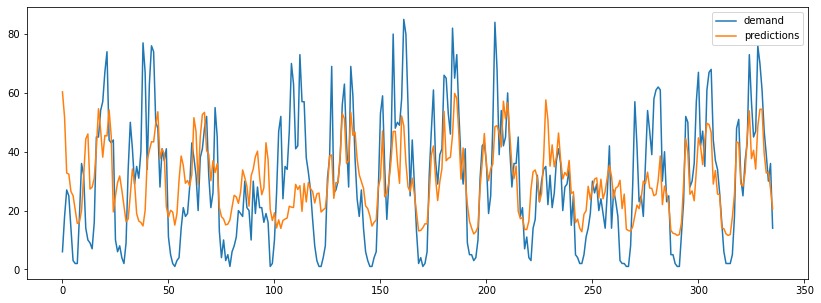

In [80]:
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [81]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_1 = evaluation_model_1.append({'model':'Linear regresion', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_1

,model,MSE,MAE,RMSE,R2
0,ForecastAutoreg,612.384337,20.105952,24.746400,-4.888336
1,ForecastAutoreg,485.862672,18.281056,22.042293,-11.156086
2,ForecastAutoreg with exog. variables,126.021387,8.160119,11.225925,0.717933
3,ForecastAutoreg with exog. variables BM,225.565887,10.734731,15.018851,0.547796
4,Linear regresion,240.432612,12.525301,15.505890,-0.139165
5,Linear regresion,264.161275,12.760101,16.253039,-0.958304


#### Including exogenous variables

In [94]:
#Creating and training forecaster
forecaster = ForecasterAutoreg(
                regressor = make_pipeline(StandardScaler(), Ridge(alpha=0.01)),
                lags      = [24,168],
             )

forecaster.fit(y=train['rides'], exog=train[columns_for_model])
forecaster

ForecasterAutoreg 
Regressor: Pipeline(steps=[('standardscaler', StandardScaler()),
                ('ridge', Ridge(alpha=0.01))]) 
Lags: [ 24 168] 
Window size: 168 
Included exogenous: True 
Type of exogenous variable: <class 'pandas.core.frame.DataFrame'> 
Exogenous variables names: ['weekday_Friday', 'weekday_Monday', 'weekday_Saturday', 'weekday_Sunday', 'weekday_Thursday', 'weekday_Tuesday', 'weekday_Wednesday', 'hour_0', 'hour_1', 'hour_2', 'hour_3', 'hour_4', 'hour_5', 'hour_6', 'hour_7', 'hour_8', 'hour_9', 'hour_10', 'hour_11', 'hour_12', 'hour_13', 'hour_14', 'hour_15', 'hour_16', 'hour_17', 'hour_18', 'hour_19', 'hour_20', 'hour_21', 'hour_22', 'hour_23', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12'] 
Training range: [0, 18504] 
Training index type: RangeIndex 
Training index frequency: 1 
Regressor parameters: {'standardscaler__copy': True, 'standardscaler__with_mean': True, 'standards

In [95]:
#Final model
predictions = forecaster.predict(steps=steps,
                                exog = test[columns_for_model])
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

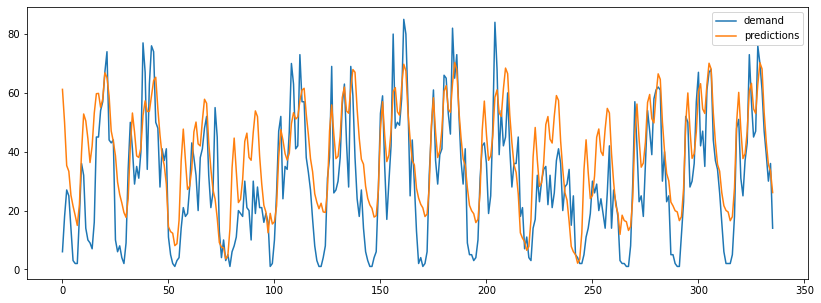

In [96]:
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [97]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_1 = evaluation_model_1.append({'model':'Linear regresion with exogenous variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_1

,model,MSE,MAE,RMSE,R2
0,ForecastAutoreg,612.384337,20.105952,24.746400,-4.888336
1,ForecastAutoreg,485.862672,18.281056,22.042293,-11.156086
2,ForecastAutoreg with exog. variables,126.021387,8.160119,11.225925,0.717933
3,ForecastAutoreg with exog. variables BM,225.565887,10.734731,15.018851,0.547796
4,Linear regresion,240.432612,12.525301,15.505890,-0.139165
5,Linear regresion,264.161275,12.760101,16.253039,-0.958304
6,Linear regresion with exogenous variables,220.631198,12.014795,14.853659,0.212899


#### Gradient boosting

In [57]:
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
#pip install catboost
from catboost import CatBoostRegressor

###### XGBoost

In [100]:
forecaster = ForecasterAutoreg(regressor = XGBRegressor(random_state=123),
                              lags = [24,24*7])

forecaster.fit(y=train['rides'])

In [102]:
#Final model
predictions = forecaster.predict(steps=steps)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

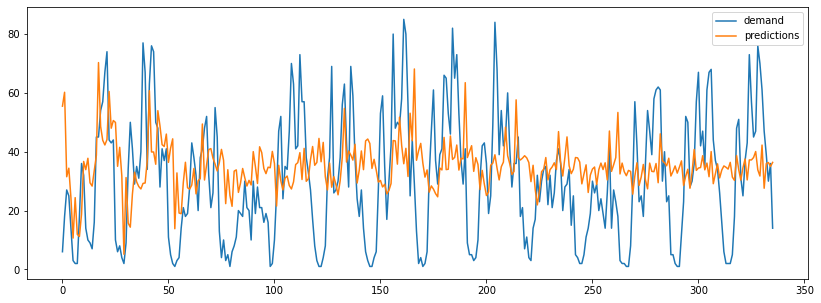

In [103]:
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [104]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_1 = evaluation_model_1.append({'model':'XGBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_1

,model,MSE,MAE,RMSE,R2
0,ForecastAutoreg,612.384337,20.105952,24.746400,-4.888336
1,ForecastAutoreg,485.862672,18.281056,22.042293,-11.156086
2,ForecastAutoreg with exog. variables,126.021387,8.160119,11.225925,0.717933
3,ForecastAutoreg with exog. variables BM,225.565887,10.734731,15.018851,0.547796
4,Linear regresion,240.432612,12.525301,15.505890,-0.139165
5,Linear regresion,264.161275,12.760101,16.253039,-0.958304
6,Linear regresion with exogenous variables,220.631198,12.014795,14.853659,0.212899
7,XGBoost,463.208628,17.657295,21.522282,-6.167822


In [106]:
#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.5),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|██████████████████████████████████████| 2/2 [05:27<00:00, 163.56s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 491.0853263597743



In [107]:
grid_search

,lags,params,metric,learning_rate,max_depth,n_estimators
13,[168],"{'learning_rate': 0.01, 'max_depth': 3, 'n_est...",491.085326,0.01,3.0,500.0
18,[168],"{'learning_rate': 0.1, 'max_depth': 3, 'n_esti...",492.950545,0.10,3.0,100.0
15,[168],"{'learning_rate': 0.01, 'max_depth': 5, 'n_est...",495.326950,0.01,5.0,500.0
20,[168],"{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",496.941178,0.10,5.0,100.0
19,[168],"{'learning_rate': 0.1, 'max_depth': 3, 'n_esti...",499.002713,0.10,3.0,500.0
17,[168],"{'learning_rate': 0.01, 'max_depth': 10, 'n_es...",499.050004,0.01,10.0,500.0
23,[168],"{'learning_rate': 0.1, 'max_depth': 10, 'n_est...",500.006307,0.10,10.0,500.0
22,[168],"{'learning_rate': 0.1, 'max_depth': 10, 'n_est...",500.398464,0.10,10.0,100.0
21,[168],"{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",500.449321,0.10,5.0,500.0
3,"[24, 168]","{'learning_rate': 0.01, 'max_depth': 5, 'n_est...",507.770470,0.01,5.0,500.0


In [108]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_1['rides'],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)


In [110]:
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

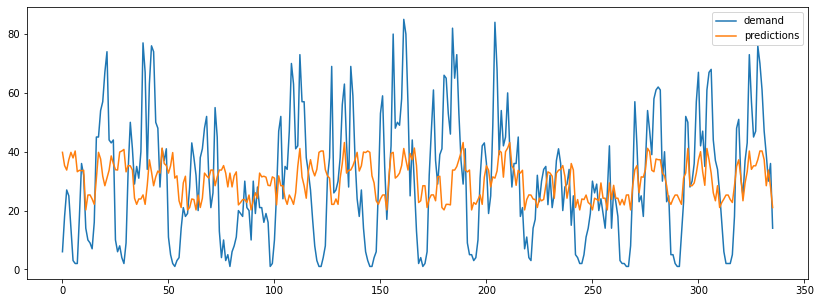

In [111]:
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [112]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_1 = evaluation_model_1.append({'model':'XGBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_1

,model,MSE,MAE,RMSE,R2
0,ForecastAutoreg,612.384337,20.105952,24.746400,-4.888336
1,ForecastAutoreg,485.862672,18.281056,22.042293,-11.156086
2,ForecastAutoreg with exog. variables,126.021387,8.160119,11.225925,0.717933
3,ForecastAutoreg with exog. variables BM,225.565887,10.734731,15.018851,0.547796
4,Linear regresion,240.432612,12.525301,15.505890,-0.139165
5,Linear regresion,264.161275,12.760101,16.253039,-0.958304
6,Linear regresion with exogenous variables,220.631198,12.014795,14.853659,0.212899
7,XGBoost,463.208628,17.657295,21.522282,-6.167822
8,XGBoost,402.692365,16.273249,20.067196,-9.590954


###### Including exogenous variables

In [113]:
forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123),
                lags = 24*7
             )

In [115]:
#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.5),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|██████████████████████████████████████| 2/2 [06:42<00:00, 201.28s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}
  Backtesting metric: 255.16785949008235



In [117]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_1['rides'],
    exog = rides_per_zone_1[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)


In [120]:
#Feature importance
feature_importance = forecaster.get_feature_importance()
feature_importance.sort_values(by='importance', ascending = False, inplace=True)
feature_importance

,feature,importance
25,hour_17,0.076648
12,hour_4,0.071671
8,hour_0,0.070207
9,hour_1,0.070026
26,hour_18,0.067535
21,hour_13,0.066776
10,hour_2,0.065296
11,hour_3,0.064972
15,hour_7,0.038857
31,hour_23,0.038321


In [122]:
predictions

,pred
168,51.026745
169,41.508591
170,37.090336
171,34.384392
172,22.433264
...,...
187,50.941528
188,40.853676
189,37.090336
190,33.729477


In [123]:
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

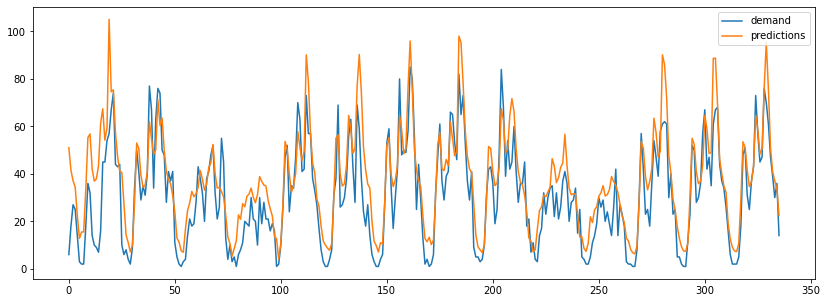

In [124]:
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [126]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_1 = evaluation_model_1.append({'model':'XGBoost with exogenous variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_1

,model,MSE,MAE,RMSE,R2
0,ForecastAutoreg,612.384337,20.105952,24.746400,-4.888336
1,ForecastAutoreg,485.862672,18.281056,22.042293,-11.156086
2,ForecastAutoreg with exog. variables,126.021387,8.160119,11.225925,0.717933
3,ForecastAutoreg with exog. variables BM,225.565887,10.734731,15.018851,0.547796
4,Linear regresion,240.432612,12.525301,15.505890,-0.139165
5,Linear regresion,264.161275,12.760101,16.253039,-0.958304
6,Linear regresion with exogenous variables,220.631198,12.014795,14.853659,0.212899
7,XGBoost,463.208628,17.657295,21.522282,-6.167822
8,XGBoost,402.692365,16.273249,20.067196,-9.590954
9,XGBoost,148.024394,9.359359,12.166528,0.640831


###### LightGBM

In [129]:
forecaster = ForecasterAutoreg(regressor = LGBMRegressor(random_state=123),
                              lags=[24,24*7])
forecaster

ForecasterAutoreg 
Regressor: LGBMRegressor(random_state=123) 
Lags: [ 24 168] 
Window size: 168 
Included exogenous: False 
Type of exogenous variable: None 
Exogenous variables names: None 
Training range: None 
Training index type: None 
Training index frequency: None 
Regressor parameters: {'boosting_type': 'gbdt', 'class_weight': None, 'colsample_bytree': 1.0, 'importance_type': 'split', 'learning_rate': 0.1, 'max_depth': -1, 'min_child_samples': 20, 'min_child_weight': 0.001, 'min_split_gain': 0.0, 'n_estimators': 100, 'n_jobs': -1, 'num_leaves': 31, 'objective': None, 'random_state': 123, 'reg_alpha': 0.0, 'reg_lambda': 0.0, 'silent': 'warn', 'subsample': 1.0, 'subsample_for_bin': 200000, 'subsample_freq': 0} 
Creation date: 2022-05-29 18:43:58 
Last fit date: None 
Skforecast version: 0.4.3 

In [130]:
#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:23<00:00, 11.64s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 203.88079549777



In [131]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_1['rides'],
    exog = rides_per_zone_1[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)


In [132]:
#Feature importance
feature_importance = forecaster.get_feature_importance()
feature_importance.sort_values(by='importance', ascending = False, inplace=True)
feature_importance

,feature,importance
0,lag_168,874
3,weekday_Saturday,251
4,weekday_Sunday,249
14,hour_6,129
36,month_5,95
24,hour_16,85
40,month_9,81
37,month_6,80
1,weekday_Friday,75
32,month_1,74


In [133]:
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

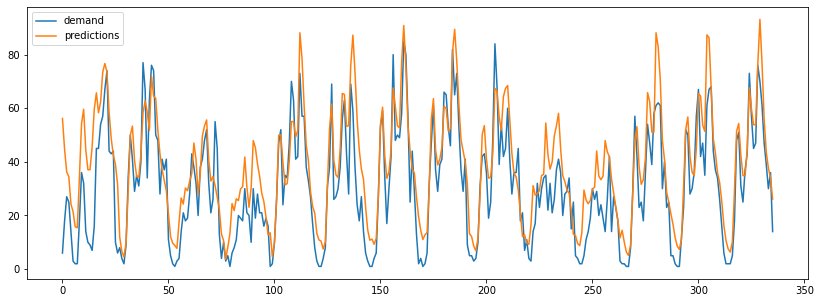

In [136]:
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [137]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_1 = evaluation_model_1.append({'model':'LightGBM with exogenous variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_1

,model,MSE,MAE,RMSE,R2
0,ForecastAutoreg,612.384337,20.105952,24.746400,-4.888336
1,ForecastAutoreg,485.862672,18.281056,22.042293,-11.156086
2,ForecastAutoreg with exog. variables,126.021387,8.160119,11.225925,0.717933
3,ForecastAutoreg with exog. variables BM,225.565887,10.734731,15.018851,0.547796
4,Linear regresion,240.432612,12.525301,15.505890,-0.139165
5,Linear regresion,264.161275,12.760101,16.253039,-0.958304
6,Linear regresion with exogenous variables,220.631198,12.014795,14.853659,0.212899
7,XGBoost,463.208628,17.657295,21.522282,-6.167822
8,XGBoost,402.692365,16.273249,20.067196,-9.590954
9,XGBoost,148.024394,9.359359,12.166528,0.640831


###### CatBoost

In [142]:
forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True),
                              lags = [24*7,24])

In [143]:
#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [01:54<00:00, 57.15s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 10, 'n_estimators': 500}
  Backtesting metric: 201.00387823029916



In [144]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_1['rides'],
    exog = rides_per_zone_1[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)


In [145]:
#Feature importance
feature_importance = forecaster.get_feature_importance()
feature_importance.sort_values(by='importance', ascending = False, inplace=True)
feature_importance

,feature,importance
4,weekday_Sunday,9.023483
25,hour_17,6.704704
3,weekday_Saturday,6.616782
26,hour_18,5.824896
12,hour_4,5.458425
11,hour_3,5.080713
9,hour_1,4.701934
0,lag_168,4.695630
8,hour_0,4.584209
10,hour_2,4.247635


In [146]:
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

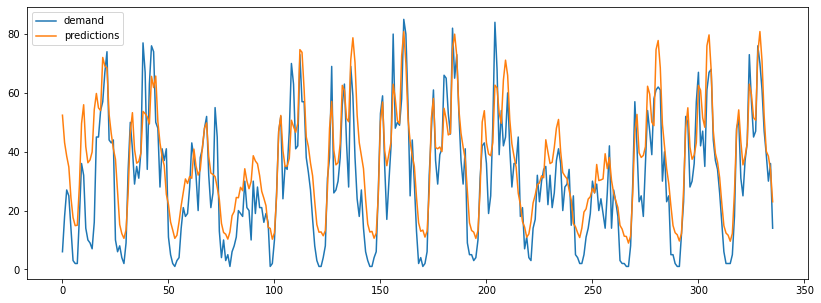

In [147]:
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [148]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_1 = evaluation_model_1.append({'model':'CatBoost with exogenous variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_1

,model,MSE,MAE,RMSE,R2
0,ForecastAutoreg,612.384337,20.105952,24.746400,-4.888336
1,ForecastAutoreg,485.862672,18.281056,22.042293,-11.156086
2,ForecastAutoreg with exog. variables,126.021387,8.160119,11.225925,0.717933
3,ForecastAutoreg with exog. variables BM,225.565887,10.734731,15.018851,0.547796
4,Linear regresion,240.432612,12.525301,15.505890,-0.139165
5,Linear regresion,264.161275,12.760101,16.253039,-0.958304
6,Linear regresion with exogenous variables,220.631198,12.014795,14.853659,0.212899
7,XGBoost,463.208628,17.657295,21.522282,-6.167822
8,XGBoost,402.692365,16.273249,20.067196,-9.590954
9,XGBoost,148.024394,9.359359,12.166528,0.640831


##### Choosing the best model to predict the demand

Now that we have developed different models to predict the demand we are going to choose the model with the best results, so we will use this model to predict the demand of the next 24 hours, now training the model with all the data, not only with the train data

In [150]:
evaluation_model_1.sort_values(by = 'MSE', ascending=True, inplace=True)
evaluation_model_1

,model,MSE,MAE,RMSE,R2
2,ForecastAutoreg with exog. variables,126.021387,8.160119,11.225925,0.717933
12,CatBoost with exogenous variables,135.422503,9.448658,11.637117,0.572822
9,XGBoost,148.024394,9.359359,12.166528,0.640831
10,XGBoost with exogenous variables,148.024394,9.359359,12.166528,0.640831
11,LightGBM with exogenous variables,162.126665,9.987354,12.732897,0.598108
6,Linear regresion with exogenous variables,220.631198,12.014795,14.853659,0.212899
3,ForecastAutoreg with exog. variables BM,225.565887,10.734731,15.018851,0.547796
4,Linear regresion,240.432612,12.525301,15.505890,-0.139165
5,Linear regresion,264.161275,12.760101,16.253039,-0.958304
8,XGBoost,402.692365,16.273249,20.067196,-9.590954


We are going to use the ForecastAutoreg with exogenous variables to predict demand

In [42]:
#Create and train forecaster
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(max_depth=10,n_estimators=500, random_state = 123),
                               lags = [168])
forecaster.fit(y=rides_per_zone_1['rides'], exog = rides_per_zone_1[columns_for_model])
forecaster

ForecasterAutoreg 
Regressor: RandomForestRegressor(max_depth=10, n_estimators=500, random_state=123) 
Lags: [168] 
Window size: 168 
Included exogenous: True 
Type of exogenous variable: <class 'pandas.core.frame.DataFrame'> 
Exogenous variables names: ['weekday_Friday', 'weekday_Monday', 'weekday_Saturday', 'weekday_Sunday', 'weekday_Thursday', 'weekday_Tuesday', 'weekday_Wednesday', 'hour_0', 'hour_1', 'hour_2', 'hour_3', 'hour_4', 'hour_5', 'hour_6', 'hour_7', 'hour_8', 'hour_9', 'hour_10', 'hour_11', 'hour_12', 'hour_13', 'hour_14', 'hour_15', 'hour_16', 'hour_17', 'hour_18', 'hour_19', 'hour_20', 'hour_21', 'hour_22', 'hour_23', 'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12'] 
Training range: [0, 9415] 
Training index type: RangeIndex 
Training index frequency: 1 
Regressor parameters: {'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': 10, 'max_features': 'auto', '

In [43]:
last_day_data = rides_per_zone_1[-1:]
last_day_data = last_day_data.index[0]

In [45]:
exogenous_variables = pd.date_range(last_day_data, periods = 365*24,freq='H')
exogenous_variables = pd.DataFrame(exogenous_variables, columns = ['datetime'])
exogenous_variables = exogenous_variables[1:]
exogenous_variables['hour'] = exogenous_variables['datetime'].dt.hour
exogenous_variables['month'] = exogenous_variables['datetime'].dt.month
exogenous_variables['weekday'] = exogenous_variables['datetime'].dt.day_name()
exogenous_variables.reset_index(inplace=True)
exogenous_variables = pd.get_dummies(exogenous_variables, columns = ['weekday', 'hour', 'month'])
exogenous_variables = exogenous_variables[:steps]
exogenous_variables

,index,datetime,weekday_Friday,weekday_Monday,weekday_Saturday,weekday_Sunday,weekday_Thursday,weekday_Tuesday,weekday_Wednesday,hour_0,...,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,1,2021-07-01 00:00:00,0,0,0,0,1,0,0,1,...,0,0,0,0,1,0,0,0,0,0
1,2,2021-07-01 01:00:00,0,0,0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
2,3,2021-07-01 02:00:00,0,0,0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,4,2021-07-01 03:00:00,0,0,0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
4,5,2021-07-01 04:00:00,0,0,0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
331,332,2021-07-14 19:00:00,0,0,0,0,0,0,1,0,...,0,0,0,0,1,0,0,0,0,0
332,333,2021-07-14 20:00:00,0,0,0,0,0,0,1,0,...,0,0,0,0,1,0,0,0,0,0
333,334,2021-07-14 21:00:00,0,0,0,0,0,0,1,0,...,0,0,0,0,1,0,0,0,0,0
334,335,2021-07-14 22:00:00,0,0,0,0,0,0,1,0,...,0,0,0,0,1,0,0,0,0,0


In [46]:
predictions = forecaster.predict(steps=steps,
                                exog = exogenous_variables[columns_for_model])
predictions = predictions.reset_index()
predictions

,index,pred
0,9416,2.898798
1,9417,2.942485
2,9418,3.313029
3,9419,2.216916
4,9420,1.924609
...,...,...
331,9747,3.040954
332,9748,2.956357
333,9749,2.924718
334,9750,2.909870


In [48]:
predictions_zone_1 = pd.concat([predictions, exogenous_variables], axis = 1)
predictions_zone_1 = predictions_zone_1[['pred', 'datetime']]
predictions_zone_1['hour'] = predictions_zone_1['datetime'].dt.hour
predictions_zone_1['day'] = predictions_zone_1['datetime'].dt.date
predictions_zone_1['model'] = 'Random Forest'
predictions_zone_1['postal_code'] = '28001_0'
predictions_zone_1

,pred,datetime,hour,day,model,postal_code
0,2.898798,2021-07-01 00:00:00,0,2021-07-01,RandomForest,28001_0
1,2.942485,2021-07-01 01:00:00,1,2021-07-01,RandomForest,28001_0
2,3.313029,2021-07-01 02:00:00,2,2021-07-01,RandomForest,28001_0
3,2.216916,2021-07-01 03:00:00,3,2021-07-01,RandomForest,28001_0
4,1.924609,2021-07-01 04:00:00,4,2021-07-01,RandomForest,28001_0
...,...,...,...,...,...,...
331,3.040954,2021-07-14 19:00:00,19,2021-07-14,RandomForest,28001_0
332,2.956357,2021-07-14 20:00:00,20,2021-07-14,RandomForest,28001_0
333,2.924718,2021-07-14 21:00:00,21,2021-07-14,RandomForest,28001_0
334,2.909870,2021-07-14 22:00:00,22,2021-07-14,RandomForest,28001_0


###### Dataframe with predictions

We are going to create a dataframe where we are going to store all the predictions of all the zones. We will save it into a csv file to use it in the frontend

In [49]:
predictions_per_zone = predictions_zone_1
predictions_per_zone.to_csv("predictions_per_zone.csv")

In [50]:
predictions_per_zone

,pred,datetime,hour,day,model,postal_code
0,2.898798,2021-07-01 00:00:00,0,2021-07-01,RandomForest,28001_0
1,2.942485,2021-07-01 01:00:00,1,2021-07-01,RandomForest,28001_0
2,3.313029,2021-07-01 02:00:00,2,2021-07-01,RandomForest,28001_0
3,2.216916,2021-07-01 03:00:00,3,2021-07-01,RandomForest,28001_0
4,1.924609,2021-07-01 04:00:00,4,2021-07-01,RandomForest,28001_0
...,...,...,...,...,...,...
331,3.040954,2021-07-14 19:00:00,19,2021-07-14,RandomForest,28001_0
332,2.956357,2021-07-14 20:00:00,20,2021-07-14,RandomForest,28001_0
333,2.924718,2021-07-14 21:00:00,21,2021-07-14,RandomForest,28001_0
334,2.909870,2021-07-14 22:00:00,22,2021-07-14,RandomForest,28001_0


### 4.2.2. Demand prediction for zone: 28001_1

In [51]:
rides_per_zone_2 = rides_per_station[rides_per_station['postal_code']=="28001_1"]
rides_per_zone_2 = rides_per_zone_2.groupby(['date', 'weekday', 'hour', 'month',
                                             'year', 'time','datetime']).rides.sum().reset_index()
#Converting the column datetime to a datetime format
rides_per_zone_2['datetime'] = pd.to_datetime(rides_per_zone_2['datetime'])
#Resample to fill all values of the time series
rides_per_zone_2.set_index('datetime',inplace=True)
rides_per_zone_2.sort_index(inplace=True)
rides_per_zone_2.resample('1H').sum()


,hour,month,year,rides
datetime,,,,
2020-12-16 16:00:00,16,12,2020,1
2020-12-16 17:00:00,17,12,2020,2
2020-12-16 18:00:00,18,12,2020,1
2020-12-16 19:00:00,0,0,0,0
2020-12-16 20:00:00,0,0,0,0
...,...,...,...,...
2021-06-30 19:00:00,19,6,2021,10
2021-06-30 20:00:00,20,6,2021,7
2021-06-30 21:00:00,21,6,2021,3


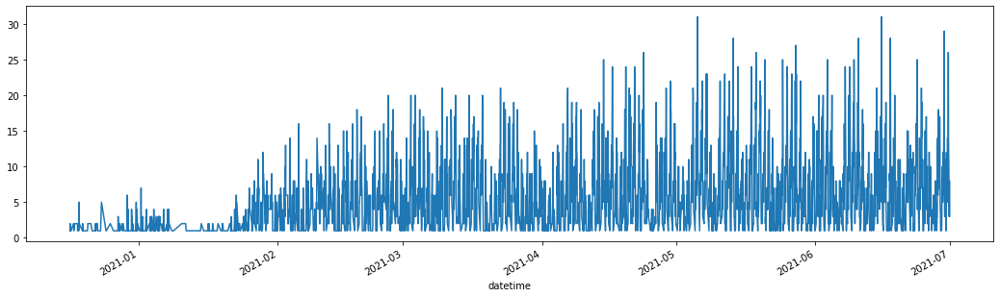

In [52]:
plt.figure(figsize=(18,5))

rides_per_zone_2['rides'].plot()
plt.show()

In [53]:
#Adding lag values
rides_per_zone_2['rides_lag_7'] = rides_per_zone_2['rides'].shift(7*24)
rides_per_zone_2['rides_lag_1'] = rides_per_zone_2['rides'].shift(1*24)
rides_per_zone_2['rides_lag_2'] = rides_per_zone_2['rides'].shift(2*24)
rides_per_zone_2['rides_lag_1_month'] = rides_per_zone_2['rides'].shift(30*24)
rides_per_zone_2['rides_lag_12_hours'] = rides_per_zone_2['rides'].shift(12)

In [238]:
#Dataframe to evaluate models
evaluation_model_2 = pd.DataFrame(columns=["model", "MSE", "MAE", "RMSE", "R2"])

In [225]:
rides_per_zone_2

,date,weekday,hour,month,year,time,rides,rides_lag_7,rides_lag_1,rides_lag_2,rides_lag_1_month,rides_lag_12_hours
datetime,,,,,,,,,,,,
2018-12-31 23:00:00,2018-12-31,Monday,23,12,2018,23:00:00,4,NaN,NaN,NaN,NaN,NaN
2019-01-01 00:00:00,2019-01-01,Tuesday,0,1,2019,00:00:00,4,NaN,NaN,NaN,NaN,NaN
2019-01-01 01:00:00,2019-01-01,Tuesday,1,1,2019,01:00:00,5,NaN,NaN,NaN,NaN,NaN
2019-01-01 02:00:00,2019-01-01,Tuesday,2,1,2019,02:00:00,3,NaN,NaN,NaN,NaN,NaN
2019-01-01 03:00:00,2019-01-01,Tuesday,3,1,2019,03:00:00,2,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
2021-06-30 19:00:00,2021-06-30,Wednesday,19,6,2021,19:00:00,38,71.0,69.0,47.0,31.0,42.0
2021-06-30 20:00:00,2021-06-30,Wednesday,20,6,2021,20:00:00,34,46.0,51.0,40.0,44.0,33.0
2021-06-30 21:00:00,2021-06-30,Wednesday,21,6,2021,21:00:00,31,34.0,42.0,31.0,33.0,40.0


In [54]:
#One hot encoding
rides_per_zone_2 = pd.get_dummies(rides_per_zone_2, columns = ['weekday', 'hour', 'month'])
#We save the columns we are using as predictors in columns for model and the target we want to predict in target
columns_for_model = [column for column in rides_per_zone_2.columns
                      if column.startswith(('weekday', 'hour', 'month'))]

#columns_for_model.extend(['is_holiday_x', 'is_weekend'])

target = 'rides'

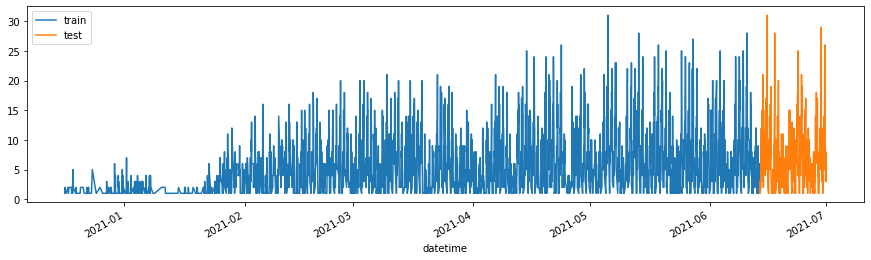

In [55]:
steps = 24*14 # 14 days
train = rides_per_zone_2[:-steps]
test = rides_per_zone_2[-steps:]

fig, ax = plt.subplots(figsize=(15, 4))
train['rides'].plot(ax=ax, label='train')
test['rides'].plot(ax=ax, label='test')
ax.legend();

###### Random forest

In [237]:
#Looking for the best hyperparameters: grid search

steps = 14*24
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123),
                              lags = [24*7])
#Number of lags used as predictors
lags_grid = [[24,24*2,24*3,24*4,24*5,24*6,24*7], [24*7]]

#Regressor hyperparameters
param_grid = {'n_estimators':[100,200,500],
             'max_depth': [3,5,10]}

#Grid search
grid_seach = grid_search_forecaster(forecaster = forecaster,
                                   y = train['rides'],
                                   exog = train[columns_for_model],
                                   param_grid = param_grid,
                                   lags_grid = lags_grid,
                                   steps = steps,
                                   refit = True,
                                   metric = 'mean_squared_error',
                                   initial_train_size = int(len(train)*0.25),
                                   fixed_train_size=False,
                                   return_best=True,
                                   verbose=False)

loop param_grid:   0%|                                              | 0/9 [00:00<?, ?it/s]

Number of models compared: 18



loop lags_grid: 100%|███████████████████████████████████| 2/2 [2:04:25<00:00, 3732.52s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'max_depth': 10, 'n_estimators': 100}
  Backtesting metric: 118.7023250753822



In [239]:
grid_seach

,lags,params,metric,max_depth,n_estimators
15,[168],"{'max_depth': 10, 'n_estimators': 100}",118.702325,10,100
17,[168],"{'max_depth': 10, 'n_estimators': 500}",118.720142,10,500
16,[168],"{'max_depth': 10, 'n_estimators': 200}",118.758588,10,200
8,"[24, 48, 72, 96, 120, 144, 168]","{'max_depth': 10, 'n_estimators': 500}",137.245326,10,500
6,"[24, 48, 72, 96, 120, 144, 168]","{'max_depth': 10, 'n_estimators': 100}",137.346078,10,100
7,"[24, 48, 72, 96, 120, 144, 168]","{'max_depth': 10, 'n_estimators': 200}",137.350004,10,200
13,[168],"{'max_depth': 5, 'n_estimators': 200}",145.319336,5,200
14,[168],"{'max_depth': 5, 'n_estimators': 500}",145.339774,5,500
12,[168],"{'max_depth': 5, 'n_estimators': 100}",145.579361,5,100
3,"[24, 48, 72, 96, 120, 144, 168]","{'max_depth': 5, 'n_estimators': 100}",159.527032,5,100


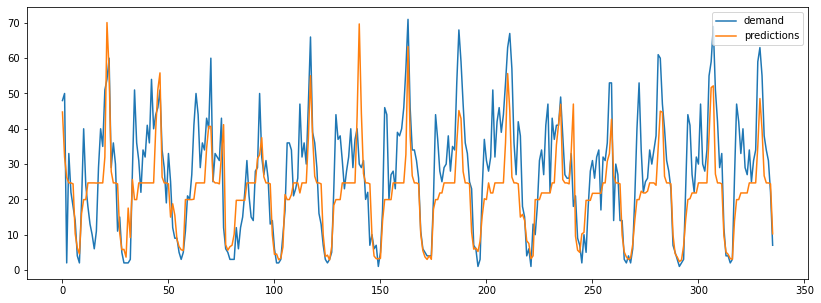

In [240]:
#Create and train forecaster
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123, max_depth = 10, n_estimators = 100),
                              lags = [168])
forecaster.fit(y=train['rides'], exog = train[columns_for_model])

#Predictions and demand
predictions = forecaster.predict(steps=steps, exog = test[columns_for_model])
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [241]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_2 = evaluation_model_2.append({'model':'ForecastAutoreg with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_2

,model,MSE,MAE,RMSE,R2
0,ForecastAutoreg with exog. variables,134.492505,8.749236,11.59709,0.012693


###### Cat boost

In [242]:
forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True),
                              lags = [24*7,24])
#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [02:02<00:00, 61.00s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 169.86404228038478



In [248]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_2['rides'],
    exog = rides_per_zone_2[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)


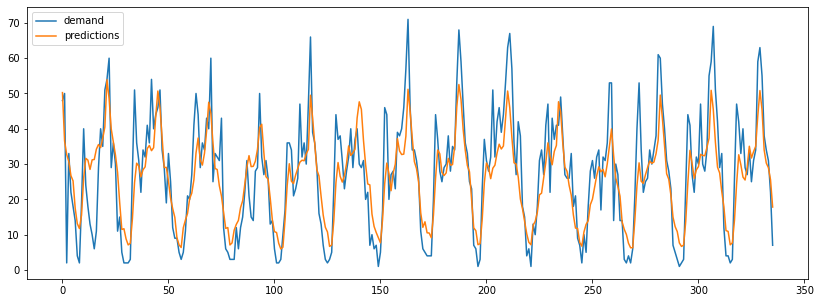

In [251]:
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [249]:
demand

0      48
1      50
2       2
3      33
4      22
       ..
331    38
332    34
333    31
334    22
335     7
Name: rides, Length: 336, dtype: int64

In [252]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_2 = evaluation_model_2.append({'model':'ForecastAutoreg with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_2

,model,MSE,MAE,RMSE,R2
0,ForecastAutoreg with exog. variables,134.492505,8.749236,11.59709,0.012693
1,ForecastAutoreg with exog. variables,82.563931,7.089118,9.08647,0.353266


In [250]:
predictions

,pred
168,50.248917
169,36.548964
170,32.715182
171,30.707684
172,26.710231
...,...
187,33.985477
188,30.278163
189,28.972105
190,25.569522


###### XGboost

In [253]:
forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123),
                lags = 24*7
             )
#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.5),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|██████████████████████████████████████| 2/2 [06:45<00:00, 202.88s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 130.4631859021839



In [254]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_2['rides'],
    exog = rides_per_zone_2[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)

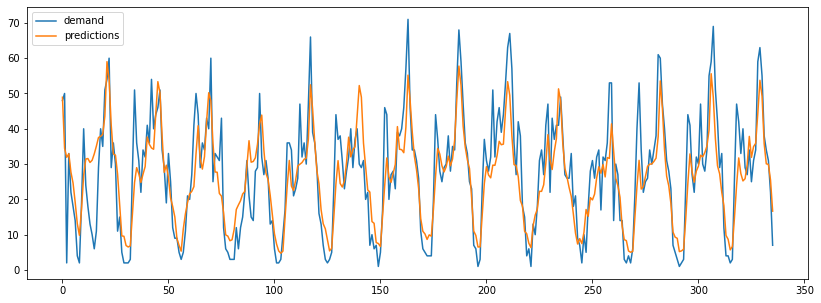

In [255]:
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [257]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_2 = evaluation_model_2.append({'model':'XGBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_2

,model,MSE,MAE,RMSE,R2
0,ForecastAutoreg with exog. variables,134.492505,8.749236,11.597090,0.012693
1,ForecastAutoreg with exog. variables,82.563931,7.089118,9.086470,0.353266
2,ForecastAutoreg with exog. variables,78.706539,6.778551,8.871671,0.480699
3,XGBoost,78.706539,6.778551,8.871671,0.480699


##### Light GBM with exogenous variables

In [258]:
forecaster = ForecasterAutoreg(regressor = LGBMRegressor(random_state=123),
                              lags=[24,24*7])

In [259]:
#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:23<00:00, 11.51s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 173.75435298419248



In [262]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_2['rides'],
    exog = rides_per_zone_2[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)

predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_2 = evaluation_model_2.append({'model':'LightGBM', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_2

,model,MSE,MAE,RMSE,R2
0,ForecastAutoreg with exog. variables,134.492505,8.749236,11.597090,0.012693
1,ForecastAutoreg with exog. variables,82.563931,7.089118,9.086470,0.353266
2,ForecastAutoreg with exog. variables,78.706539,6.778551,8.871671,0.480699
3,XGBoost,78.706539,6.778551,8.871671,0.480699
4,LightGBM,79.126779,6.806242,8.895323,0.463470


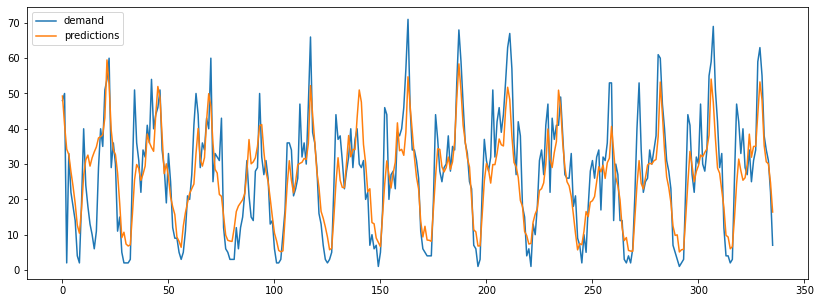

In [263]:
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

###### Choosing the best model

In [264]:
evaluation_model_2.sort_values(by = 'MSE', ascending=True, inplace=True)
evaluation_model_2

,model,MSE,MAE,RMSE,R2
2,ForecastAutoreg with exog. variables,78.706539,6.778551,8.871671,0.480699
3,XGBoost,78.706539,6.778551,8.871671,0.480699
4,LightGBM,79.126779,6.806242,8.895323,0.463470
1,ForecastAutoreg with exog. variables,82.563931,7.089118,9.086470,0.353266
0,ForecastAutoreg with exog. variables,134.492505,8.749236,11.597090,0.012693


The best model is the XGBoost

In [58]:
#creating and training the forecaster
forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123, learning_rate= 0.1, max_depth = 3, n_estimators = 500),
                lags = 24*7
             )

forecaster.fit(y=rides_per_zone_2['rides'], exog = rides_per_zone_2[columns_for_model])

In [59]:
#Obtaining exogenous variables for the model
last_day_data = rides_per_zone_2[-1:]
last_day_data = last_day_data.index[0]

exogenous_variables = pd.date_range(last_day_data, periods = 365*24,freq='H')
exogenous_variables = pd.DataFrame(exogenous_variables, columns = ['datetime'])
exogenous_variables = exogenous_variables[1:]
exogenous_variables['hour'] = exogenous_variables['datetime'].dt.hour
exogenous_variables['month'] = exogenous_variables['datetime'].dt.month
exogenous_variables['weekday'] = exogenous_variables['datetime'].dt.day_name()
exogenous_variables.reset_index(inplace=True)
exogenous_variables = pd.get_dummies(exogenous_variables, columns = ['weekday', 'hour', 'month'])
exogenous_variables = exogenous_variables[:steps]


In [60]:
#Obtaining the predictions and save them in the csv
predictions = forecaster.predict(steps=steps,
                                exog = exogenous_variables[columns_for_model])
predictions = predictions.reset_index()

predictions_zone_2 = pd.concat([predictions, exogenous_variables], axis = 1)
predictions_zone_2 = predictions_zone_2[['pred', 'datetime']]
predictions_zone_2['hour'] = predictions_zone_2['datetime'].dt.hour
predictions_zone_2['day'] = predictions_zone_2['datetime'].dt.date
predictions_zone_2['model'] = 'XGBoost'
predictions_zone_2['postal_code'] = '28001_1'

predictions_per_zone = predictions_per_zone.append(predictions_zone_2)
predictions_per_zone.to_csv("predictions_per_zone.csv")

In [61]:
predictions_per_zone

,pred,datetime,hour,day,model,postal_code
0,2.898798,2021-07-01 00:00:00,0,2021-07-01,RandomForest,28001_0
1,2.942485,2021-07-01 01:00:00,1,2021-07-01,RandomForest,28001_0
2,3.313029,2021-07-01 02:00:00,2,2021-07-01,RandomForest,28001_0
3,2.216916,2021-07-01 03:00:00,3,2021-07-01,RandomForest,28001_0
4,1.924609,2021-07-01 04:00:00,4,2021-07-01,RandomForest,28001_0
...,...,...,...,...,...,...
331,5.877205,2021-07-14 19:00:00,19,2021-07-14,XGBoost,28001_1
332,4.427597,2021-07-14 20:00:00,20,2021-07-14,XGBoost,28001_1
333,3.625057,2021-07-14 21:00:00,21,2021-07-14,XGBoost,28001_1
334,3.557650,2021-07-14 22:00:00,22,2021-07-14,XGBoost,28001_1


### 4.2.3. Demand prediction for zone: 28001_2


In [63]:
#Creating the dataframe
rides_per_zone_3 = rides_per_station[rides_per_station['postal_code']=="28001_2"]
rides_per_zone_3 = rides_per_zone_3.groupby(['date', 'weekday', 'hour', 'month',
                                             'year', 'time','datetime']).rides.sum().reset_index()
#Converting the column datetime to a datetime format
rides_per_zone_3['datetime'] = pd.to_datetime(rides_per_zone_3['datetime'])
#Resample to fill all values of the time series
rides_per_zone_3.set_index('datetime',inplace=True)
rides_per_zone_3.sort_index(inplace=True)
rides_per_zone_3.resample('1H').sum()

#Adding lag values
rides_per_zone_3['rides_lag_7'] = rides_per_zone_3['rides'].shift(7*24)
rides_per_zone_3['rides_lag_1'] = rides_per_zone_3['rides'].shift(1*24)
rides_per_zone_3['rides_lag_2'] = rides_per_zone_3['rides'].shift(2*24)
rides_per_zone_3['rides_lag_1_month'] = rides_per_zone_3['rides'].shift(30*24)
rides_per_zone_3['rides_lag_12_hours'] = rides_per_zone_3['rides'].shift(12)

#One hot encoding
rides_per_zone_3 = pd.get_dummies(rides_per_zone_3, columns = ['weekday', 'hour', 'month'])
#We save the columns we are using as predictors in columns for model and the target we want to predict in target
columns_for_model = [column for column in rides_per_zone_3.columns
                      if column.startswith(('weekday', 'hour', 'month'))]



target = 'rides'
#Division in train and test
steps = 24*14 # 14 days
train = rides_per_zone_3[:-steps]
test = rides_per_zone_3[-steps:]


#Dataframe to evaluate models
evaluation_model_3 = pd.DataFrame(columns=["model", "MSE", "MAE", "RMSE", "R2"])

###### Random forest

In [281]:
#Looking for the best hyperparameters: grid search

steps = 14*24
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123),
                              lags = [24*7])
#Number of lags used as predictors
lags_grid = [[24,24*2,24*3,24*4,24*5,24*6,24*7], [24*7]]

#Regressor hyperparameters
param_grid = {'n_estimators':[100,200,500],
             'max_depth': [3,5,10]}

#Grid search
grid_seach = grid_search_forecaster(forecaster = forecaster,
                                   y = train['rides'],
                                   exog = train[columns_for_model],
                                   param_grid = param_grid,
                                   lags_grid = lags_grid,
                                   steps = steps,
                                   refit = True,
                                   metric = 'mean_squared_error',
                                   initial_train_size = int(len(train)*0.25),
                                   fixed_train_size=False,
                                   return_best=True,
                                   verbose=False)

loop param_grid:   0%|                                              | 0/9 [00:00<?, ?it/s]

Number of models compared: 18



loop lags_grid: 100%|██████████████████████████████████████| 2/2 [07:58<00:00, 239.40s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'max_depth': 10, 'n_estimators': 100}
  Backtesting metric: 17.53352066742378



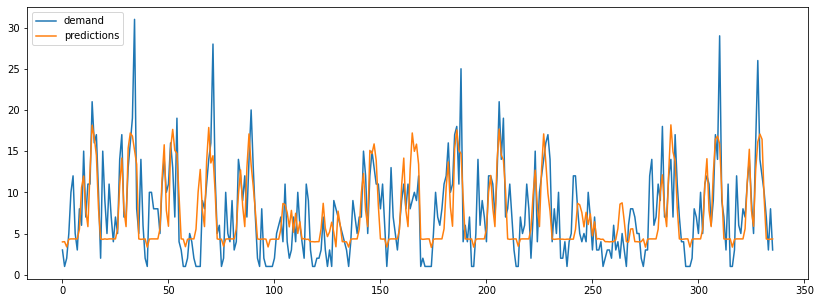

In [282]:
#Create and train forecaster
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123, max_depth = 10, n_estimators = 100),
                              lags = [168])
forecaster.fit(y=train['rides'], exog = train[columns_for_model])

#Predictions and demand
predictions = forecaster.predict(steps=steps, exog = test[columns_for_model])
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [284]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_3 = evaluation_model_3.append({'model':'ForecastAutoreg with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_3

,model,MSE,MAE,RMSE,R2
0,ForecastAutoreg with exog. variables,14.492841,2.954433,3.806946,0.167139


##### Cat boost

In [291]:
forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True),
                              lags = [24*7,24])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:18<00:00,  9.04s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 24 168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 500}
  Backtesting metric: 14.668161380053347



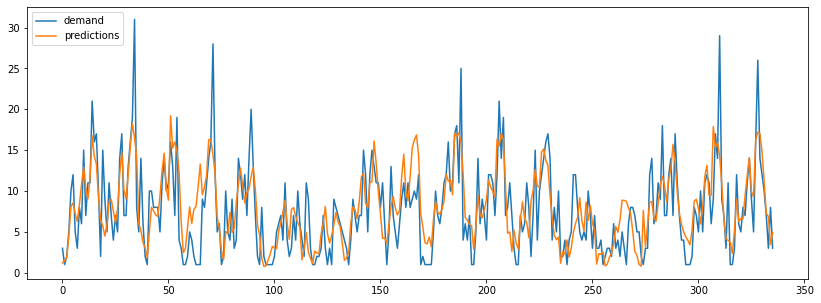

In [292]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_3['rides'],
    exog = rides_per_zone_3[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [293]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_3 = evaluation_model_3.append({'model':'Catboost with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_3

,model,MSE,MAE,RMSE,R2
0,ForecastAutoreg with exog. variables,14.492841,2.954433,3.806946,0.167139
1,Catboost with exog. variables,30.010484,4.301300,5.478183,-9.032053
2,XGBoost,14.448725,2.828091,3.801148,0.272418
3,Catboost with exog. variables,13.315880,2.785711,3.649093,0.262464


##### XGBoost

In [288]:
forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123),
                lags = 24*7
             )
#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.5),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:53<00:00, 26.72s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 10, 'n_estimators': 500}
  Backtesting metric: 29.30782708168065



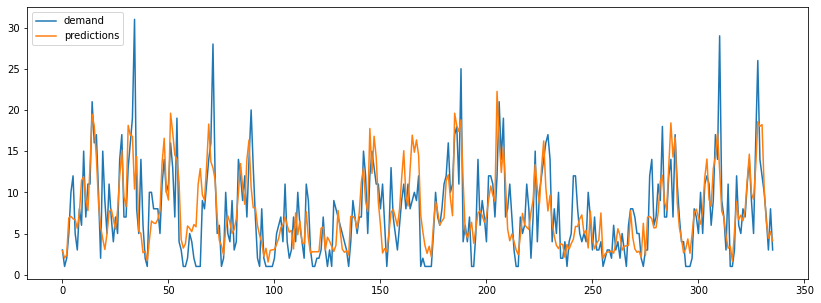

In [289]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_3['rides'],
    exog = rides_per_zone_3[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [290]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_3 = evaluation_model_3.append({'model':'XGBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_3

,model,MSE,MAE,RMSE,R2
0,ForecastAutoreg with exog. variables,14.492841,2.954433,3.806946,0.167139
1,Catboost with exog. variables,30.010484,4.301300,5.478183,-9.032053
2,XGBoost,14.448725,2.828091,3.801148,0.272418


##### Light GBM

In [294]:
forecaster = ForecasterAutoreg(regressor = LGBMRegressor(random_state=123),
                              lags=[24,24*7])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   8%|███                                  | 1/12 [00:00<00:01,  7.41it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:04<00:00,  2.38s/it]

`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 24 168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 16.649779108107307



In [295]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_3['rides'],
    exog = rides_per_zone_3[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)

predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_3 = evaluation_model_3.append({'model':'LightGBM', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_3

,model,MSE,MAE,RMSE,R2
0,ForecastAutoreg with exog. variables,14.492841,2.954433,3.806946,0.167139
1,Catboost with exog. variables,30.010484,4.301300,5.478183,-9.032053
2,XGBoost,14.448725,2.828091,3.801148,0.272418
3,Catboost with exog. variables,13.315880,2.785711,3.649093,0.262464
4,LightGBM,14.097996,2.898997,3.754730,0.127810


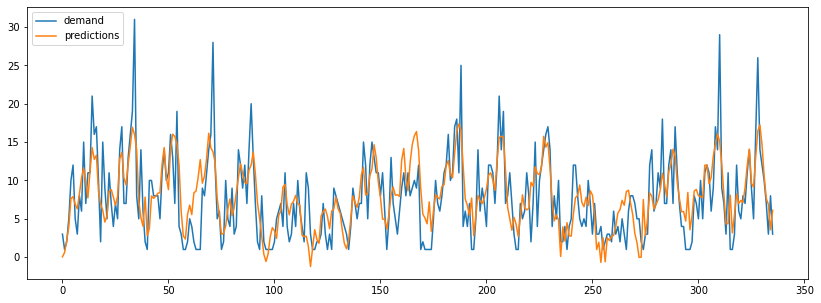

In [296]:
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

###### Choosing the best model

In [297]:
evaluation_model_3.sort_values(by = 'MSE', ascending=True, inplace=True)
evaluation_model_3

,model,MSE,MAE,RMSE,R2
3,Catboost with exog. variables,13.315880,2.785711,3.649093,0.262464
4,LightGBM,14.097996,2.898997,3.754730,0.127810
2,XGBoost,14.448725,2.828091,3.801148,0.272418
0,ForecastAutoreg with exog. variables,14.492841,2.954433,3.806946,0.167139
1,Catboost with exog. variables,30.010484,4.301300,5.478183,-9.032053


The best model is Cat Boost

In [64]:
#creating and training the forecaster
forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True, learning_rate = 0.1, 
                                                             max_depth = 5, n_estimators = 500),
                              lags = [24*7,24])

forecaster.fit(y=rides_per_zone_3['rides'], exog = rides_per_zone_3[columns_for_model])

#Obtaining exogenous variables for the model
last_day_data = rides_per_zone_3[-1:]
last_day_data = last_day_data.index[0]

exogenous_variables = pd.date_range(last_day_data, periods = 365*24,freq='H')
exogenous_variables = pd.DataFrame(exogenous_variables, columns = ['datetime'])
exogenous_variables = exogenous_variables[1:]
exogenous_variables['hour'] = exogenous_variables['datetime'].dt.hour
exogenous_variables['month'] = exogenous_variables['datetime'].dt.month
exogenous_variables['weekday'] = exogenous_variables['datetime'].dt.day_name()
exogenous_variables.reset_index(inplace=True)
exogenous_variables = pd.get_dummies(exogenous_variables, columns = ['weekday', 'hour', 'month'])
exogenous_variables = exogenous_variables[:steps]

#Obtaining the predictions and save them in the csv
predictions = forecaster.predict(steps=steps,
                                exog = exogenous_variables[columns_for_model])
predictions = predictions.reset_index()

predictions_zone_3 = pd.concat([predictions, exogenous_variables], axis = 1)
predictions_zone_3 = predictions_zone_3[['pred', 'datetime']]
predictions_zone_3['hour'] = predictions_zone_3['datetime'].dt.hour
predictions_zone_3['day'] = predictions_zone_3['datetime'].dt.date
predictions_zone_3['model'] = 'XGBoost'
predictions_zone_3['postal_code'] = '28001_2'

predictions_per_zone = predictions_per_zone.append(predictions_zone_3)
predictions_per_zone.to_csv("predictions_per_zone.csv")

### 4.2.4. Demand prediction for zone: 28001_3


In [104]:
#Creating the dataframe
rides_per_zone_4 = rides_per_station[rides_per_station['postal_code']=="28001_3"]
rides_per_zone_4 = rides_per_zone_4.groupby(['date', 'weekday', 'hour', 'month',
                                             'year', 'time','datetime']).rides.sum().reset_index()
#Converting the column datetime to a datetime format
rides_per_zone_4['datetime'] = pd.to_datetime(rides_per_zone_4['datetime'])
#Resample to fill all values of the time series
rides_per_zone_4.set_index('datetime',inplace=True)
rides_per_zone_4.sort_index(inplace=True)
rides_per_zone_4.resample('1H').sum()

#Adding lag values
rides_per_zone_4['rides_lag_7'] = rides_per_zone_4['rides'].shift(7*24)
rides_per_zone_4['rides_lag_1'] = rides_per_zone_4['rides'].shift(1*24)
rides_per_zone_4['rides_lag_2'] = rides_per_zone_4['rides'].shift(2*24)
rides_per_zone_4['rides_lag_1_month'] = rides_per_zone_4['rides'].shift(30*24)
rides_per_zone_4['rides_lag_12_hours'] = rides_per_zone_4['rides'].shift(12)

#One hot encoding
rides_per_zone_4 = pd.get_dummies(rides_per_zone_4, columns = ['weekday', 'hour', 'month'])
#We save the columns we are using as predictors in columns for model and the target we want to predict in target
columns_for_model = [column for column in rides_per_zone_3.columns
                      if column.startswith(('weekday', 'hour', 'month'))]

target = 'rides'
#Division in train and test
steps = 24*14 # 14 days
train = rides_per_zone_4[:-steps]
test = rides_per_zone_4[-steps:]

#Dataframe to evaluate models
evaluation_model_4 = pd.DataFrame(columns=["model", "MSE", "MAE", "RMSE", "R2"])

##### Random forest

In [106]:
#Looking for the best hyperparameters: grid search

steps = 14*24
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123),
                              lags = [24*7])
#Number of lags used as predictors
lags_grid = [[24,24*2,24*3,24*4,24*5,24*6,24*7], [24*7]]

#Regressor hyperparameters
param_grid = {'n_estimators':[100,200,500],
             'max_depth': [3,5,10]}

#Grid search
grid_seach = grid_search_forecaster(forecaster = forecaster,
                                   y = train['rides'],
                                   exog = train[columns_for_model],
                                   param_grid = param_grid,
                                   lags_grid = lags_grid,
                                   steps = steps,
                                   refit = True,
                                   metric = 'mean_squared_error',
                                   initial_train_size = int(len(train)*0.25),
                                   fixed_train_size=False,
                                   return_best=True,
                                   verbose=False)

loop param_grid:   0%|                                              | 0/9 [00:00<?, ?it/s]

Number of models compared: 18



loop lags_grid: 100%|███████████████████████████████████| 2/2 [1:37:19<00:00, 2919.82s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'max_depth': 10, 'n_estimators': 200}
  Backtesting metric: 130.28161840943227



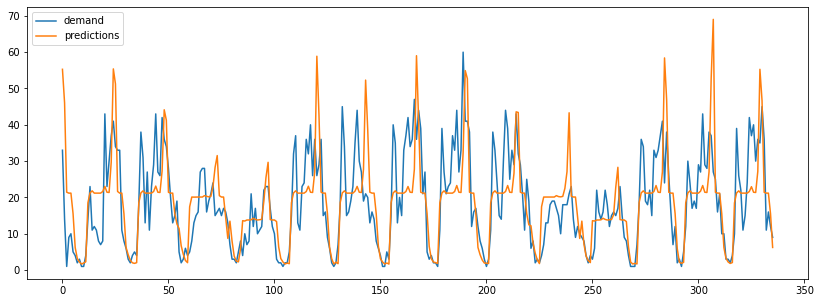

In [108]:
#Create and train forecaster
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123, max_depth = 10, n_estimators = 200),
                              lags = [168])
forecaster.fit(y=train['rides'], exog = train[columns_for_model])

#Predictions and demand
predictions = forecaster.predict(steps=steps, exog = test[columns_for_model])
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [109]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_4 = evaluation_model_4.append({'model':'ForecastAutoreg with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_4

,model,MSE,MAE,RMSE,R2
0,ForecastAutoreg with exog. variables,96.237016,7.209422,9.810047,0.284274


###### Cat Boost

In [110]:
forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True),
                              lags = [24*7,24])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [01:56<00:00, 58.32s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 24 168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 500}
  Backtesting metric: 87.67528491177833



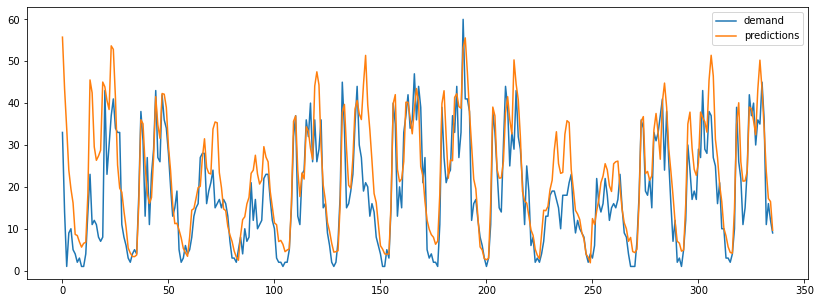

In [111]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_4['rides'],
    exog = rides_per_zone_4[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [112]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_4 = evaluation_model_4.append({'model':'Catboost with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_4

,model,MSE,MAE,RMSE,R2
0,ForecastAutoreg with exog. variables,96.237016,7.209422,9.810047,0.284274
1,Catboost with exog. variables,74.827605,6.216887,8.650295,0.580137


###### XGBoost

In [113]:
forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123),
                lags = 24*7
             )
#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.5),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|██████████████████████████████████████| 2/2 [06:38<00:00, 199.46s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 117.95053091604575



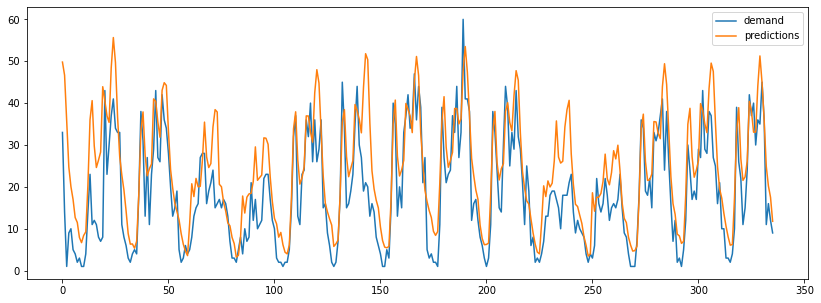

In [114]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_4['rides'],
    exog = rides_per_zone_4[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [117]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_4 = evaluation_model_4.append({'model':'XGBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_4

,model,MSE,MAE,RMSE,R2
0,XGBoost,86.691965,7.134701,9.310852,0.468059
1,XGBoost,86.691965,7.134701,9.310852,0.468059
2,XGBoost,86.691965,7.134701,9.310852,0.468059


##### Light GBM

In [118]:
forecaster = ForecasterAutoreg(regressor = LGBMRegressor(random_state=123),
                              lags=[24,24*7])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:26<00:00, 13.12s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 24 168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 10, 'n_estimators': 100}
  Backtesting metric: 88.00793497601708



In [119]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_4['rides'],
    exog = rides_per_zone_4[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)

predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_4 = evaluation_model_4.append({'model':'LightGBM', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_4

,model,MSE,MAE,RMSE,R2
0,XGBoost,86.691965,7.134701,9.310852,0.468059
1,XGBoost,86.691965,7.134701,9.310852,0.468059
2,XGBoost,86.691965,7.134701,9.310852,0.468059
3,LightGBM,77.463996,6.212590,8.801363,0.593062


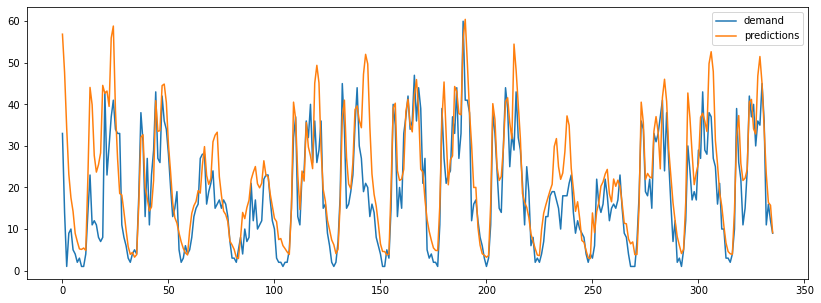

In [120]:
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

###### Choosing the best model

The best model for this zone is the CatBoost with exogenous variables

In [121]:
#creating and training the forecaster

forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True, learning_rate = 0.1, 
                                                             max_depth = 5, n_estimators = 500),
                              lags = [24*7,24])

forecaster.fit(y=rides_per_zone_4['rides'], exog = rides_per_zone_4[columns_for_model])

#Obtaining exogenous variables for the model
last_day_data = rides_per_zone_4[-1:]
last_day_data = last_day_data.index[0]

exogenous_variables = pd.date_range(last_day_data, periods = 365*24,freq='H')
exogenous_variables = pd.DataFrame(exogenous_variables, columns = ['datetime'])
exogenous_variables = exogenous_variables[1:]
exogenous_variables['hour'] = exogenous_variables['datetime'].dt.hour
exogenous_variables['month'] = exogenous_variables['datetime'].dt.month
exogenous_variables['weekday'] = exogenous_variables['datetime'].dt.day_name()
exogenous_variables.reset_index(inplace=True)
exogenous_variables = pd.get_dummies(exogenous_variables, columns = ['weekday', 'hour', 'month'])
exogenous_variables = exogenous_variables[:steps]

#Obtaining the predictions and save them in the csv
predictions = forecaster.predict(steps=steps,
                                exog = exogenous_variables[columns_for_model])
predictions = predictions.reset_index()

predictions_zone_4 = pd.concat([predictions, exogenous_variables], axis = 1)
predictions_zone_4 = predictions_zone_4[['pred', 'datetime']]
predictions_zone_4['hour'] = predictions_zone_4['datetime'].dt.hour
predictions_zone_4['day'] = predictions_zone_4['datetime'].dt.date
predictions_zone_4['model'] = 'XGBoost'
predictions_zone_4['postal_code'] = '28001_3'

predictions_per_zone = predictions_per_zone.append(predictions_zone_4)
predictions_per_zone.to_csv("predictions_per_zone.csv")

### 4.2.5. Demand prediction for zone: 28001_4


In [122]:
#Creating the dataframe
rides_per_zone_5 = rides_per_station[rides_per_station['postal_code']=="28001_4"]
rides_per_zone_5 = rides_per_zone_5.groupby(['date', 'weekday', 'hour', 'month',
                                             'year', 'time','datetime']).rides.sum().reset_index()
#Converting the column datetime to a datetime format
rides_per_zone_5['datetime'] = pd.to_datetime(rides_per_zone_5['datetime'])
#Resample to fill all values of the time series
rides_per_zone_5.set_index('datetime',inplace=True)
rides_per_zone_5.sort_index(inplace=True)
rides_per_zone_5.resample('1H').sum()

#Adding lag values
rides_per_zone_5['rides_lag_7'] = rides_per_zone_5['rides'].shift(7*24)
rides_per_zone_5['rides_lag_1'] = rides_per_zone_5['rides'].shift(1*24)
rides_per_zone_5['rides_lag_2'] = rides_per_zone_5['rides'].shift(2*24)
rides_per_zone_5['rides_lag_1_month'] = rides_per_zone_5['rides'].shift(30*24)
rides_per_zone_5['rides_lag_12_hours'] = rides_per_zone_5['rides'].shift(12)

#One hot encoding
rides_per_zone_5 = pd.get_dummies(rides_per_zone_5, columns = ['weekday', 'hour', 'month'])
#We save the columns we are using as predictors in columns for model and the target we want to predict in target
columns_for_model = [column for column in rides_per_zone_5.columns
                      if column.startswith(('weekday', 'hour', 'month'))]

target = 'rides'
#Division in train and test
steps = 24*14 # 14 days
train = rides_per_zone_5[:-steps]
test = rides_per_zone_5[-steps:]

#Dataframe to evaluate models
evaluation_model_5 = pd.DataFrame(columns=["model", "MSE", "MAE", "RMSE", "R2"])

##### Random Forest

In [123]:
#Looking for the best hyperparameters: grid search

steps = 14*24
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123),
                              lags = [24*7])
#Number of lags used as predictors
lags_grid = [[24,24*2,24*3,24*4,24*5,24*6,24*7], [24*7]]

#Regressor hyperparameters
param_grid = {'n_estimators':[100,200,500],
             'max_depth': [3,5,10]}

#Grid search
grid_seach = grid_search_forecaster(forecaster = forecaster,
                                   y = train['rides'],
                                   exog = train[columns_for_model],
                                   param_grid = param_grid,
                                   lags_grid = lags_grid,
                                   steps = steps,
                                   refit = True,
                                   metric = 'mean_squared_error',
                                   initial_train_size = int(len(train)*0.25),
                                   fixed_train_size=False,
                                   return_best=True,
                                   verbose=False)

loop param_grid:   0%|                                              | 0/9 [00:00<?, ?it/s]

Number of models compared: 18



loop lags_grid: 100%|█████████████████████████████████████| 2/2 [35:51<00:00, 1075.85s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 24  48  72  96 120 144 168] 
  Parameters: {'max_depth': 10, 'n_estimators': 200}
  Backtesting metric: 10.523934880869994



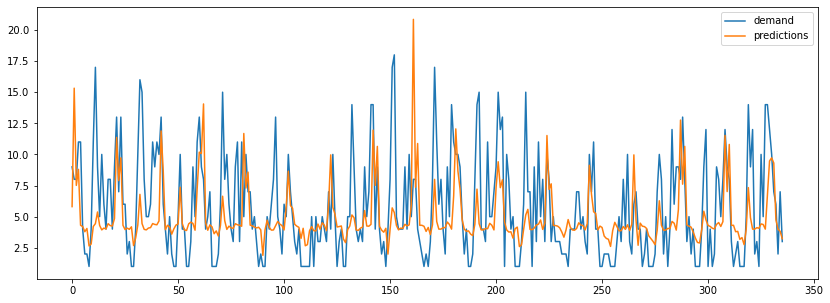

In [124]:
#Create and train forecaster
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123, max_depth = 10, n_estimators = 200),
                              lags = [168])
forecaster.fit(y=train['rides'], exog = train[columns_for_model])

#Predictions and demand
predictions = forecaster.predict(steps=steps, exog = test[columns_for_model])
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [125]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_5 = evaluation_model_5.append({'model':'ForecastAutoreg with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_5

,model,MSE,MAE,RMSE,R2
0,ForecastAutoreg with exog. variables,13.130712,2.6716,3.623632,-1.62391


##### Cat Boost

In [126]:
forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True),
                              lags = [24*7,24])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [01:03<00:00, 31.92s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 24 168] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 21.120869375267635



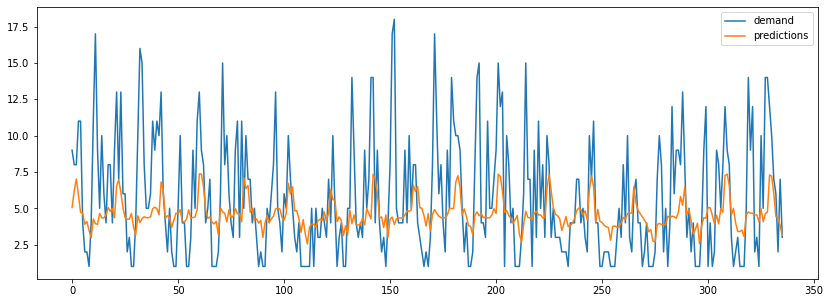

In [127]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_5['rides'],
    exog = rides_per_zone_5[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [128]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_5 = evaluation_model_5.append({'model':'ForecastAutoreg with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_5

,model,MSE,MAE,RMSE,R2
0,ForecastAutoreg with exog. variables,13.130712,2.671600,3.623632,-1.623910
1,ForecastAutoreg with exog. variables,14.394374,2.813119,3.793992,-14.410753


##### XGBoost

In [129]:
forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123),
                lags = 24*7
             )
#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.5),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|██████████████████████████████████████| 2/2 [03:48<00:00, 114.27s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 24 168] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 14.843850566074899



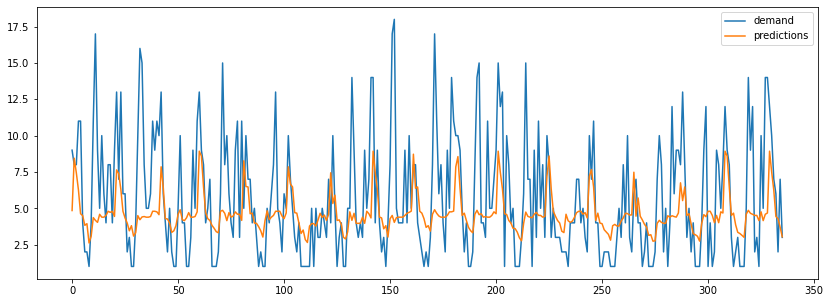

In [132]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y = rides_per_zone_5['rides'],
    exog = rides_per_zone_5[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [133]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_5 = evaluation_model_5.append({'model':'ForecastAutoreg with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_5

,model,MSE,MAE,RMSE,R2
0,ForecastAutoreg with exog. variables,13.130712,2.671600,3.623632,-1.623910
1,ForecastAutoreg with exog. variables,14.394374,2.813119,3.793992,-14.410753
2,ForecastAutoreg with exog. variables,13.640244,2.702876,3.693270,-7.758634


##### Light GBM

In [134]:
forecaster = ForecasterAutoreg(regressor = LGBMRegressor(random_state=123),
                              lags=[24,24*7])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:15<00:00,  7.70s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 24 168] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 10, 'n_estimators': 100}
  Backtesting metric: 20.58296434597855



In [135]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_5['rides'],
    exog = rides_per_zone_5[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)

predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_5 = evaluation_model_5.append({'model':'LightGBM', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_5

,model,MSE,MAE,RMSE,R2
0,ForecastAutoreg with exog. variables,13.130712,2.671600,3.623632,-1.623910
1,ForecastAutoreg with exog. variables,14.394374,2.813119,3.793992,-14.410753
2,ForecastAutoreg with exog. variables,13.640244,2.702876,3.693270,-7.758634
3,LightGBM,15.126652,2.844207,3.889300,-13.841355


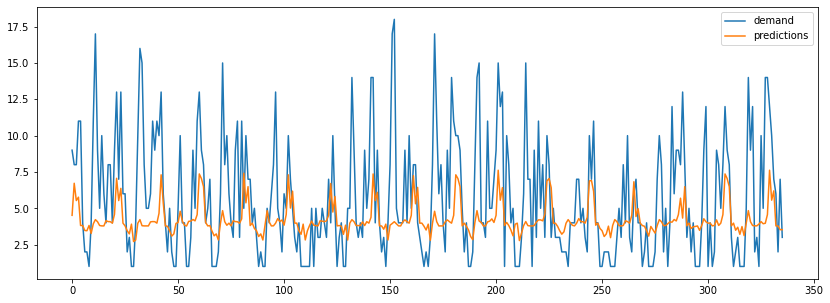

In [136]:
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

##### Choosing the best model

For this zone we don't have enough data, so the results of the predictions are worse than the other zones, as we can see in the plots that compare the predictions and the demand in all the models. The model that offers the best results is the Random Forest, so this is the model we are going to use.

In [144]:
#creating and training the forecaster

forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123, max_depth = 10, n_estimators = 200),
                                lags = [ 24,  48,  72,  96, 120, 144 ,168] )

forecaster.fit(y=rides_per_zone_5['rides'], exog = rides_per_zone_5[columns_for_model])

#Obtaining exogenous variables for the model
last_day_data = rides_per_zone_5[-1:]
last_day_data = last_day_data.index[0]

exogenous_variables = pd.date_range(last_day_data, periods = 365*24,freq='H')
exogenous_variables = pd.DataFrame(exogenous_variables, columns = ['datetime'])
exogenous_variables = exogenous_variables[1:]
exogenous_variables['hour'] = exogenous_variables['datetime'].dt.hour
exogenous_variables['month'] = exogenous_variables['datetime'].dt.month
exogenous_variables['weekday'] = exogenous_variables['datetime'].dt.day_name()
exogenous_variables.reset_index(inplace=True)
exogenous_variables = pd.get_dummies(exogenous_variables, columns = ['weekday', 'hour', 'month'])
exogenous_variables = exogenous_variables[:steps]

#Obtaining the predictions and save them in the csv
predictions = forecaster.predict(steps=steps,
                                exog = exogenous_variables[columns_for_model])
predictions = predictions.reset_index()

predictions_zone_5 = pd.concat([predictions, exogenous_variables], axis = 1)
predictions_zone_5 = predictions_zone_5[['pred', 'datetime']]
predictions_zone_5['hour'] = predictions_zone_5['datetime'].dt.hour
predictions_zone_5['day'] = predictions_zone_5['datetime'].dt.date
predictions_zone_5['model'] = 'Random Forest'
predictions_zone_5['postal_code'] = '28001_4'

predictions_per_zone = predictions_per_zone.append(predictions_zone_5)
predictions_per_zone.to_csv("predictions_per_zone.csv")

In [145]:
predictions_per_zone

,pred,datetime,hour,day,model,postal_code
0,2.898798,2021-07-01 00:00:00,0,2021-07-01,RandomForest,28001_0
1,2.942485,2021-07-01 01:00:00,1,2021-07-01,RandomForest,28001_0
2,3.313029,2021-07-01 02:00:00,2,2021-07-01,RandomForest,28001_0
3,2.216916,2021-07-01 03:00:00,3,2021-07-01,RandomForest,28001_0
4,1.924609,2021-07-01 04:00:00,4,2021-07-01,RandomForest,28001_0
...,...,...,...,...,...,...
331,2.175333,2021-07-14 19:00:00,19,2021-07-14,Random Forest,28001_4
332,2.237524,2021-07-14 20:00:00,20,2021-07-14,Random Forest,28001_4
333,2.167963,2021-07-14 21:00:00,21,2021-07-14,Random Forest,28001_4
334,2.167963,2021-07-14 22:00:00,22,2021-07-14,Random Forest,28001_4


### 4.2.6. Demand prediction for zone: 28001_5


In [146]:
#Creating the dataframe
rides_per_zone_6 = rides_per_station[rides_per_station['postal_code']=="28001_5"]
rides_per_zone_6 = rides_per_zone_6.groupby(['date', 'weekday', 'hour', 'month',
                                             'year', 'time','datetime']).rides.sum().reset_index()
#Converting the column datetime to a datetime format
rides_per_zone_6['datetime'] = pd.to_datetime(rides_per_zone_6['datetime'])
#Resample to fill all values of the time series
rides_per_zone_6.set_index('datetime',inplace=True)
rides_per_zone_6.sort_index(inplace=True)
rides_per_zone_6.resample('1H').sum()

#Adding lag values
rides_per_zone_6['rides_lag_7'] = rides_per_zone_6['rides'].shift(7*24)
rides_per_zone_6['rides_lag_1'] = rides_per_zone_6['rides'].shift(1*24)
rides_per_zone_6['rides_lag_2'] = rides_per_zone_6['rides'].shift(2*24)
rides_per_zone_6['rides_lag_1_month'] = rides_per_zone_6['rides'].shift(30*24)
rides_per_zone_6['rides_lag_12_hours'] = rides_per_zone_6['rides'].shift(12)

#One hot encoding
rides_per_zone_6 = pd.get_dummies(rides_per_zone_6, columns = ['weekday', 'hour', 'month'])
#We save the columns we are using as predictors in columns for model and the target we want to predict in target
columns_for_model = [column for column in rides_per_zone_6.columns
                      if column.startswith(('weekday', 'hour', 'month'))]

target = 'rides'
#Division in train and test
steps = 24*14 # 14 days
train = rides_per_zone_6[:-steps]
test = rides_per_zone_6[-steps:]

#Dataframe to evaluate models
evaluation_model_6 = pd.DataFrame(columns=["model", "MSE", "MAE", "RMSE", "R2"])

##### Random Forest

In [147]:
#Looking for the best hyperparameters: grid search

steps = 14*24
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123),
                              lags = [24*7])
#Number of lags used as predictors
lags_grid = [[24,24*2,24*3,24*4,24*5,24*6,24*7], [24*7]]

#Regressor hyperparameters
param_grid = {'n_estimators':[100,200,500],
             'max_depth': [3,5,10]}

#Grid search
grid_seach = grid_search_forecaster(forecaster = forecaster,
                                   y = train['rides'],
                                   exog = train[columns_for_model],
                                   param_grid = param_grid,
                                   lags_grid = lags_grid,
                                   steps = steps,
                                   refit = True,
                                   metric = 'mean_squared_error',
                                   initial_train_size = int(len(train)*0.25),
                                   fixed_train_size=False,
                                   return_best=True,
                                   verbose=False)

loop param_grid:   0%|                                              | 0/9 [00:00<?, ?it/s]

Number of models compared: 18



loop lags_grid: 100%|███████████████████████████████████| 2/2 [1:38:40<00:00, 2960.21s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'max_depth': 10, 'n_estimators': 200}
  Backtesting metric: 425.75498556661853



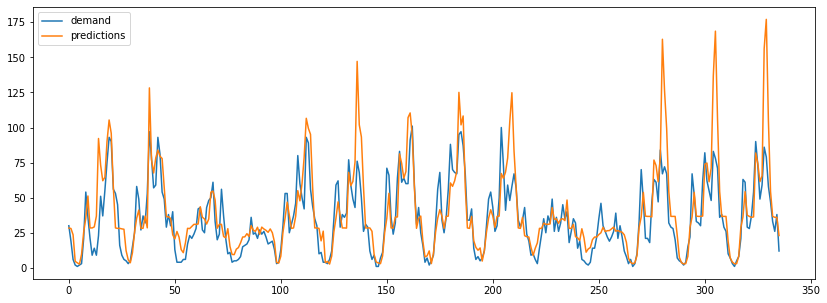

In [148]:
#Create and train forecaster
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123, max_depth = 10, n_estimators = 200),
                              lags = [168])
forecaster.fit(y=train['rides'], exog = train[columns_for_model])

#Predictions and demand
predictions = forecaster.predict(steps=steps, exog = test[columns_for_model])
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [149]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_6 = evaluation_model_6.append({'model':'Random Forest with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_6

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,335.886803,11.723205,18.327215,0.638735


##### Cat Boost

In [150]:
forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True),
                              lags = [24*7,24])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [02:03<00:00, 61.99s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 315.4520540661189



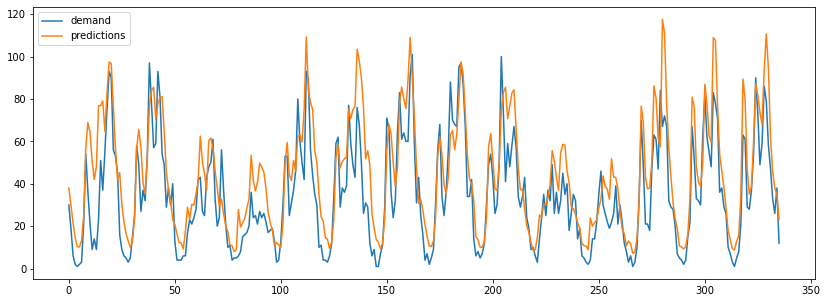

In [151]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_6['rides'],
    exog = rides_per_zone_6[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [152]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_6 = evaluation_model_6.append({'model':'CatBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_6

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,335.886803,11.723205,18.327215,0.638735
1,CatBoost,254.856847,12.545545,15.964237,0.624704


##### XGBoost

In [153]:
forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123),
                lags = 24*7
             )
#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.5),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|██████████████████████████████████████| 2/2 [06:34<00:00, 197.27s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 410.8396067252729



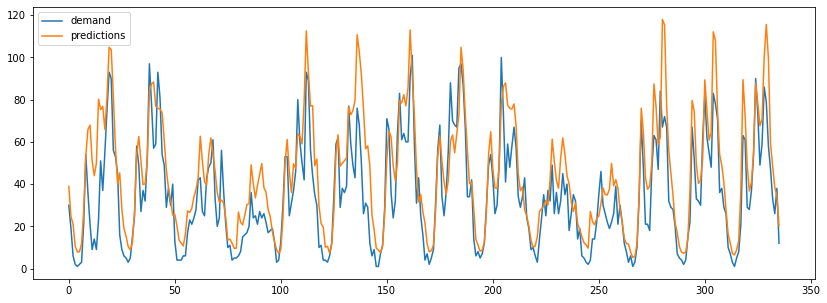

In [155]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y = rides_per_zone_6['rides'],
    exog = rides_per_zone_6[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [156]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_6 = evaluation_model_6.append({'model':'XGBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_6

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,335.886803,11.723205,18.327215,0.638735
1,CatBoost,254.856847,12.545545,15.964237,0.624704
2,XGBoost,255.804992,12.323102,15.993905,0.640746


##### Light GBM

In [157]:
forecaster = ForecasterAutoreg(regressor = LGBMRegressor(random_state=123),
                              lags=[24,24*7])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:28<00:00, 14.20s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 313.9294951689963



In [158]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_6['rides'],
    exog = rides_per_zone_6[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)

predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_6 = evaluation_model_6.append({'model':'LightGBM', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_6

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,335.886803,11.723205,18.327215,0.638735
1,CatBoost,254.856847,12.545545,15.964237,0.624704
2,XGBoost,255.804992,12.323102,15.993905,0.640746
3,LightGBM,258.414785,12.357424,16.075285,0.648660


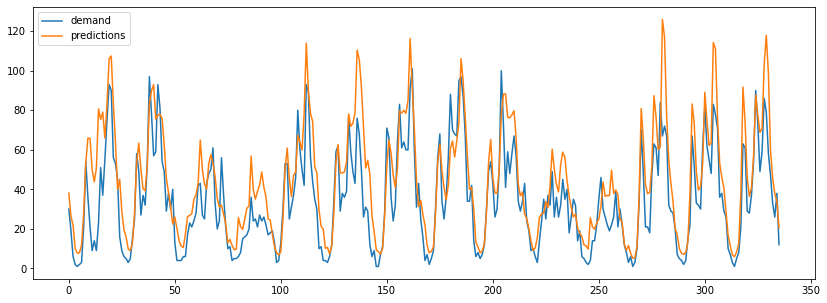

In [159]:
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

##### Choosing the best model

The model with the best results is the XGBoost model

In [162]:
#creating and training the forecaster

forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123, learning_rate = 0.1, max_depth = 3, n_estimators= 500),
                lags = 24*7
             )

forecaster.fit(y=rides_per_zone_6['rides'], exog = rides_per_zone_6[columns_for_model])

#Obtaining exogenous variables for the model
last_day_data = rides_per_zone_6[-1:]
last_day_data = last_day_data.index[0]

exogenous_variables = pd.date_range(last_day_data, periods = 365*24,freq='H')
exogenous_variables = pd.DataFrame(exogenous_variables, columns = ['datetime'])
exogenous_variables = exogenous_variables[1:]
exogenous_variables['hour'] = exogenous_variables['datetime'].dt.hour
exogenous_variables['month'] = exogenous_variables['datetime'].dt.month
exogenous_variables['weekday'] = exogenous_variables['datetime'].dt.day_name()
exogenous_variables.reset_index(inplace=True)
exogenous_variables = pd.get_dummies(exogenous_variables, columns = ['weekday', 'hour', 'month'])
exogenous_variables = exogenous_variables[:steps]

#Obtaining the predictions and save them in the csv
predictions = forecaster.predict(steps=steps,
                                exog = exogenous_variables[columns_for_model])
predictions = predictions.reset_index()

predictions_zone_6 = pd.concat([predictions, exogenous_variables], axis = 1)
predictions_zone_6 = predictions_zone_6[['pred', 'datetime']]
predictions_zone_6['hour'] = predictions_zone_6['datetime'].dt.hour
predictions_zone_6['day'] = predictions_zone_6['datetime'].dt.date
predictions_zone_6['model'] = 'XGBoost'
predictions_zone_6['postal_code'] = '28001_5'

predictions_per_zone = predictions_per_zone.append(predictions_zone_6)
predictions_per_zone.to_csv("predictions_per_zone.csv")

In [163]:
predictions_per_zone

,pred,datetime,hour,day,model,postal_code
0,2.898798,2021-07-01 00:00:00,0,2021-07-01,RandomForest,28001_0
1,2.942485,2021-07-01 01:00:00,1,2021-07-01,RandomForest,28001_0
2,3.313029,2021-07-01 02:00:00,2,2021-07-01,RandomForest,28001_0
3,2.216916,2021-07-01 03:00:00,3,2021-07-01,RandomForest,28001_0
4,1.924609,2021-07-01 04:00:00,4,2021-07-01,RandomForest,28001_0
...,...,...,...,...,...,...
331,45.990818,2021-07-14 19:00:00,19,2021-07-14,XGboost,28001_5
332,40.182907,2021-07-14 20:00:00,20,2021-07-14,XGboost,28001_5
333,35.226337,2021-07-14 21:00:00,21,2021-07-14,XGboost,28001_5
334,33.963314,2021-07-14 22:00:00,22,2021-07-14,XGboost,28001_5


### 4.2.7. Demand prediction for zone: 28001_6


In [165]:
#Creating the dataframe
rides_per_zone_7 = rides_per_station[rides_per_station['postal_code']=="28001_6"]
rides_per_zone_7 = rides_per_zone_7.groupby(['date', 'weekday', 'hour', 'month',
                                             'year', 'time','datetime']).rides.sum().reset_index()
#Converting the column datetime to a datetime format
rides_per_zone_7['datetime'] = pd.to_datetime(rides_per_zone_7['datetime'])
#Resample to fill all values of the time series
rides_per_zone_7.set_index('datetime',inplace=True)
rides_per_zone_7.sort_index(inplace=True)
rides_per_zone_7.resample('1H').sum()

#Adding lag values
rides_per_zone_7['rides_lag_7'] = rides_per_zone_7['rides'].shift(7*24)
rides_per_zone_7['rides_lag_1'] = rides_per_zone_7['rides'].shift(1*24)
rides_per_zone_7['rides_lag_2'] = rides_per_zone_7['rides'].shift(2*24)
rides_per_zone_7['rides_lag_1_month'] = rides_per_zone_7['rides'].shift(30*24)
rides_per_zone_7['rides_lag_12_hours'] = rides_per_zone_7['rides'].shift(12)

#One hot encoding
rides_per_zone_7 = pd.get_dummies(rides_per_zone_7, columns = ['weekday', 'hour', 'month'])
#We save the columns we are using as predictors in columns for model and the target we want to predict in target
columns_for_model = [column for column in rides_per_zone_7.columns
                      if column.startswith(('weekday', 'hour', 'month'))]

target = 'rides'
#Division in train and test
steps = 24*14 # 14 days
train = rides_per_zone_7[:-steps]
test = rides_per_zone_7[-steps:]

#Dataframe to evaluate models
evaluation_model_7 = pd.DataFrame(columns=["model", "MSE", "MAE", "RMSE", "R2"])

##### Random Forest

In [166]:
#Looking for the best hyperparameters: grid search

steps = 14*24
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123),
                              lags = [24*7])
#Number of lags used as predictors
lags_grid = [[24,24*2,24*3,24*4,24*5,24*6,24*7], [24*7]]

#Regressor hyperparameters
param_grid = {'n_estimators':[100,200,500],
             'max_depth': [3,5,10]}

#Grid search
grid_seach = grid_search_forecaster(forecaster = forecaster,
                                   y = train['rides'],
                                   exog = train[columns_for_model],
                                   param_grid = param_grid,
                                   lags_grid = lags_grid,
                                   steps = steps,
                                   refit = True,
                                   metric = 'mean_squared_error',
                                   initial_train_size = int(len(train)*0.25),
                                   fixed_train_size=False,
                                   return_best=True,
                                   verbose=False)

loop param_grid:   0%|                                              | 0/9 [00:00<?, ?it/s]

Number of models compared: 18



loop lags_grid: 100%|██████████████████████████████████████| 2/2 [09:05<00:00, 272.57s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'max_depth': 10, 'n_estimators': 100}
  Backtesting metric: 17.53352066742378



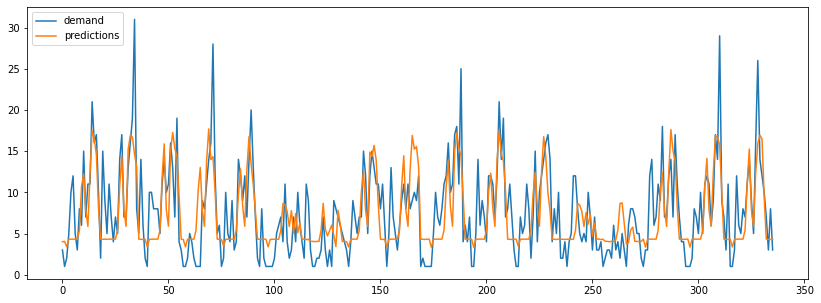

In [168]:
#Create and train forecaster
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123, max_depth = 10, n_estimators = 200),
                              lags = [168])
forecaster.fit(y=train['rides'], exog = train[columns_for_model])

#Predictions and demand
predictions = forecaster.predict(steps=steps, exog = test[columns_for_model])
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [169]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_7 = evaluation_model_7.append({'model':'Random Forest with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_7

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,14.577811,2.951565,3.81809,0.154981


##### Cat Boost

In [170]:
forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True),
                              lags = [24*7,24])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:24<00:00, 12.47s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 24 168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 500}
  Backtesting metric: 14.668161380053347



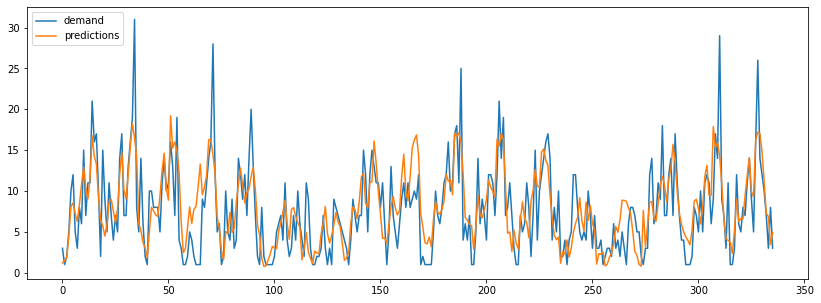

In [171]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_7['rides'],
    exog = rides_per_zone_7[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [172]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_7 = evaluation_model_7.append({'model':'CatBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_7

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,14.577811,2.951565,3.818090,0.154981
1,CatBoost,13.315880,2.785711,3.649093,0.262464


##### XGBoost

In [173]:
forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123),
                lags = 24*7
             )
#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.5),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [01:10<00:00, 35.03s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 10, 'n_estimators': 500}
  Backtesting metric: 29.30782708168065



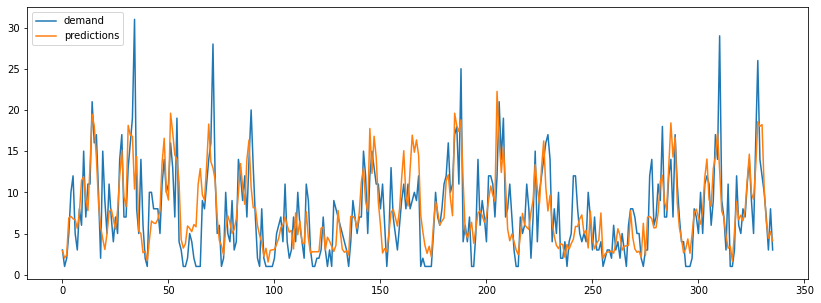

In [174]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y = rides_per_zone_7['rides'],
    exog = rides_per_zone_7[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [175]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_7 = evaluation_model_7.append({'model':'XGBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_7

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,14.577811,2.951565,3.818090,0.154981
1,CatBoost,13.315880,2.785711,3.649093,0.262464
2,XGBoost,14.448725,2.828091,3.801148,0.272418


##### Light GBM

In [176]:
forecaster = ForecasterAutoreg(regressor = LGBMRegressor(random_state=123),
                              lags=[24,24*7])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   8%|███                                  | 1/12 [00:00<00:01,  7.63it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:05<00:00,  2.55s/it]

`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 24 168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 16.649779108107307



In [177]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_7['rides'],
    exog = rides_per_zone_7[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)

predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_7 = evaluation_model_7.append({'model':'LightGBM', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_7

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,14.577811,2.951565,3.818090,0.154981
1,CatBoost,13.315880,2.785711,3.649093,0.262464
2,XGBoost,14.448725,2.828091,3.801148,0.272418
3,LightGBM,14.097996,2.898997,3.754730,0.127810


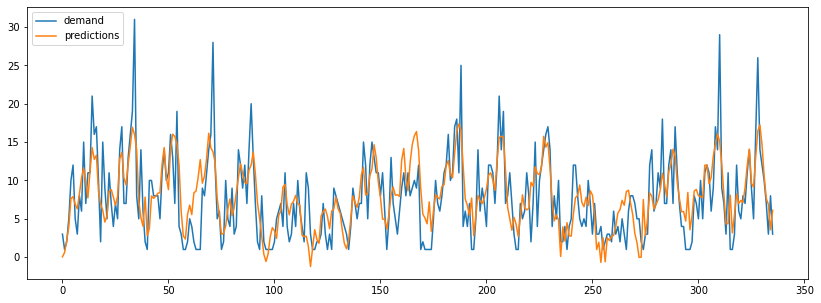

In [178]:
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

##### Choosing the best model

The best results are obtained with the CatBoost model

In [179]:
#creating and training the forecaster

forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True,learning_rate = 0.1, 
                                                             max_depth = 5, n_estimators = 500),
                              lags = [24*7,24])

forecaster.fit(y=rides_per_zone_7['rides'], exog = rides_per_zone_7[columns_for_model])

#Obtaining exogenous variables for the model
last_day_data = rides_per_zone_7[-1:]
last_day_data = last_day_data.index[0]

exogenous_variables = pd.date_range(last_day_data, periods = 365*24,freq='H')
exogenous_variables = pd.DataFrame(exogenous_variables, columns = ['datetime'])
exogenous_variables = exogenous_variables[1:]
exogenous_variables['hour'] = exogenous_variables['datetime'].dt.hour
exogenous_variables['month'] = exogenous_variables['datetime'].dt.month
exogenous_variables['weekday'] = exogenous_variables['datetime'].dt.day_name()
exogenous_variables.reset_index(inplace=True)
exogenous_variables = pd.get_dummies(exogenous_variables, columns = ['weekday', 'hour', 'month'])
exogenous_variables = exogenous_variables[:steps]

#Obtaining the predictions and save them in the csv
predictions = forecaster.predict(steps=steps,
                                exog = exogenous_variables[columns_for_model])
predictions = predictions.reset_index()

predictions_zone_7 = pd.concat([predictions, exogenous_variables], axis = 1)
predictions_zone_7 = predictions_zone_7[['pred', 'datetime']]
predictions_zone_7['hour'] = predictions_zone_7['datetime'].dt.hour
predictions_zone_7['day'] = predictions_zone_7['datetime'].dt.date
predictions_zone_7['model'] = 'Catboost'
predictions_zone_7['postal_code'] = '28001_6'

predictions_per_zone = predictions_per_zone.append(predictions_zone_7)
predictions_per_zone.to_csv("predictions_per_zone.csv")

### 4.2.8. Demand prediction for zone: 28001_7


In [181]:
#Creating the dataframe
rides_per_zone_8 = rides_per_station[rides_per_station['postal_code']=="28001_7"]
rides_per_zone_8 = rides_per_zone_8.groupby(['date', 'weekday', 'hour', 'month',
                                             'year', 'time','datetime']).rides.sum().reset_index()
#Converting the column datetime to a datetime format
rides_per_zone_8['datetime'] = pd.to_datetime(rides_per_zone_8['datetime'])
#Resample to fill all values of the time series
rides_per_zone_8.set_index('datetime',inplace=True)
rides_per_zone_8.sort_index(inplace=True)
rides_per_zone_8.resample('1H').sum()

#Adding lag values
rides_per_zone_8['rides_lag_7'] = rides_per_zone_8['rides'].shift(7*24)
rides_per_zone_8['rides_lag_1'] = rides_per_zone_8['rides'].shift(1*24)
rides_per_zone_8['rides_lag_2'] = rides_per_zone_8['rides'].shift(2*24)
rides_per_zone_8['rides_lag_1_month'] = rides_per_zone_8['rides'].shift(30*24)
rides_per_zone_8['rides_lag_12_hours'] = rides_per_zone_8['rides'].shift(12)

#One hot encoding
rides_per_zone_8 = pd.get_dummies(rides_per_zone_8, columns = ['weekday', 'hour', 'month'])
#We save the columns we are using as predictors in columns for model and the target we want to predict in target
columns_for_model = [column for column in rides_per_zone_8.columns
                      if column.startswith(('weekday', 'hour', 'month'))]

target = 'rides'
#Division in train and test
steps = 24*14 # 14 days
train = rides_per_zone_8[:-steps]
test = rides_per_zone_8[-steps:]

#Dataframe to evaluate models
evaluation_model_8 = pd.DataFrame(columns=["model", "MSE", "MAE", "RMSE", "R2"])

##### Random Forest

In [182]:
#Looking for the best hyperparameters: grid search

steps = 14*24
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123),
                              lags = [24*7])
#Number of lags used as predictors
lags_grid = [[24,24*2,24*3,24*4,24*5,24*6,24*7], [24*7]]

#Regressor hyperparameters
param_grid = {'n_estimators':[100,200,500],
             'max_depth': [3,5,10]}

#Grid search
grid_seach = grid_search_forecaster(forecaster = forecaster,
                                   y = train['rides'],
                                   exog = train[columns_for_model],
                                   param_grid = param_grid,
                                   lags_grid = lags_grid,
                                   steps = steps,
                                   refit = True,
                                   metric = 'mean_squared_error',
                                   initial_train_size = int(len(train)*0.25),
                                   fixed_train_size=False,
                                   return_best=True,
                                   verbose=False)

loop param_grid:   0%|                                              | 0/9 [00:00<?, ?it/s]

Number of models compared: 18



loop lags_grid: 100%|███████████████████████████████████| 2/2 [2:29:40<00:00, 4490.05s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'max_depth': 10, 'n_estimators': 100}
  Backtesting metric: 127.40525019844212



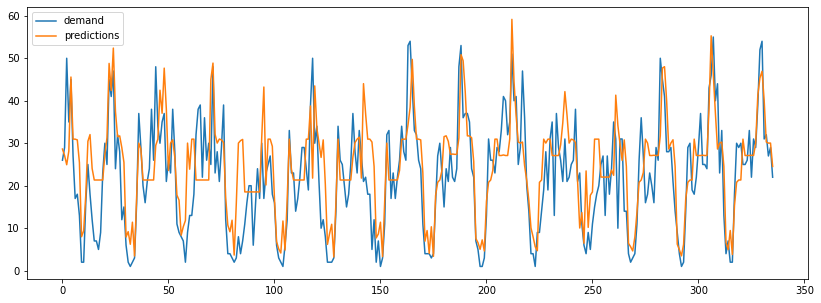

In [185]:
#Create and train forecaster
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123, max_depth = 10, n_estimators = 100),
                              lags = [168])
forecaster.fit(y=train['rides'], exog = train[columns_for_model])

#Predictions and demand
predictions = forecaster.predict(steps=steps, exog = test[columns_for_model])
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [186]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_8 = evaluation_model_8.append({'model':'Random Forest with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_8

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,79.360928,6.863895,8.908475,0.321212
1,Random Forest with exog. variables,81.387028,6.958476,9.021476,0.298346


##### Cat Boost

In [187]:
forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True),
                              lags = [24*7,24])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [01:48<00:00, 54.14s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 95.56067809284161



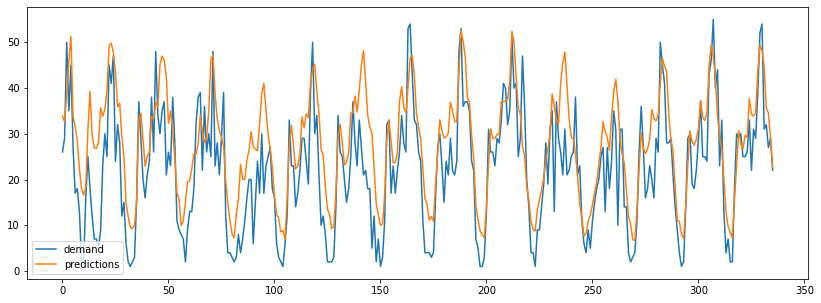

In [188]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_8['rides'],
    exog = rides_per_zone_8[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [189]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_8 = evaluation_model_8.append({'model':'CatBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_8

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,79.360928,6.863895,8.908475,0.321212
1,Random Forest with exog. variables,81.387028,6.958476,9.021476,0.298346
2,CatBoost,87.249683,7.601278,9.340754,0.310355


##### XGBoost

In [190]:
forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123),
                lags = 24*7
             )
#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.5),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|██████████████████████████████████████| 2/2 [07:19<00:00, 219.74s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 126.9420145660672



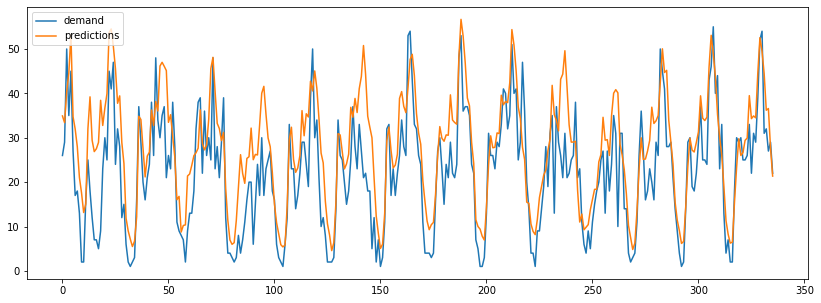

In [191]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y = rides_per_zone_8['rides'],
    exog = rides_per_zone_8[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [192]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_8 = evaluation_model_8.append({'model':'XGBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_8

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,79.360928,6.863895,8.908475,0.321212
1,Random Forest with exog. variables,81.387028,6.958476,9.021476,0.298346
2,CatBoost,87.249683,7.601278,9.340754,0.310355
3,XGBoost,88.903748,7.535516,9.428878,0.414647


##### Light GBM

In [193]:
forecaster = ForecasterAutoreg(regressor = LGBMRegressor(random_state=123),
                              lags=[24,24*7])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:30<00:00, 15.37s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}
  Backtesting metric: 96.93158792726851



In [194]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_8['rides'],
    exog = rides_per_zone_8[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)

predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_8 = evaluation_model_8.append({'model':'LightGBM', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_8

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,79.360928,6.863895,8.908475,0.321212
1,Random Forest with exog. variables,81.387028,6.958476,9.021476,0.298346
2,CatBoost,87.249683,7.601278,9.340754,0.310355
3,XGBoost,88.903748,7.535516,9.428878,0.414647
4,LightGBM,80.887116,7.110010,8.993726,0.408665


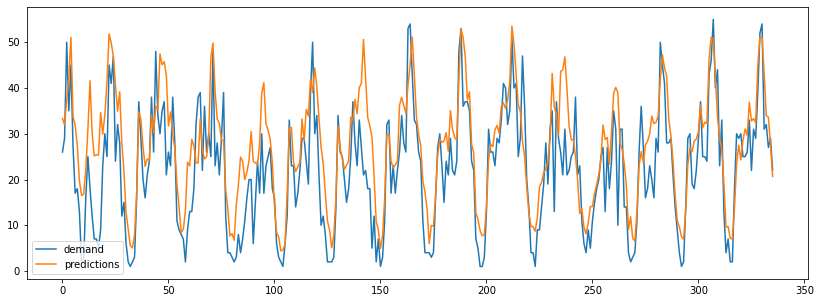

In [195]:
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

##### Choosing the best model

The best model is the Random Forest

In [196]:
#creating and training the forecaster

forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123, max_depth = 10, n_estimators = 100),
                              lags = [168])
                              

forecaster.fit(y=rides_per_zone_8['rides'], exog = rides_per_zone_8[columns_for_model])

#Obtaining exogenous variables for the model
last_day_data = rides_per_zone_8[-1:]
last_day_data = last_day_data.index[0]

exogenous_variables = pd.date_range(last_day_data, periods = 365*24,freq='H')
exogenous_variables = pd.DataFrame(exogenous_variables, columns = ['datetime'])
exogenous_variables = exogenous_variables[1:]
exogenous_variables['hour'] = exogenous_variables['datetime'].dt.hour
exogenous_variables['month'] = exogenous_variables['datetime'].dt.month
exogenous_variables['weekday'] = exogenous_variables['datetime'].dt.day_name()
exogenous_variables.reset_index(inplace=True)
exogenous_variables = pd.get_dummies(exogenous_variables, columns = ['weekday', 'hour', 'month'])
exogenous_variables = exogenous_variables[:steps]

#Obtaining the predictions and save them in the csv
predictions = forecaster.predict(steps=steps,
                                exog = exogenous_variables[columns_for_model])
predictions = predictions.reset_index()

predictions_zone_8 = pd.concat([predictions, exogenous_variables], axis = 1)
predictions_zone_8 = predictions_zone_8[['pred', 'datetime']]
predictions_zone_8['hour'] = predictions_zone_8['datetime'].dt.hour
predictions_zone_8['day'] = predictions_zone_8['datetime'].dt.date
predictions_zone_8['model'] = 'Random Forest'
predictions_zone_8['postal_code'] = '28001_7'

predictions_per_zone = predictions_per_zone.append(predictions_zone_8)
predictions_per_zone.to_csv("predictions_per_zone.csv")

In [197]:
predictions_per_zone

,pred,datetime,hour,day,model,postal_code
0,2.898798,2021-07-01 00:00:00,0,2021-07-01,RandomForest,28001_0
1,2.942485,2021-07-01 01:00:00,1,2021-07-01,RandomForest,28001_0
2,3.313029,2021-07-01 02:00:00,2,2021-07-01,RandomForest,28001_0
3,2.216916,2021-07-01 03:00:00,3,2021-07-01,RandomForest,28001_0
4,1.924609,2021-07-01 04:00:00,4,2021-07-01,RandomForest,28001_0
...,...,...,...,...,...,...
331,32.756903,2021-07-14 19:00:00,19,2021-07-14,Random Forest,28001_7
332,24.416479,2021-07-14 20:00:00,20,2021-07-14,Random Forest,28001_7
333,24.416479,2021-07-14 21:00:00,21,2021-07-14,Random Forest,28001_7
334,24.416479,2021-07-14 22:00:00,22,2021-07-14,Random Forest,28001_7


### 4.2.9. Demand prediction for zone: 28001_8


In [198]:
#Creating the dataframe
rides_per_zone_9 = rides_per_station[rides_per_station['postal_code']=="28001_8"]
rides_per_zone_9 = rides_per_zone_9.groupby(['date', 'weekday', 'hour', 'month',
                                             'year', 'time','datetime']).rides.sum().reset_index()
#Converting the column datetime to a datetime format
rides_per_zone_9['datetime'] = pd.to_datetime(rides_per_zone_9['datetime'])
#Resample to fill all values of the time series
rides_per_zone_9.set_index('datetime',inplace=True)
rides_per_zone_9.sort_index(inplace=True)
rides_per_zone_9.resample('1H').sum()

#Adding lag values
rides_per_zone_9['rides_lag_7'] = rides_per_zone_9['rides'].shift(7*24)
rides_per_zone_9['rides_lag_1'] = rides_per_zone_9['rides'].shift(1*24)
rides_per_zone_9['rides_lag_2'] = rides_per_zone_9['rides'].shift(2*24)
rides_per_zone_9['rides_lag_1_month'] = rides_per_zone_9['rides'].shift(30*24)
rides_per_zone_9['rides_lag_12_hours'] = rides_per_zone_9['rides'].shift(12)

#One hot encoding
rides_per_zone_9 = pd.get_dummies(rides_per_zone_9, columns = ['weekday', 'hour', 'month'])
#We save the columns we are using as predictors in columns for model and the target we want to predict in target
columns_for_model = [column for column in rides_per_zone_9.columns
                      if column.startswith(('weekday', 'hour', 'month'))]

target = 'rides'
#Division in train and test
steps = 24*14 # 14 days
train = rides_per_zone_9[:-steps]
test = rides_per_zone_9[-steps:]

#Dataframe to evaluate models
evaluation_model_9 = pd.DataFrame(columns=["model", "MSE", "MAE", "RMSE", "R2"])

##### Random Forest

In [199]:
#Looking for the best hyperparameters: grid search

steps = 14*24
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123),
                              lags = [24*7])
#Number of lags used as predictors
lags_grid = [[24,24*2,24*3,24*4,24*5,24*6,24*7], [24*7]]

#Regressor hyperparameters
param_grid = {'n_estimators':[100,200,500],
             'max_depth': [3,5,10]}

#Grid search
grid_seach = grid_search_forecaster(forecaster = forecaster,
                                   y = train['rides'],
                                   exog = train[columns_for_model],
                                   param_grid = param_grid,
                                   lags_grid = lags_grid,
                                   steps = steps,
                                   refit = True,
                                   metric = 'mean_squared_error',
                                   initial_train_size = int(len(train)*0.25),
                                   fixed_train_size=False,
                                   return_best=True,
                                   verbose=False)

loop param_grid:   0%|                                              | 0/9 [00:00<?, ?it/s]

Number of models compared: 18



loop lags_grid: 100%|███████████████████████████████████| 2/2 [1:47:22<00:00, 3221.20s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'max_depth': 10, 'n_estimators': 200}
  Backtesting metric: 595.5951922738142



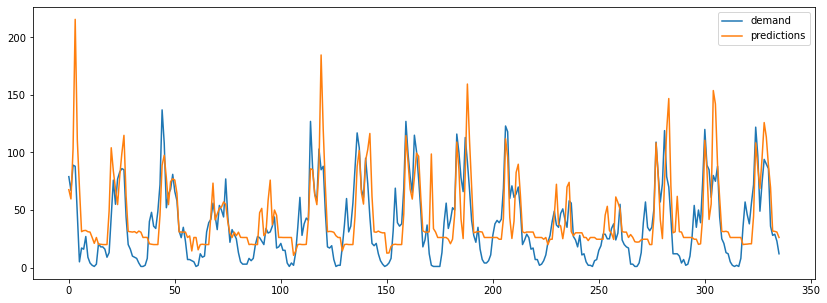

In [200]:
#Create and train forecaster
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123, max_depth = 10, n_estimators = 200),
                              lags = [168])
forecaster.fit(y=train['rides'], exog = train[columns_for_model])

#Predictions and demand
predictions = forecaster.predict(steps=steps, exog = test[columns_for_model])
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [201]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_9 = evaluation_model_9.append({'model':'Random Forest with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_9

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,611.450268,19.002868,24.72752,0.372837


##### Cat Boost

In [202]:
forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True),
                              lags = [24*7,24])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [02:53<00:00, 86.77s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 419.7129226731858



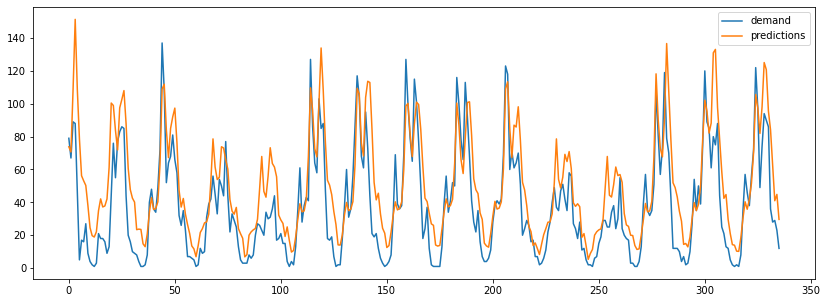

In [203]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_9['rides'],
    exog = rides_per_zone_9[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [204]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_9 = evaluation_model_9.append({'model':'CatBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_9

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,611.450268,19.002868,24.727520,0.372837
1,CatBoost,463.512778,16.872581,21.529347,0.514826


##### XGBoost

In [205]:
forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123),
                lags = 24*7
             )
#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.5),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|██████████████████████████████████████| 2/2 [08:25<00:00, 252.98s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 582.5754753357431



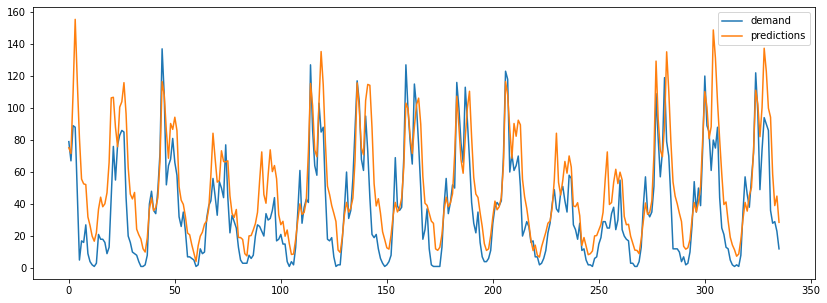

In [206]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y = rides_per_zone_9['rides'],
    exog = rides_per_zone_9[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [207]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_9 = evaluation_model_9.append({'model':'XGBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_9

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,611.450268,19.002868,24.727520,0.372837
1,CatBoost,463.512778,16.872581,21.529347,0.514826
2,XGBoost,499.047862,17.028963,22.339379,0.529290


##### Light GBM

In [208]:
forecaster = ForecasterAutoreg(regressor = LGBMRegressor(random_state=123),
                              lags=[24,24*7])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:31<00:00, 15.94s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 417.97773736431753



In [209]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_9['rides'],
    exog = rides_per_zone_9[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)

predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_9 = evaluation_model_9.append({'model':'LightGBM', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_9

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,611.450268,19.002868,24.727520,0.372837
1,CatBoost,463.512778,16.872581,21.529347,0.514826
2,XGBoost,499.047862,17.028963,22.339379,0.529290
3,LightGBM,509.968909,17.104040,22.582491,0.531791


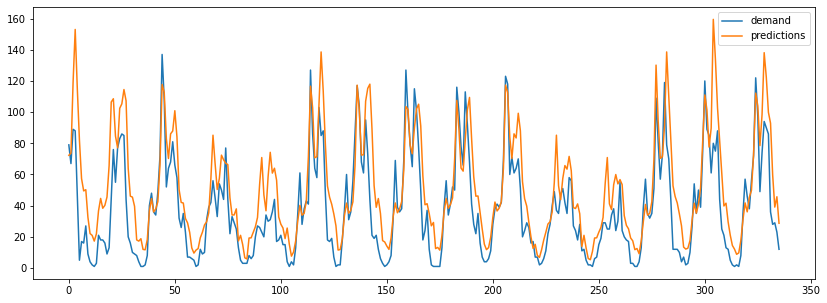

In [210]:
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

##### Choosing the best model

The best model is the CatBoost


In [211]:
#creating and training the forecaster

forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True,learning_rate = 0.1, 
                                                             max_depth = 3, n_estimators = 500),
                              lags = [24*7])

forecaster.fit(y=rides_per_zone_9['rides'], exog = rides_per_zone_9[columns_for_model])

#Obtaining exogenous variables for the model
last_day_data = rides_per_zone_9[-1:]
last_day_data = last_day_data.index[0]

exogenous_variables = pd.date_range(last_day_data, periods = 365*24,freq='H')
exogenous_variables = pd.DataFrame(exogenous_variables, columns = ['datetime'])
exogenous_variables = exogenous_variables[1:]
exogenous_variables['hour'] = exogenous_variables['datetime'].dt.hour
exogenous_variables['month'] = exogenous_variables['datetime'].dt.month
exogenous_variables['weekday'] = exogenous_variables['datetime'].dt.day_name()
exogenous_variables.reset_index(inplace=True)
exogenous_variables = pd.get_dummies(exogenous_variables, columns = ['weekday', 'hour', 'month'])
exogenous_variables = exogenous_variables[:steps]

#Obtaining the predictions and save them in the csv
predictions = forecaster.predict(steps=steps,
                                exog = exogenous_variables[columns_for_model])
predictions = predictions.reset_index()

predictions_zone_9 = pd.concat([predictions, exogenous_variables], axis = 1)
predictions_zone_9 = predictions_zone_9[['pred', 'datetime']]
predictions_zone_9['hour'] = predictions_zone_9['datetime'].dt.hour
predictions_zone_9['day'] = predictions_zone_9['datetime'].dt.date
predictions_zone_9['model'] = 'Catboost'
predictions_zone_9['postal_code'] = '28001_8'

predictions_per_zone = predictions_per_zone.append(predictions_zone_9)
predictions_per_zone.to_csv("predictions_per_zone.csv")

In [212]:
predictions_per_zone

,pred,datetime,hour,day,model,postal_code
0,2.898798,2021-07-01 00:00:00,0,2021-07-01,RandomForest,28001_0
1,2.942485,2021-07-01 01:00:00,1,2021-07-01,RandomForest,28001_0
2,3.313029,2021-07-01 02:00:00,2,2021-07-01,RandomForest,28001_0
3,2.216916,2021-07-01 03:00:00,3,2021-07-01,RandomForest,28001_0
4,1.924609,2021-07-01 04:00:00,4,2021-07-01,RandomForest,28001_0
...,...,...,...,...,...,...
331,62.436923,2021-07-14 19:00:00,19,2021-07-14,Catboost,28001_8
332,40.951265,2021-07-14 20:00:00,20,2021-07-14,Catboost,28001_8
333,30.794401,2021-07-14 21:00:00,21,2021-07-14,Catboost,28001_8
334,33.096237,2021-07-14 22:00:00,22,2021-07-14,Catboost,28001_8


### 4.2.10. Demand prediction for zone: 28001_9


In [213]:
#Creating the dataframe
rides_per_zone_10 = rides_per_station[rides_per_station['postal_code']=="28001_9"]
rides_per_zone_10 = rides_per_zone_10.groupby(['date', 'weekday', 'hour', 'month',
                                             'year', 'time','datetime']).rides.sum().reset_index()
#Converting the column datetime to a datetime format
rides_per_zone_10['datetime'] = pd.to_datetime(rides_per_zone_10['datetime'])
#Resample to fill all values of the time series
rides_per_zone_10.set_index('datetime',inplace=True)
rides_per_zone_10.sort_index(inplace=True)
rides_per_zone_10.resample('1H').sum()

#Adding lag values
rides_per_zone_10['rides_lag_7'] = rides_per_zone_10['rides'].shift(7*24)
rides_per_zone_10['rides_lag_1'] = rides_per_zone_10['rides'].shift(1*24)
rides_per_zone_10['rides_lag_2'] = rides_per_zone_10['rides'].shift(2*24)
rides_per_zone_10['rides_lag_1_month'] = rides_per_zone_10['rides'].shift(30*24)
rides_per_zone_10['rides_lag_12_hours'] = rides_per_zone_10['rides'].shift(12)

#One hot encoding
rides_per_zone_10 = pd.get_dummies(rides_per_zone_10, columns = ['weekday', 'hour', 'month'])
#We save the columns we are using as predictors in columns for model and the target we want to predict in target
columns_for_model = [column for column in rides_per_zone_10.columns
                      if column.startswith(('weekday', 'hour', 'month'))]

target = 'rides'
#Division in train and test
steps = 24*14 # 14 days
train = rides_per_zone_10[:-steps]
test = rides_per_zone_10[-steps:]

#Dataframe to evaluate models
evaluation_model_10 = pd.DataFrame(columns=["model", "MSE", "MAE", "RMSE", "R2"])

##### Random Forest

In [214]:
#Looking for the best hyperparameters: grid search

steps = 14*24
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123),
                              lags = [24*7])
#Number of lags used as predictors
lags_grid = [[24,24*2,24*3,24*4,24*5,24*6,24*7], [24*7]]

#Regressor hyperparameters
param_grid = {'n_estimators':[100,200,500],
             'max_depth': [3,5,10]}

#Grid search
grid_seach = grid_search_forecaster(forecaster = forecaster,
                                   y = train['rides'],
                                   exog = train[columns_for_model],
                                   param_grid = param_grid,
                                   lags_grid = lags_grid,
                                   steps = steps,
                                   refit = True,
                                   metric = 'mean_squared_error',
                                   initial_train_size = int(len(train)*0.25),
                                   fixed_train_size=False,
                                   return_best=True,
                                   verbose=False)

loop param_grid:   0%|                                              | 0/9 [00:00<?, ?it/s]

Number of models compared: 18



loop lags_grid: 100%|██████████████████████████████████████| 2/2 [24:02<00:00, 721.23s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'max_depth': 10, 'n_estimators': 500}
  Backtesting metric: 28.952993078065322



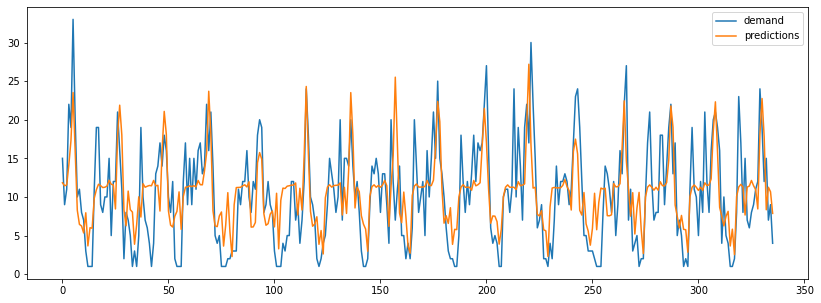

In [215]:
#Create and train forecaster
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123, max_depth = 10, n_estimators = 500),
                              lags = [168])
forecaster.fit(y=train['rides'], exog = train[columns_for_model])

#Predictions and demand
predictions = forecaster.predict(steps=steps, exog = test[columns_for_model])
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [216]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_10 = evaluation_model_10.append({'model':'Random Forest with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_10

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,22.88871,3.836707,4.784215,-0.274839


##### Cat Boost

In [217]:
forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True),
                              lags = [24*7,24])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:38<00:00, 19.47s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 24 168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 500}
  Backtesting metric: 48.67249265250703



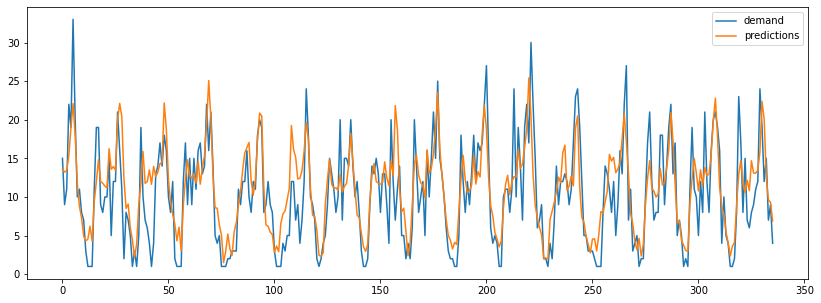

In [218]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_10['rides'],
    exog = rides_per_zone_10[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [219]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_10 = evaluation_model_10.append({'model':'CatBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_10

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,22.88871,3.836707,4.784215,-0.274839
1,CatBoost,16.12647,3.153738,4.015778,0.375379


##### XGBoost

In [220]:
forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123),
                lags = 24*7
             )
#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.5),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [02:12<00:00, 66.45s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 24 168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 10, 'n_estimators': 100}
  Backtesting metric: 43.30315765194245



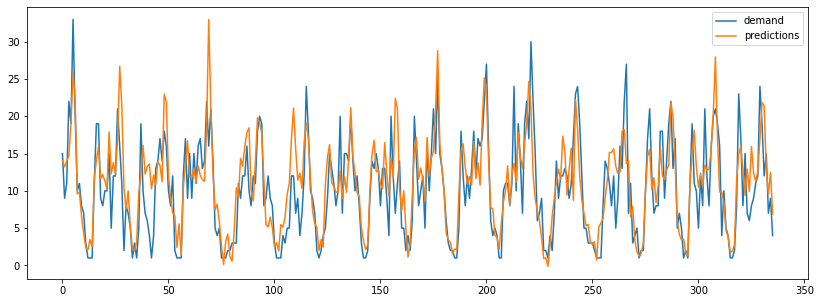

In [221]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y = rides_per_zone_10['rides'],
    exog = rides_per_zone_10[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [222]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_10 = evaluation_model_10.append({'model':'XGBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_10

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,22.888710,3.836707,4.784215,-0.274839
1,CatBoost,16.126470,3.153738,4.015778,0.375379
2,XGBoost,17.343265,3.188884,4.164525,0.500002


##### Light GBM

In [223]:
forecaster = ForecasterAutoreg(regressor = LGBMRegressor(random_state=123),
                              lags=[24,24*7])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:09<00:00,  4.70s/it]

`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 24 168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 51.94899864925854



In [224]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_10['rides'],
    exog = rides_per_zone_10[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)

predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_10 = evaluation_model_10.append({'model':'LightGBM', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_10

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,22.888710,3.836707,4.784215,-0.274839
1,CatBoost,16.126470,3.153738,4.015778,0.375379
2,XGBoost,17.343265,3.188884,4.164525,0.500002
3,LightGBM,18.978978,3.486811,4.356487,-0.021374


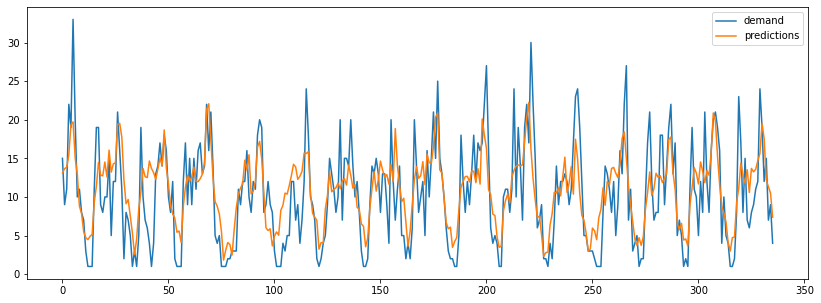

In [225]:
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

##### Choosing the best model

The best model is the CatBoost

In [226]:
#creating and training the forecaster

forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True,learning_rate = 0.1, 
                                                             max_depth = 5, n_estimators = 500),
                              lags = [24*7,24])

forecaster.fit(y=rides_per_zone_10['rides'], exog = rides_per_zone_10[columns_for_model])

#Obtaining exogenous variables for the model
last_day_data = rides_per_zone_10[-1:]
last_day_data = last_day_data.index[0]

exogenous_variables = pd.date_range(last_day_data, periods = 365*24,freq='H')
exogenous_variables = pd.DataFrame(exogenous_variables, columns = ['datetime'])
exogenous_variables = exogenous_variables[1:]
exogenous_variables['hour'] = exogenous_variables['datetime'].dt.hour
exogenous_variables['month'] = exogenous_variables['datetime'].dt.month
exogenous_variables['weekday'] = exogenous_variables['datetime'].dt.day_name()
exogenous_variables.reset_index(inplace=True)
exogenous_variables = pd.get_dummies(exogenous_variables, columns = ['weekday', 'hour', 'month'])
exogenous_variables = exogenous_variables[:steps]

#Obtaining the predictions and save them in the csv
predictions = forecaster.predict(steps=steps,
                                exog = exogenous_variables[columns_for_model])
predictions = predictions.reset_index()

predictions_zone_10 = pd.concat([predictions, exogenous_variables], axis = 1)
predictions_zone_10 = predictions_zone_10[['pred', 'datetime']]
predictions_zone_10['hour'] = predictions_zone_10['datetime'].dt.hour
predictions_zone_10['day'] = predictions_zone_10['datetime'].dt.date
predictions_zone_10['model'] = 'Catboost'
predictions_zone_10['postal_code'] = '28001_9'

predictions_per_zone = predictions_per_zone.append(predictions_zone_10)
predictions_per_zone.to_csv("predictions_per_zone.csv")

### 4.1.11.  Demand prediction for zone: 28014

In [238]:
#Creating the dataframe
rides_per_zone_11 = rides_per_station[rides_per_station['postal_code']==28014]
rides_per_zone_11 = rides_per_zone_11.groupby(['date', 'weekday', 'hour', 'month',
                                             'year', 'time','datetime']).rides.sum().reset_index()
#Converting the column datetime to a datetime format
rides_per_zone_11['datetime'] = pd.to_datetime(rides_per_zone_11['datetime'])
#Resample to fill all values of the time series
rides_per_zone_11.set_index('datetime',inplace=True)
rides_per_zone_11.sort_index(inplace=True)
rides_per_zone_11.resample('1H').sum()

#Adding lag values
rides_per_zone_11['rides_lag_7'] = rides_per_zone_11['rides'].shift(7*24)
rides_per_zone_11['rides_lag_1'] = rides_per_zone_11['rides'].shift(1*24)
rides_per_zone_11['rides_lag_2'] = rides_per_zone_11['rides'].shift(2*24)
rides_per_zone_11['rides_lag_1_month'] = rides_per_zone_11['rides'].shift(30*24)
rides_per_zone_11['rides_lag_12_hours'] = rides_per_zone_11['rides'].shift(12)

#One hot encoding
rides_per_zone_11 = pd.get_dummies(rides_per_zone_11, columns = ['weekday', 'hour', 'month'])
#We save the columns we are using as predictors in columns for model and the target we want to predict in target
columns_for_model = [column for column in rides_per_zone_11.columns
                      if column.startswith(('weekday', 'hour', 'month'))]

target = 'rides'
#Division in train and test
steps = 24*14 # 14 days
train = rides_per_zone_11[:-steps]
test = rides_per_zone_11[-steps:]

#Dataframe to evaluate models
evaluation_model_11 = pd.DataFrame(columns=["model", "MSE", "MAE", "RMSE", "R2"])

##### Random Forest

In [240]:
#Looking for the best hyperparameters: grid search

steps = 14*24
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123),
                              lags = [24*7])
#Number of lags used as predictors
lags_grid = [[24,24*2,24*3,24*4,24*5,24*6,24*7], [24*7]]

#Regressor hyperparameters
param_grid = {'n_estimators':[100,200,500],
             'max_depth': [3,5,10]}

#Grid search
grid_seach = grid_search_forecaster(forecaster = forecaster,
                                   y = train['rides'],
                                   exog = train[columns_for_model],
                                   param_grid = param_grid,
                                   lags_grid = lags_grid,
                                   steps = steps,
                                   refit = True,
                                   metric = 'mean_squared_error',
                                   initial_train_size = int(len(train)*0.25),
                                   fixed_train_size=False,
                                   return_best=True,
                                   verbose=False)

loop param_grid:   0%|                                              | 0/9 [00:00<?, ?it/s]

Number of models compared: 18



loop lags_grid: 100%|███████████████████████████████████| 2/2 [1:54:44<00:00, 3442.01s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'max_depth': 10, 'n_estimators': 500}
  Backtesting metric: 199.3454891948472



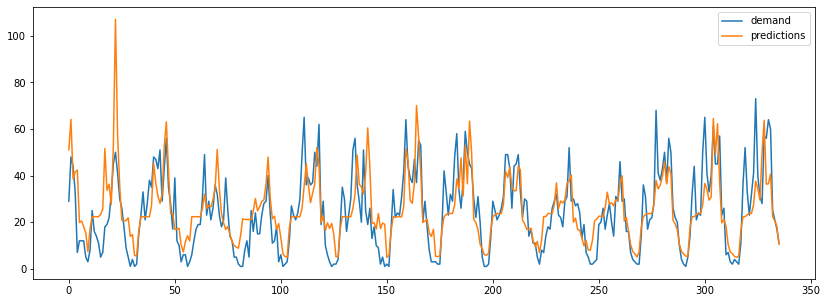

In [241]:
#Create and train forecaster
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123, max_depth = 10, n_estimators = 500),
                              lags = [168])
forecaster.fit(y=train['rides'], exog = train[columns_for_model])

#Predictions and demand
predictions = forecaster.predict(steps=steps, exog = test[columns_for_model])
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

In [242]:
#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_11 = evaluation_model_11.append({'model':'Random Forest with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_11

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,130.729675,8.527127,11.433708,0.297518


##### Cat Boost

In [243]:
forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True),
                              lags = [24*7,24])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [01:52<00:00, 56.22s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 10, 'n_estimators': 500}
  Backtesting metric: 138.7318831628314



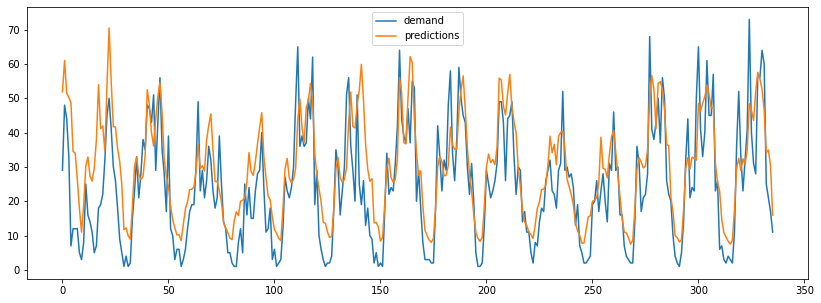

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,130.729675,8.527127,11.433708,0.297518
1,CatBoost,120.762595,8.874302,10.989204,0.406679


In [245]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_11['rides'],
    exog = rides_per_zone_11[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_11 = evaluation_model_11.append({'model':'CatBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_11

##### XGBoost

In [246]:
forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123),
                lags = 24*7
             )
#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.5),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|██████████████████████████████████████| 2/2 [06:22<00:00, 191.36s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}
  Backtesting metric: 205.5649444577634



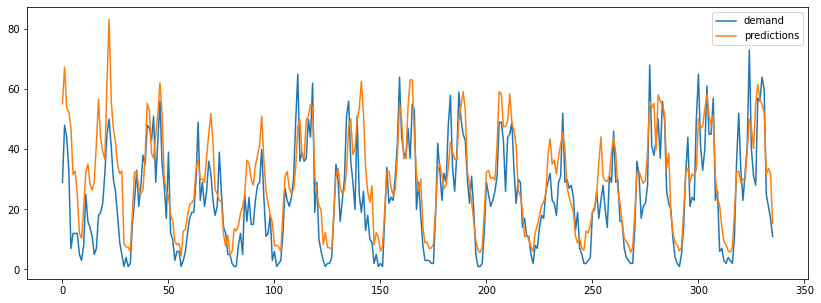

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,130.729675,8.527127,11.433708,0.297518
1,CatBoost,120.762595,8.874302,10.989204,0.406679
2,XGBoost,125.720242,8.778553,11.212504,0.503057


In [247]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y = rides_per_zone_11['rides'],
    exog = rides_per_zone_11[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_11 = evaluation_model_11.append({'model':'XGBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_11

##### Light GBM

In [248]:
forecaster = ForecasterAutoreg(regressor = LGBMRegressor(random_state=123),
                              lags=[24,24*7])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:25<00:00, 12.93s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}
  Backtesting metric: 138.70454737848442



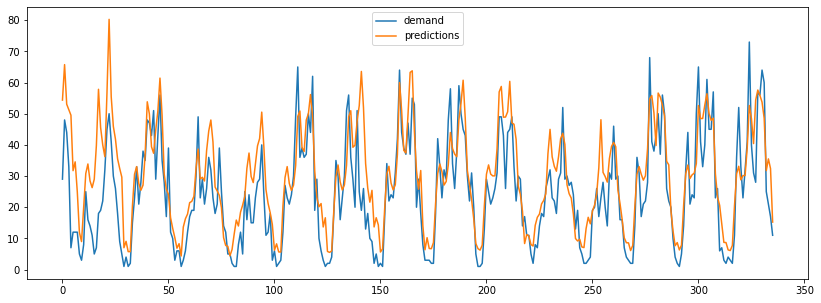

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,130.729675,8.527127,11.433708,0.297518
1,CatBoost,120.762595,8.874302,10.989204,0.406679
2,XGBoost,125.720242,8.778553,11.212504,0.503057
3,LightGBM,125.085598,8.785101,11.184167,0.490852


In [249]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_11['rides'],
    exog = rides_per_zone_11[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)

predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_11 = evaluation_model_11.append({'model':'LightGBM', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_11

##### Choosing the best model

The best model is Cat Boost

In [250]:
#creating and training the forecaster

forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True,learning_rate = 0.1, 
                                                             max_depth = 10, n_estimators = 500),
                              lags = [24*7])

forecaster.fit(y=rides_per_zone_11['rides'], exog = rides_per_zone_11[columns_for_model])

#Obtaining exogenous variables for the model
last_day_data = rides_per_zone_11[-1:]
last_day_data = last_day_data.index[0]

exogenous_variables = pd.date_range(last_day_data, periods = 365*24,freq='H')
exogenous_variables = pd.DataFrame(exogenous_variables, columns = ['datetime'])
exogenous_variables = exogenous_variables[1:]
exogenous_variables['hour'] = exogenous_variables['datetime'].dt.hour
exogenous_variables['month'] = exogenous_variables['datetime'].dt.month
exogenous_variables['weekday'] = exogenous_variables['datetime'].dt.day_name()
exogenous_variables.reset_index(inplace=True)
exogenous_variables = pd.get_dummies(exogenous_variables, columns = ['weekday', 'hour', 'month'])
exogenous_variables = exogenous_variables[:steps]

#Obtaining the predictions and save them in the csv
predictions = forecaster.predict(steps=steps,
                                exog = exogenous_variables[columns_for_model])
predictions = predictions.reset_index()

predictions_zone_11 = pd.concat([predictions, exogenous_variables], axis = 1)
predictions_zone_11 = predictions_zone_11[['pred', 'datetime']]
predictions_zone_11['hour'] = predictions_zone_11['datetime'].dt.hour
predictions_zone_11['day'] = predictions_zone_11['datetime'].dt.date
predictions_zone_11['model'] = 'Catboost'
predictions_zone_11['postal_code'] = '28014'

predictions_per_zone = predictions_per_zone.append(predictions_zone_11)
predictions_per_zone.to_csv("predictions_per_zone.csv")

In [254]:
rides_per_station['postal_code'].unique()

array([28014, 28004, '28001_2', '28001_8', 28005, 28015, '28001_7', 28013,
       28012, 28009, 28007, 28006, '28001_3', 28028, 28046, 28008, 28045,
       '28001_0', 28020, '28001_5', 28003, 28010, 28016, '28001_1',
       '28001_4', 28027, 28002, 28039, '28001_9', 28026, 28029, 28030,
       28011, 28038, 28019, 28053, 28017, '28001_6'], dtype=object)

### 4.1.12.  Demand prediction for zone: 28004

In [255]:
#Creating the dataframe
rides_per_zone_12 = rides_per_station[rides_per_station['postal_code']==28004]
rides_per_zone_12 = rides_per_zone_12.groupby(['date', 'weekday', 'hour', 'month',
                                             'year', 'time','datetime']).rides.sum().reset_index()
#Converting the column datetime to a datetime format
rides_per_zone_12['datetime'] = pd.to_datetime(rides_per_zone_12['datetime'])
#Resample to fill all values of the time series
rides_per_zone_12.set_index('datetime',inplace=True)
rides_per_zone_12.sort_index(inplace=True)
rides_per_zone_12.resample('1H').sum()

#Adding lag values
rides_per_zone_12['rides_lag_7'] = rides_per_zone_12['rides'].shift(7*24)
rides_per_zone_12['rides_lag_1'] = rides_per_zone_12['rides'].shift(1*24)
rides_per_zone_12['rides_lag_2'] = rides_per_zone_12['rides'].shift(2*24)
rides_per_zone_12['rides_lag_1_month'] = rides_per_zone_12['rides'].shift(30*24)
rides_per_zone_12['rides_lag_12_hours'] = rides_per_zone_12['rides'].shift(12)

#One hot encoding
rides_per_zone_12 = pd.get_dummies(rides_per_zone_12, columns = ['weekday', 'hour', 'month'])
#We save the columns we are using as predictors in columns for model and the target we want to predict in target
columns_for_model = [column for column in rides_per_zone_12.columns
                      if column.startswith(('weekday', 'hour', 'month'))]

target = 'rides'
#Division in train and test
steps = 24*14 # 14 days
train = rides_per_zone_12[:-steps]
test = rides_per_zone_12[-steps:]

#Dataframe to evaluate models
evaluation_model_12 = pd.DataFrame(columns=["model", "MSE", "MAE", "RMSE", "R2"])

##### Random Forest

In [256]:
#Looking for the best hyperparameters: grid search

steps = 14*24
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123),
                              lags = [24*7])
#Number of lags used as predictors
lags_grid = [[24,24*2,24*3,24*4,24*5,24*6,24*7], [24*7]]

#Regressor hyperparameters
param_grid = {'n_estimators':[100,200,500],
             'max_depth': [3,5,10]}

#Grid search
grid_seach = grid_search_forecaster(forecaster = forecaster,
                                   y = train['rides'],
                                   exog = train[columns_for_model],
                                   param_grid = param_grid,
                                   lags_grid = lags_grid,
                                   steps = steps,
                                   refit = True,
                                   metric = 'mean_squared_error',
                                   initial_train_size = int(len(train)*0.25),
                                   fixed_train_size=False,
                                   return_best=True,
                                   verbose=False)

loop param_grid:   0%|                                              | 0/9 [00:00<?, ?it/s]

Number of models compared: 18



loop lags_grid: 100%|███████████████████████████████████| 2/2 [2:29:16<00:00, 4478.29s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'max_depth': 10, 'n_estimators': 200}
  Backtesting metric: 455.04341371889006



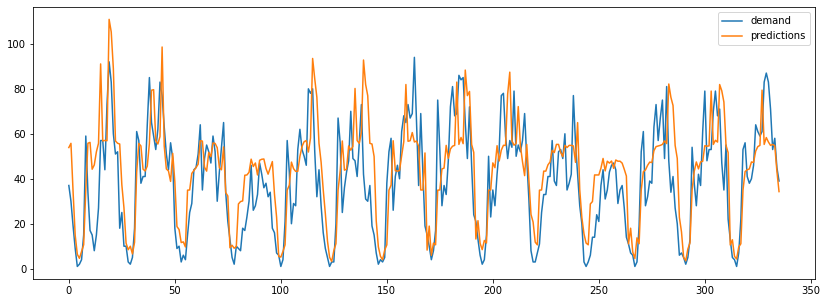

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,296.381358,13.612703,17.21573,0.326401


In [257]:
#Create and train forecaster
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123, max_depth = 10, n_estimators = 200),
                              lags = [168])
forecaster.fit(y=train['rides'], exog = train[columns_for_model])

#Predictions and demand
predictions = forecaster.predict(steps=steps, exog = test[columns_for_model])
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_12 = evaluation_model_12.append({'model':'Random Forest with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_12

##### Catboost

In [258]:
forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True),
                              lags = [24*7,24])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [02:08<00:00, 64.36s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 500}
  Backtesting metric: 368.1545154591731



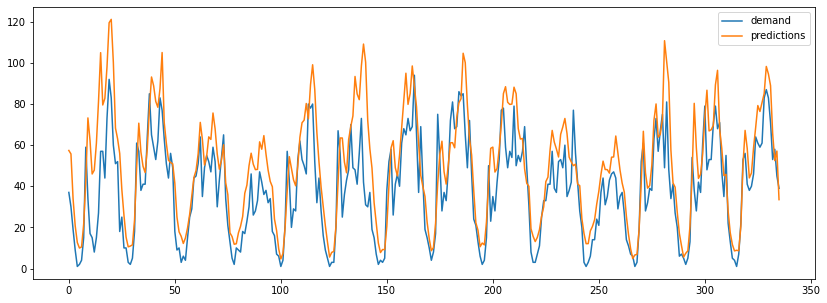

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,296.381358,13.612703,17.215730,0.326401
1,CatBoost,336.532730,14.023152,18.344828,0.516706


In [259]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_12['rides'],
    exog = rides_per_zone_12[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_12 = evaluation_model_12.append({'model':'CatBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_12

##### XGBoost

In [260]:
forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123),
                lags = 24*7
             )
#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.5),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|██████████████████████████████████████| 2/2 [07:37<00:00, 228.80s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 478.3765453783462



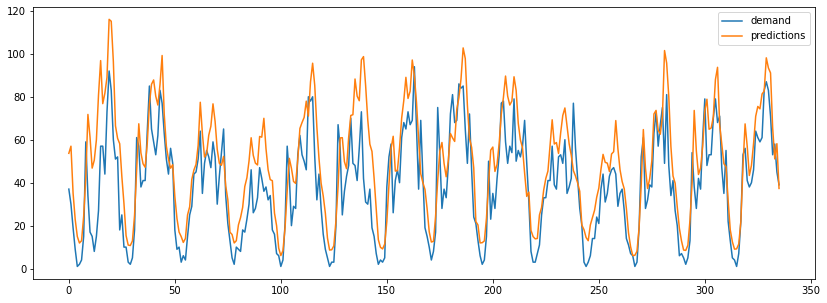

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,296.381358,13.612703,17.215730,0.326401
1,CatBoost,336.532730,14.023152,18.344828,0.516706
2,XGBoost,311.618683,14.032006,17.652725,0.500250


In [261]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y = rides_per_zone_12['rides'],
    exog = rides_per_zone_12[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_12 = evaluation_model_12.append({'model':'XGBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_12

##### Light GBM

In [262]:
forecaster = ForecasterAutoreg(regressor = LGBMRegressor(random_state=123),
                              lags=[24,24*7])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:27<00:00, 13.79s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 380.82046044161626



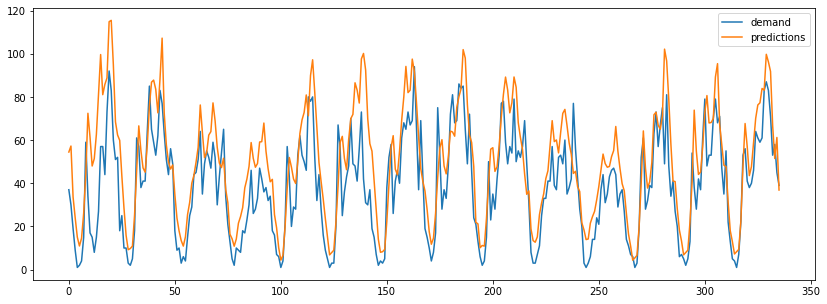

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,296.381358,13.612703,17.215730,0.326401
1,CatBoost,336.532730,14.023152,18.344828,0.516706
2,XGBoost,311.618683,14.032006,17.652725,0.500250
3,LightGBM,322.704051,14.116536,17.963965,0.500125


In [263]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_12['rides'],
    exog = rides_per_zone_12[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)

predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_12 = evaluation_model_12.append({'model':'LightGBM', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_12

##### Choosing the best model

 The best model is the Random Forest

In [269]:
#creating and training the forecaster

forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123, max_depth = 10, n_estimators = 200),
                              lags = [168])

forecaster.fit(y=rides_per_zone_12['rides'], exog = rides_per_zone_12[columns_for_model])

#Obtaining exogenous variables for the model
last_day_data = rides_per_zone_12[-1:]
last_day_data = last_day_data.index[0]

exogenous_variables = pd.date_range(last_day_data, periods = 365*24,freq='H')
exogenous_variables = pd.DataFrame(exogenous_variables, columns = ['datetime'])
exogenous_variables = exogenous_variables[1:]
exogenous_variables['hour'] = exogenous_variables['datetime'].dt.hour
exogenous_variables['month'] = exogenous_variables['datetime'].dt.month
exogenous_variables['weekday'] = exogenous_variables['datetime'].dt.day_name()
exogenous_variables.reset_index(inplace=True)
exogenous_variables = pd.get_dummies(exogenous_variables, columns = ['weekday', 'hour', 'month'])
exogenous_variables = exogenous_variables[:steps]

#Obtaining the predictions and save them in the csv
predictions = forecaster.predict(steps=steps,
                                exog = exogenous_variables[columns_for_model])
predictions = predictions.reset_index()

predictions_zone_12 = pd.concat([predictions, exogenous_variables], axis = 1)
predictions_zone_12 = predictions_zone_12[['pred', 'datetime']]
predictions_zone_12['hour'] = predictions_zone_12['datetime'].dt.hour
predictions_zone_12['day'] = predictions_zone_12['datetime'].dt.date
predictions_zone_12['model'] = 'Catboost'
predictions_zone_12['postal_code'] = '28004'

predictions_per_zone = predictions_per_zone.append(predictions_zone_12)
predictions_per_zone.to_csv("predictions_per_zone.csv")

### 4.1.13.  Demand prediction for zone: 28005

In [271]:
#Creating the dataframe
rides_per_zone_13 = rides_per_station[rides_per_station['postal_code']==28005]
rides_per_zone_13 = rides_per_zone_13.groupby(['date', 'weekday', 'hour', 'month',
                                             'year', 'time','datetime']).rides.sum().reset_index()
#Converting the column datetime to a datetime format
rides_per_zone_13['datetime'] = pd.to_datetime(rides_per_zone_13['datetime'])
#Resample to fill all values of the time series
rides_per_zone_13.set_index('datetime',inplace=True)
rides_per_zone_13.sort_index(inplace=True)
rides_per_zone_13.resample('1H').sum()

#Adding lag values
rides_per_zone_13['rides_lag_7'] = rides_per_zone_13['rides'].shift(7*24)
rides_per_zone_13['rides_lag_1'] = rides_per_zone_13['rides'].shift(1*24)
rides_per_zone_13['rides_lag_2'] = rides_per_zone_13['rides'].shift(2*24)
rides_per_zone_13['rides_lag_1_month'] = rides_per_zone_13['rides'].shift(30*24)
rides_per_zone_13['rides_lag_12_hours'] = rides_per_zone_13['rides'].shift(12)

#One hot encoding
rides_per_zone_13 = pd.get_dummies(rides_per_zone_13, columns = ['weekday', 'hour', 'month'])
#We save the columns we are using as predictors in columns for model and the target we want to predict in target
columns_for_model = [column for column in rides_per_zone_13.columns
                      if column.startswith(('weekday', 'hour', 'month'))]

target = 'rides'
#Division in train and test
steps = 24*14 # 14 days
train = rides_per_zone_13[:-steps]
test = rides_per_zone_13[-steps:]

#Dataframe to evaluate models
evaluation_model_13 = pd.DataFrame(columns=["model", "MSE", "MAE", "RMSE", "R2"])

##### Random Forest

In [272]:
#Looking for the best hyperparameters: grid search

steps = 14*24
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123),
                              lags = [24*7])
#Number of lags used as predictors
lags_grid = [[24,24*2,24*3,24*4,24*5,24*6,24*7], [24*7]]

#Regressor hyperparameters
param_grid = {'n_estimators':[100,200,500],
             'max_depth': [3,5,10]}

#Grid search
grid_seach = grid_search_forecaster(forecaster = forecaster,
                                   y = train['rides'],
                                   exog = train[columns_for_model],
                                   param_grid = param_grid,
                                   lags_grid = lags_grid,
                                   steps = steps,
                                   refit = True,
                                   metric = 'mean_squared_error',
                                   initial_train_size = int(len(train)*0.25),
                                   fixed_train_size=False,
                                   return_best=True,
                                   verbose=False)

loop param_grid:   0%|                                              | 0/9 [00:00<?, ?it/s]

Number of models compared: 18



loop lags_grid: 100%|█████████████████████████████████| 2/2 [17:04:49<00:00, 30744.57s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'max_depth': 10, 'n_estimators': 500}
  Backtesting metric: 425.30850520126836



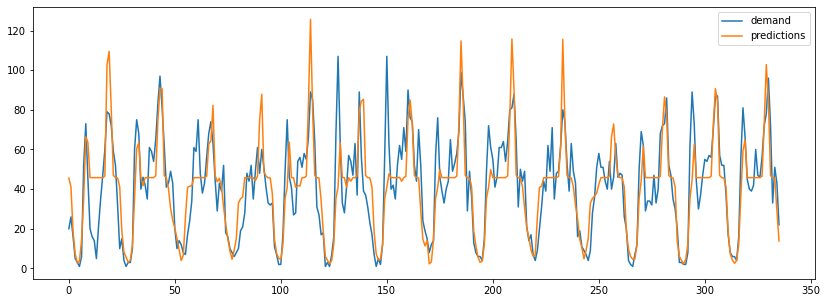

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,210.578669,10.552525,14.511329,0.598346


In [273]:
#Create and train forecaster
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123, max_depth = 10, n_estimators = 500),
                              lags = [168])
forecaster.fit(y=train['rides'], exog = train[columns_for_model])

#Predictions and demand
predictions = forecaster.predict(steps=steps, exog = test[columns_for_model])
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_13 = evaluation_model_13.append({'model':'Random Forest with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_13

##### Cat Boost

In [274]:
forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True),
                              lags = [24*7,24])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [02:05<00:00, 62.66s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 24 168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 500}
  Backtesting metric: 341.370178704542



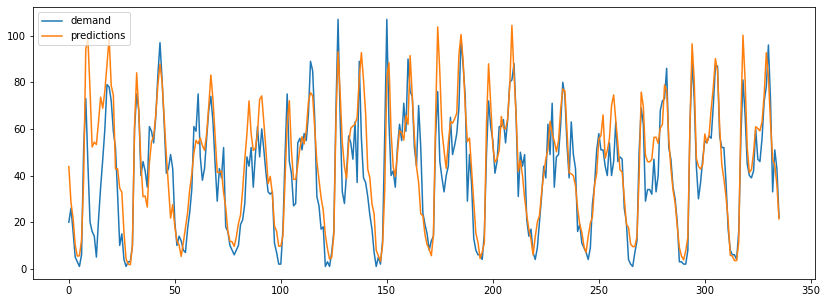

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,210.578669,10.552525,14.511329,0.598346
1,CatBoost,174.449915,9.480848,13.207949,0.720269


In [275]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_13['rides'],
    exog = rides_per_zone_13[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_13 = evaluation_model_13.append({'model':'CatBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_13

##### XGBoost

In [276]:
forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123),
                lags = 24*7
             )
#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.5),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|██████████████████████████████████████| 2/2 [07:13<00:00, 216.54s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 24 168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 500}
  Backtesting metric: 416.86184425119836



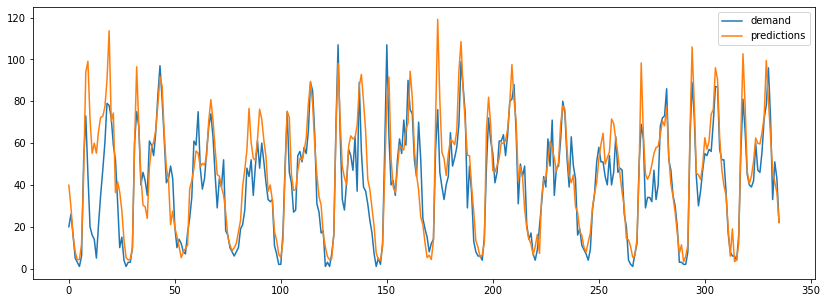

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,210.578669,10.552525,14.511329,0.598346
1,CatBoost,174.449915,9.480848,13.207949,0.720269
2,XGBoost,180.254475,9.300164,13.425888,0.737179


In [277]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y = rides_per_zone_13['rides'],
    exog = rides_per_zone_13[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_13 = evaluation_model_13.append({'model':'XGBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_13

##### Light GBM

In [279]:
forecaster = ForecasterAutoreg(regressor = LGBMRegressor(random_state=123),
                              lags=[24,24*7])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:25<00:00, 12.69s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 24 168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 500}
  Backtesting metric: 351.970039589798



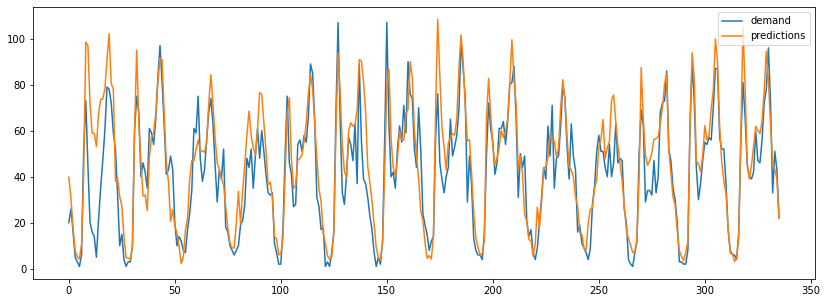

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,210.578669,10.552525,14.511329,0.598346
1,CatBoost,174.449915,9.480848,13.207949,0.720269
2,XGBoost,180.254475,9.300164,13.425888,0.737179
3,LightGBM,180.254475,9.300164,13.425888,0.737179
4,LightGBM,181.004899,9.516261,13.453806,0.730169


In [280]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_13['rides'],
    exog = rides_per_zone_13[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)

predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_13 = evaluation_model_13.append({'model':'LightGBM', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_13

##### Choosing the best model

The best model is the Cat Boost

In [283]:
#creating and training the forecaster

forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True,
                                                            learning_rate =  0.1, max_depth = 5, n_estimators= 500),
                              lags = [24*7,24])

forecaster.fit(y=rides_per_zone_13['rides'], exog = rides_per_zone_13[columns_for_model])

#Obtaining exogenous variables for the model
last_day_data = rides_per_zone_13[-1:]
last_day_data = last_day_data.index[0]

exogenous_variables = pd.date_range(last_day_data, periods = 365*24,freq='H')
exogenous_variables = pd.DataFrame(exogenous_variables, columns = ['datetime'])
exogenous_variables = exogenous_variables[1:]
exogenous_variables['hour'] = exogenous_variables['datetime'].dt.hour
exogenous_variables['month'] = exogenous_variables['datetime'].dt.month
exogenous_variables['weekday'] = exogenous_variables['datetime'].dt.day_name()
exogenous_variables.reset_index(inplace=True)
exogenous_variables = pd.get_dummies(exogenous_variables, columns = ['weekday', 'hour', 'month'])
exogenous_variables = exogenous_variables[:steps]

#Obtaining the predictions and save them in the csv
predictions = forecaster.predict(steps=steps,
                                exog = exogenous_variables[columns_for_model])
predictions = predictions.reset_index()

predictions_zone_13 = pd.concat([predictions, exogenous_variables], axis = 1)
predictions_zone_13 = predictions_zone_13[['pred', 'datetime']]
predictions_zone_13['hour'] = predictions_zone_13['datetime'].dt.hour
predictions_zone_13['day'] = predictions_zone_13['datetime'].dt.date
predictions_zone_13['model'] = 'Catboost'
predictions_zone_13['postal_code'] = '28005'

predictions_per_zone = predictions_per_zone.append(predictions_zone_13)
predictions_per_zone.to_csv("predictions_per_zone.csv")

### 4.1.14.  Demand prediction for zone: 28015

In [285]:
#Creating the dataframe
rides_per_zone_14 = rides_per_station[rides_per_station['postal_code']==28015]
rides_per_zone_14 = rides_per_zone_14.groupby(['date', 'weekday', 'hour', 'month',
                                             'year', 'time','datetime']).rides.sum().reset_index()
#Converting the column datetime to a datetime format
rides_per_zone_14['datetime'] = pd.to_datetime(rides_per_zone_14['datetime'])
#Resample to fill all values of the time series
rides_per_zone_14.set_index('datetime',inplace=True)
rides_per_zone_14.sort_index(inplace=True)
rides_per_zone_14.resample('1H').sum()

#Adding lag values
rides_per_zone_14['rides_lag_7'] = rides_per_zone_14['rides'].shift(7*24)
rides_per_zone_14['rides_lag_1'] = rides_per_zone_14['rides'].shift(1*24)
rides_per_zone_14['rides_lag_2'] = rides_per_zone_14['rides'].shift(2*24)
rides_per_zone_14['rides_lag_1_month'] = rides_per_zone_14['rides'].shift(30*24)
rides_per_zone_14['rides_lag_12_hours'] = rides_per_zone_14['rides'].shift(12)

#One hot encoding
rides_per_zone_14 = pd.get_dummies(rides_per_zone_14, columns = ['weekday', 'hour', 'month'])
#We save the columns we are using as predictors in columns for model and the target we want to predict in target
columns_for_model = [column for column in rides_per_zone_14.columns
                      if column.startswith(('weekday', 'hour', 'month'))]

target = 'rides'
#Division in train and test
steps = 24*14 # 14 days
train = rides_per_zone_14[:-steps]
test = rides_per_zone_14[-steps:]

#Dataframe to evaluate models
evaluation_model_14 = pd.DataFrame(columns=["model", "MSE", "MAE", "RMSE", "R2"])

##### Random Forest

In [286]:
#Looking for the best hyperparameters: grid search

steps = 14*24
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123),
                              lags = [24*7])
#Number of lags used as predictors
lags_grid = [[24,24*2,24*3,24*4,24*5,24*6,24*7], [24*7]]

#Regressor hyperparameters
param_grid = {'n_estimators':[100,200,500],
             'max_depth': [3,5,10]}

#Grid search
grid_seach = grid_search_forecaster(forecaster = forecaster,
                                   y = train['rides'],
                                   exog = train[columns_for_model],
                                   param_grid = param_grid,
                                   lags_grid = lags_grid,
                                   steps = steps,
                                   refit = True,
                                   metric = 'mean_squared_error',
                                   initial_train_size = int(len(train)*0.25),
                                   fixed_train_size=False,
                                   return_best=True,
                                   verbose=False)

loop param_grid:   0%|                                              | 0/9 [00:00<?, ?it/s]

Number of models compared: 18



loop lags_grid: 100%|███████████████████████████████████| 2/2 [1:48:14<00:00, 3247.45s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'max_depth': 10, 'n_estimators': 500}
  Backtesting metric: 70.94671544006243



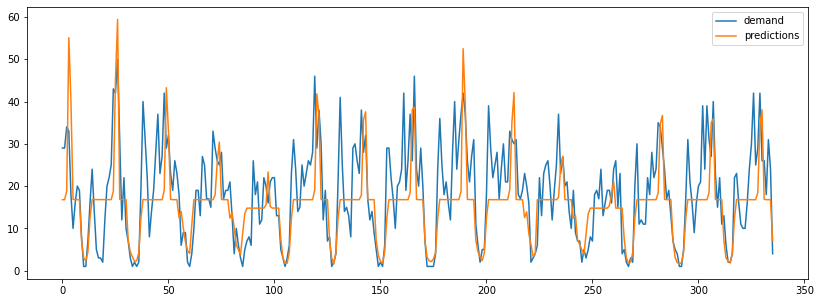

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,72.707629,6.419025,8.526877,0.012088


In [287]:
#Create and train forecaster
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123, max_depth = 10, n_estimators = 500),
                              lags = [168])
forecaster.fit(y=train['rides'], exog = train[columns_for_model])

#Predictions and demand
predictions = forecaster.predict(steps=steps, exog = test[columns_for_model])
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_14 = evaluation_model_14.append({'model':'Random Forest with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_14

##### Cat Boost

In [288]:
forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True),
                              lags = [24*7,24])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [01:51<00:00, 55.71s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 24 168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 500}
  Backtesting metric: 70.70400433363707



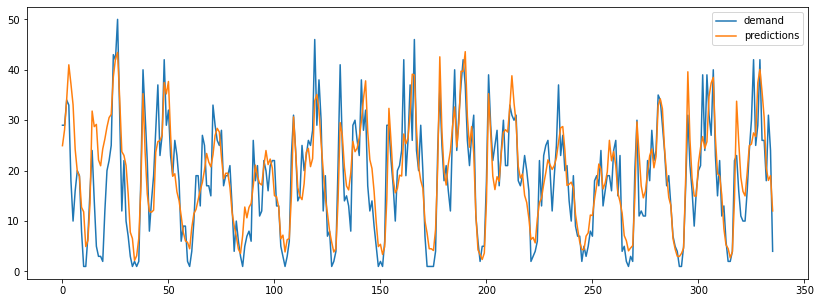

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,72.707629,6.419025,8.526877,0.012088
1,CatBoost,37.242061,4.672887,6.102627,0.611410


In [289]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_14['rides'],
    exog = rides_per_zone_14[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_14 = evaluation_model_14.append({'model':'CatBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_14

##### XGBoost

In [290]:
forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123),
                lags = 24*7
             )
#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.5),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|██████████████████████████████████████| 2/2 [07:03<00:00, 211.94s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}
  Backtesting metric: 65.48403503985095



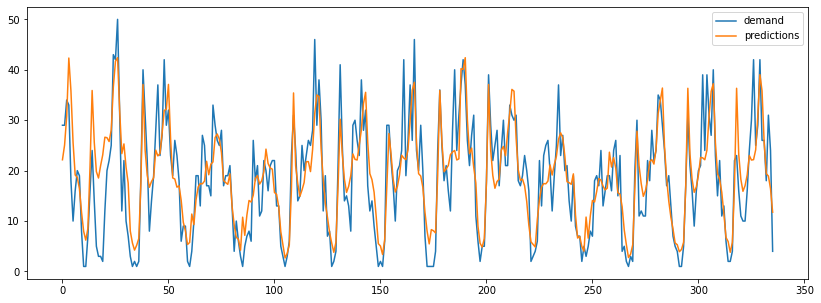

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,72.707629,6.419025,8.526877,0.012088
1,CatBoost,37.242061,4.672887,6.102627,0.611410
2,XGBoost,36.359891,4.613245,6.029916,0.543472


In [291]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y = rides_per_zone_14['rides'],
    exog = rides_per_zone_14[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_14 = evaluation_model_14.append({'model':'XGBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_14

##### LightGBM

In [293]:
forecaster = ForecasterAutoreg(regressor = LGBMRegressor(random_state=123),
                              lags=[24,24*7])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:27<00:00, 13.84s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 72.00861821617725



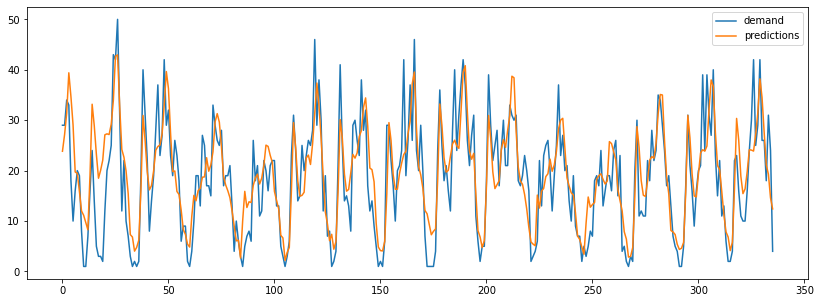

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,72.707629,6.419025,8.526877,0.012088
1,CatBoost,37.242061,4.672887,6.102627,0.611410
2,XGBoost,36.359891,4.613245,6.029916,0.543472
3,LightGBM,39.381855,4.950990,6.275496,0.515807


In [294]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_14['rides'],
    exog = rides_per_zone_14[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)

predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_14 = evaluation_model_14.append({'model':'LightGBM', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_14

##### Choosing the best model

The best model is an XGBoost

In [298]:
#creating and training the forecaster

forecaster = ForecasterAutoreg(regressor = XGBRegressor(random_state=123, silent=True,
                                                            learning_rate =  0.1, max_depth = 5, n_estimators= 100),
                              lags = [24*7])

forecaster.fit(y=rides_per_zone_14['rides'], exog = rides_per_zone_14[columns_for_model])

#Obtaining exogenous variables for the model
last_day_data = rides_per_zone_14[-1:]
last_day_data = last_day_data.index[0]

exogenous_variables = pd.date_range(last_day_data, periods = 365*24,freq='H')
exogenous_variables = pd.DataFrame(exogenous_variables, columns = ['datetime'])
exogenous_variables = exogenous_variables[1:]
exogenous_variables['hour'] = exogenous_variables['datetime'].dt.hour
exogenous_variables['month'] = exogenous_variables['datetime'].dt.month
exogenous_variables['weekday'] = exogenous_variables['datetime'].dt.day_name()
exogenous_variables.reset_index(inplace=True)
exogenous_variables = pd.get_dummies(exogenous_variables, columns = ['weekday', 'hour', 'month'])
exogenous_variables = exogenous_variables[:steps]

#Obtaining the predictions and save them in the csv
predictions = forecaster.predict(steps=steps,
                                exog = exogenous_variables[columns_for_model])
predictions = predictions.reset_index()

predictions_zone_14 = pd.concat([predictions, exogenous_variables], axis = 1)
predictions_zone_14 = predictions_zone_14[['pred', 'datetime']]
predictions_zone_14['hour'] = predictions_zone_14['datetime'].dt.hour
predictions_zone_14['day'] = predictions_zone_14['datetime'].dt.date
predictions_zone_14['model'] = 'XGBoost'
predictions_zone_14['postal_code'] = '28015'

predictions_per_zone = predictions_per_zone.append(predictions_zone_14)
predictions_per_zone.to_csv("predictions_per_zone.csv")

[19:38:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/learner.cc:627: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




### 4.1.15.  Demand prediction for zone: 28013

In [300]:
#Creating the dataframe
rides_per_zone_15 = rides_per_station[rides_per_station['postal_code']==28013]
rides_per_zone_15 = rides_per_zone_15.groupby(['date', 'weekday', 'hour', 'month',
                                             'year', 'time','datetime']).rides.sum().reset_index()
#Converting the column datetime to a datetime format
rides_per_zone_15['datetime'] = pd.to_datetime(rides_per_zone_15['datetime'])
#Resample to fill all values of the time series
rides_per_zone_15.set_index('datetime',inplace=True)
rides_per_zone_15.sort_index(inplace=True)
rides_per_zone_15.resample('1H').sum()

#Adding lag values
rides_per_zone_15['rides_lag_7'] = rides_per_zone_15['rides'].shift(7*24)
rides_per_zone_15['rides_lag_1'] = rides_per_zone_15['rides'].shift(1*24)
rides_per_zone_15['rides_lag_2'] = rides_per_zone_15['rides'].shift(2*24)
rides_per_zone_15['rides_lag_1_month'] = rides_per_zone_15['rides'].shift(30*24)
rides_per_zone_15['rides_lag_12_hours'] = rides_per_zone_15['rides'].shift(12)

#One hot encoding
rides_per_zone_15 = pd.get_dummies(rides_per_zone_15, columns = ['weekday', 'hour', 'month'])
#We save the columns we are using as predictors in columns for model and the target we want to predict in target
columns_for_model = [column for column in rides_per_zone_15.columns
                      if column.startswith(('weekday', 'hour', 'month'))]

target = 'rides'
#Division in train and test
steps = 24*14 # 14 days
train = rides_per_zone_15[:-steps]
test = rides_per_zone_15[-steps:]

#Dataframe to evaluate models
evaluation_model_15 = pd.DataFrame(columns=["model", "MSE", "MAE", "RMSE", "R2"])

##### Random Forest

In [301]:
#Looking for the best hyperparameters: grid search

steps = 14*24
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123),
                              lags = [24*7])
#Number of lags used as predictors
lags_grid = [[24,24*2,24*3,24*4,24*5,24*6,24*7], [24*7]]

#Regressor hyperparameters
param_grid = {'n_estimators':[100,200,500],
             'max_depth': [3,5,10]}

#Grid search
grid_seach = grid_search_forecaster(forecaster = forecaster,
                                   y = train['rides'],
                                   exog = train[columns_for_model],
                                   param_grid = param_grid,
                                   lags_grid = lags_grid,
                                   steps = steps,
                                   refit = True,
                                   metric = 'mean_squared_error',
                                   initial_train_size = int(len(train)*0.25),
                                   fixed_train_size=False,
                                   return_best=True,
                                   verbose=False)

loop param_grid:   0%|                                              | 0/9 [00:00<?, ?it/s]

Number of models compared: 18



loop lags_grid: 100%|███████████████████████████████████| 2/2 [2:42:00<00:00, 4860.48s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'max_depth': 10, 'n_estimators': 500}
  Backtesting metric: 33.32643432914822



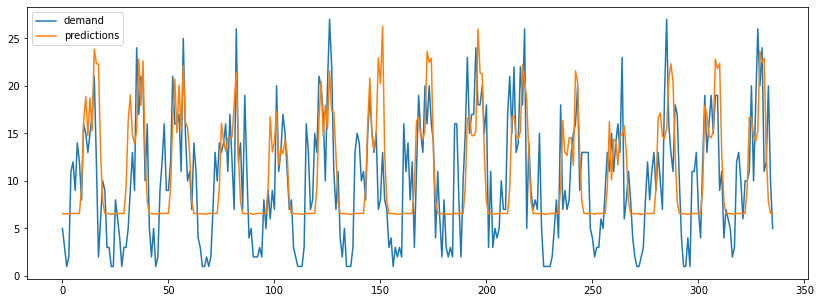

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,27.290467,4.265909,5.224028,0.059267


In [302]:
#Create and train forecaster
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123, max_depth = 10, n_estimators = 500),
                              lags = [168])
forecaster.fit(y=train['rides'], exog = train[columns_for_model])

#Predictions and demand
predictions = forecaster.predict(steps=steps, exog = test[columns_for_model])
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_15 = evaluation_model_15.append({'model':'Random Forest with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_15

##### Cat Boost

In [303]:
forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True),
                              lags = [24*7,24])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [02:53<00:00, 86.66s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 25.292959981636628



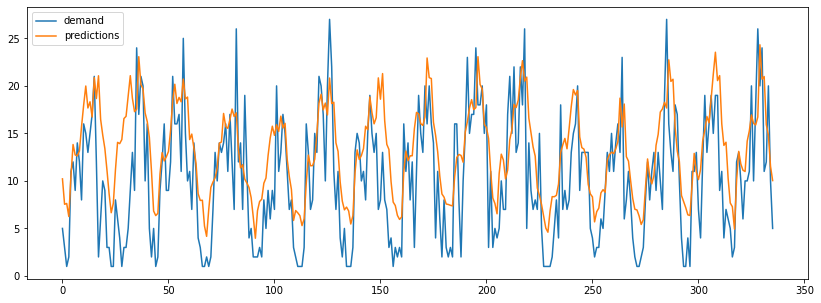

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,27.290467,4.265909,5.224028,0.059267
1,CatBoost,28.833333,4.397349,5.369668,-0.351315


In [304]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_15['rides'],
    exog = rides_per_zone_15[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_15 = evaluation_model_15.append({'model':'CatBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_15

##### XGBoost

In [305]:
forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123),
                lags = 24*7
             )
#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.5),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|██████████████████████████████████████| 2/2 [08:46<00:00, 263.37s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 33.18629887110026



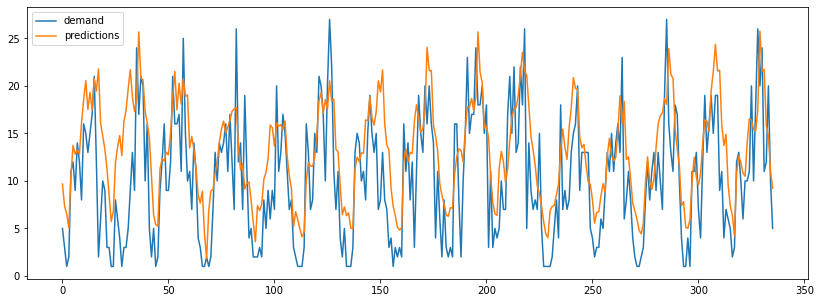

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,27.290467,4.265909,5.224028,0.059267
1,CatBoost,28.833333,4.397349,5.369668,-0.351315
2,XGBoost,28.610815,4.318839,5.348908,-0.124955


In [306]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y = rides_per_zone_15['rides'],
    exog = rides_per_zone_15[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_15 = evaluation_model_15.append({'model':'XGBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_15

##### Light GBM

In [307]:
forecaster = ForecasterAutoreg(regressor = LGBMRegressor(random_state=123),
                              lags=[24,24*7])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:40<00:00, 20.15s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 10, 'n_estimators': 500}
  Backtesting metric: 25.718162879689032



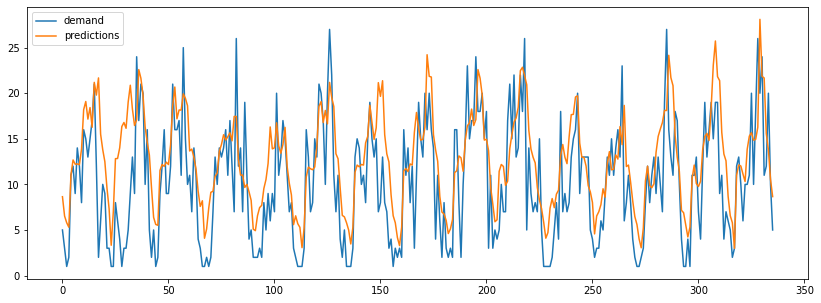

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,27.290467,4.265909,5.224028,0.059267
1,CatBoost,28.833333,4.397349,5.369668,-0.351315
2,XGBoost,28.610815,4.318839,5.348908,-0.124955
3,LightGBM,26.642564,4.082268,5.161644,-0.060719


In [308]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_15['rides'],
    exog = rides_per_zone_15[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)

predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_15 = evaluation_model_15.append({'model':'LightGBM', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_15

##### Choosing the best model

The best model is the Light GBM

In [309]:
#creating and training the forecaster
forecaster = ForecasterAutoreg(regressor = LGBMRegressor(random_state=123, learning_rate = 0.01, 
                                                         max_depth = 10, n_estimators= 500),
                              lags=[24*7])

forecaster.fit(y=rides_per_zone_15['rides'], exog = rides_per_zone_15[columns_for_model])

#Obtaining exogenous variables for the model
last_day_data = rides_per_zone_15[-1:]
last_day_data = last_day_data.index[0]

exogenous_variables = pd.date_range(last_day_data, periods = 365*24,freq='H')
exogenous_variables = pd.DataFrame(exogenous_variables, columns = ['datetime'])
exogenous_variables = exogenous_variables[1:]
exogenous_variables['hour'] = exogenous_variables['datetime'].dt.hour
exogenous_variables['month'] = exogenous_variables['datetime'].dt.month
exogenous_variables['weekday'] = exogenous_variables['datetime'].dt.day_name()
exogenous_variables.reset_index(inplace=True)
exogenous_variables = pd.get_dummies(exogenous_variables, columns = ['weekday', 'hour', 'month'])
exogenous_variables = exogenous_variables[:steps]

#Obtaining the predictions and save them in the csv
predictions = forecaster.predict(steps=steps,
                                exog = exogenous_variables[columns_for_model])
predictions = predictions.reset_index()

predictions_zone_15 = pd.concat([predictions, exogenous_variables], axis = 1)
predictions_zone_15 = predictions_zone_15[['pred', 'datetime']]
predictions_zone_15['hour'] = predictions_zone_15['datetime'].dt.hour
predictions_zone_15['day'] = predictions_zone_15['datetime'].dt.date
predictions_zone_15['model'] = 'Light GBM'
predictions_zone_15['postal_code'] = '28013'

predictions_per_zone = predictions_per_zone.append(predictions_zone_15)
predictions_per_zone.to_csv("predictions_per_zone.csv")

In [311]:
predictions_per_zone

,pred,datetime,hour,day,model,postal_code
0,2.898798,2021-07-01 00:00:00,0,2021-07-01,RandomForest,28001_0
1,2.942485,2021-07-01 01:00:00,1,2021-07-01,RandomForest,28001_0
2,3.313029,2021-07-01 02:00:00,2,2021-07-01,RandomForest,28001_0
3,2.216916,2021-07-01 03:00:00,3,2021-07-01,RandomForest,28001_0
4,1.924609,2021-07-01 04:00:00,4,2021-07-01,RandomForest,28001_0
...,...,...,...,...,...,...
331,20.521574,2021-07-14 19:00:00,19,2021-07-14,Light GBM,28013
332,14.833316,2021-07-14 20:00:00,20,2021-07-14,Light GBM,28013
333,14.071177,2021-07-14 21:00:00,21,2021-07-14,Light GBM,28013
334,11.816487,2021-07-14 22:00:00,22,2021-07-14,Light GBM,28013


### 4.1.16.  Demand prediction for zone: 28012

In [312]:
rides_per_station['postal_code'].unique()

array([28014, 28004, '28001_2', '28001_8', 28005, 28015, '28001_7', 28013,
       28012, 28009, 28007, 28006, '28001_3', 28028, 28046, 28008, 28045,
       '28001_0', 28020, '28001_5', 28003, 28010, 28016, '28001_1',
       '28001_4', 28027, 28002, 28039, '28001_9', 28026, 28029, 28030,
       28011, 28038, 28019, 28053, 28017, '28001_6'], dtype=object)

In [313]:
#Creating the dataframe
rides_per_zone_16 = rides_per_station[rides_per_station['postal_code']==28012]
rides_per_zone_16 = rides_per_zone_16.groupby(['date', 'weekday', 'hour', 'month',
                                             'year', 'time','datetime']).rides.sum().reset_index()
#Converting the column datetime to a datetime format
rides_per_zone_16['datetime'] = pd.to_datetime(rides_per_zone_16['datetime'])
#Resample to fill all values of the time series
rides_per_zone_16.set_index('datetime',inplace=True)
rides_per_zone_16.sort_index(inplace=True)
rides_per_zone_16.resample('1H').sum()

#Adding lag values
rides_per_zone_16['rides_lag_7'] = rides_per_zone_16['rides'].shift(7*24)
rides_per_zone_16['rides_lag_1'] = rides_per_zone_16['rides'].shift(1*24)
rides_per_zone_16['rides_lag_2'] = rides_per_zone_16['rides'].shift(2*24)
rides_per_zone_16['rides_lag_1_month'] = rides_per_zone_16['rides'].shift(30*24)
rides_per_zone_16['rides_lag_12_hours'] = rides_per_zone_16['rides'].shift(12)

#One hot encoding
rides_per_zone_16 = pd.get_dummies(rides_per_zone_16, columns = ['weekday', 'hour', 'month'])
#We save the columns we are using as predictors in columns for model and the target we want to predict in target
columns_for_model = [column for column in rides_per_zone_16.columns
                      if column.startswith(('weekday', 'hour', 'month'))]

target = 'rides'
#Division in train and test
steps = 24*14 # 14 days
train = rides_per_zone_16[:-steps]
test = rides_per_zone_16[-steps:]

#Dataframe to evaluate models
evaluation_model_16 = pd.DataFrame(columns=["model", "MSE", "MAE", "RMSE", "R2"])

##### Random Forest

In [314]:
#Looking for the best hyperparameters: grid search

steps = 14*24
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123),
                              lags = [24*7])
#Number of lags used as predictors
lags_grid = [[24,24*2,24*3,24*4,24*5,24*6,24*7], [24*7]]

#Regressor hyperparameters
param_grid = {'n_estimators':[100,200,500],
             'max_depth': [3,5,10]}

#Grid search
grid_seach = grid_search_forecaster(forecaster = forecaster,
                                   y = train['rides'],
                                   exog = train[columns_for_model],
                                   param_grid = param_grid,
                                   lags_grid = lags_grid,
                                   steps = steps,
                                   refit = True,
                                   metric = 'mean_squared_error',
                                   initial_train_size = int(len(train)*0.25),
                                   fixed_train_size=False,
                                   return_best=True,
                                   verbose=False)

loop param_grid:   0%|                                              | 0/9 [00:00<?, ?it/s]

Number of models compared: 18



loop lags_grid: 100%|███████████████████████████████████| 2/2 [2:39:26<00:00, 4783.25s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'max_depth': 10, 'n_estimators': 100}
  Backtesting metric: 307.5661442996741



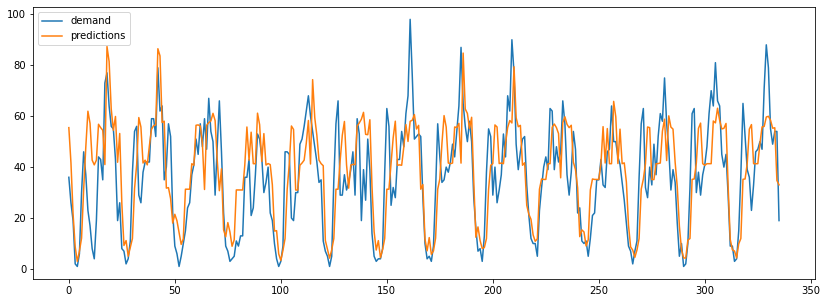

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,243.338624,12.166319,15.599315,0.300326


In [315]:
#Create and train forecaster
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123, max_depth = 10, n_estimators = 100),
                              lags = [168])
forecaster.fit(y=train['rides'], exog = train[columns_for_model])

#Predictions and demand
predictions = forecaster.predict(steps=steps, exog = test[columns_for_model])
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_16 = evaluation_model_16.append({'model':'Random Forest with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_16

##### Cat boost

In [316]:
forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True),
                              lags = [24*7,24])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|██████████████████████████████████████| 2/2 [04:55<00:00, 147.74s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 500}
  Backtesting metric: 307.8945844400921



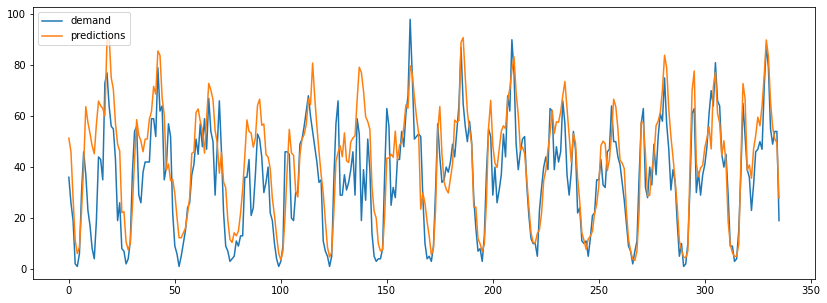

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,243.338624,12.166319,15.599315,0.300326
1,CatBoost,185.562082,10.485100,13.622117,0.597071


In [317]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_16['rides'],
    exog = rides_per_zone_16[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_16 = evaluation_model_16.append({'model':'CatBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_16

##### XGBoost

In [318]:
forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123),
                lags = 24*7
             )
#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.5),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|██████████████████████████████████████| 2/2 [11:31<00:00, 345.77s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 337.5109145103881



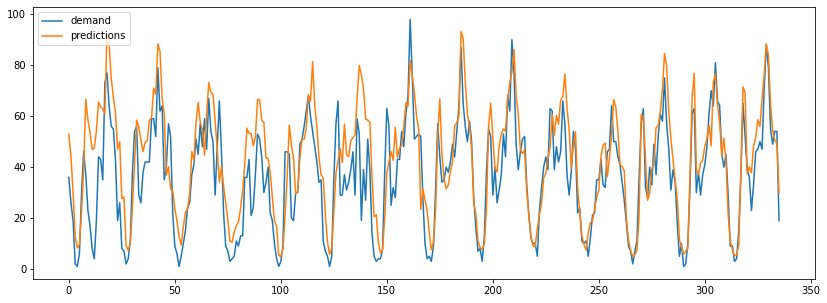

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,243.338624,12.166319,15.599315,0.300326
1,CatBoost,185.562082,10.485100,13.622117,0.597071
2,XGBoost,195.290418,10.739459,13.974635,0.572895


In [319]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y = rides_per_zone_16['rides'],
    exog = rides_per_zone_16[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_16 = evaluation_model_16.append({'model':'XGBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_16

##### Light GBM

In [320]:
forecaster = ForecasterAutoreg(regressor = LGBMRegressor(random_state=123),
                              lags=[24,24*7])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:50<00:00, 25.15s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 500}
  Backtesting metric: 307.8137610016051



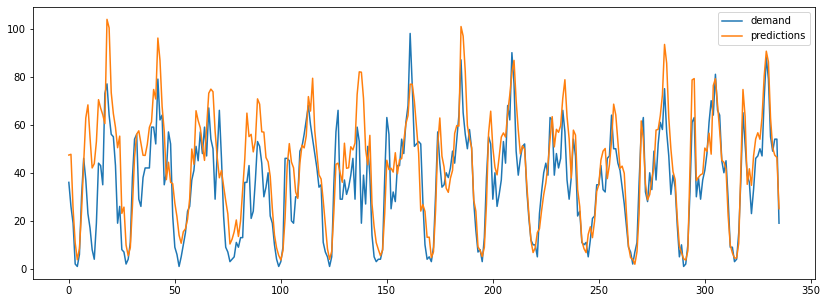

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,243.338624,12.166319,15.599315,0.300326
1,CatBoost,185.562082,10.485100,13.622117,0.597071
2,XGBoost,195.290418,10.739459,13.974635,0.572895
3,LightGBM,195.535361,10.567402,13.983396,0.614906


In [321]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_16['rides'],
    exog = rides_per_zone_16[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)

predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_16 = evaluation_model_16.append({'model':'LightGBM', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_16

##### Choosing the best model

The model with the best metrics is the Cat Boost

In [323]:
#creating and training the forecaster

forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, learning_rate = 0.01, 
                                                         max_depth = 5, n_estimators= 500),
                              lags=[24*7])

forecaster.fit(y=rides_per_zone_16['rides'], exog = rides_per_zone_16[columns_for_model])

#Obtaining exogenous variables for the model
last_day_data = rides_per_zone_15[-1:]
last_day_data = last_day_data.index[0]

exogenous_variables = pd.date_range(last_day_data, periods = 365*24,freq='H')
exogenous_variables = pd.DataFrame(exogenous_variables, columns = ['datetime'])
exogenous_variables = exogenous_variables[1:]
exogenous_variables['hour'] = exogenous_variables['datetime'].dt.hour
exogenous_variables['month'] = exogenous_variables['datetime'].dt.month
exogenous_variables['weekday'] = exogenous_variables['datetime'].dt.day_name()
exogenous_variables.reset_index(inplace=True)
exogenous_variables = pd.get_dummies(exogenous_variables, columns = ['weekday', 'hour', 'month'])
exogenous_variables = exogenous_variables[:steps]

#Obtaining the predictions and save them in the csv
predictions = forecaster.predict(steps=steps,
                                exog = exogenous_variables[columns_for_model])
predictions = predictions.reset_index()

predictions_zone_16 = pd.concat([predictions, exogenous_variables], axis = 1)
predictions_zone_16 = predictions_zone_16[['pred', 'datetime']]
predictions_zone_16['hour'] = predictions_zone_16['datetime'].dt.hour
predictions_zone_16['day'] = predictions_zone_16['datetime'].dt.date
predictions_zone_16['model'] = 'CatBoost'
predictions_zone_16['postal_code'] = '28012'

predictions_per_zone = predictions_per_zone.append(predictions_zone_16)
predictions_per_zone.to_csv("predictions_per_zone.csv")

0:	learn: 23.5518328	total: 5.82ms	remaining: 2.91s
1:	learn: 23.4746526	total: 11.1ms	remaining: 2.77s
2:	learn: 23.3941524	total: 16ms	remaining: 2.65s
3:	learn: 23.3222922	total: 21.2ms	remaining: 2.63s
4:	learn: 23.2503487	total: 26.3ms	remaining: 2.6s
5:	learn: 23.1796460	total: 31.3ms	remaining: 2.57s
6:	learn: 23.1045510	total: 36.2ms	remaining: 2.55s
7:	learn: 23.0362794	total: 41.2ms	remaining: 2.53s
8:	learn: 22.9648360	total: 46.1ms	remaining: 2.52s
9:	learn: 22.8925782	total: 50.8ms	remaining: 2.49s
10:	learn: 22.8280311	total: 55.9ms	remaining: 2.49s
11:	learn: 22.7585252	total: 61.5ms	remaining: 2.5s
12:	learn: 22.6930394	total: 67ms	remaining: 2.51s
13:	learn: 22.6321045	total: 72.8ms	remaining: 2.53s
14:	learn: 22.5647061	total: 78ms	remaining: 2.52s
15:	learn: 22.5036565	total: 83.3ms	remaining: 2.52s
16:	learn: 22.4425307	total: 88.8ms	remaining: 2.52s
17:	learn: 22.3776143	total: 93.8ms	remaining: 2.51s
18:	learn: 22.3138287	total: 98.5ms	remaining: 2.49s
19:	learn: 

190:	learn: 17.7066980	total: 882ms	remaining: 1.43s
191:	learn: 17.6947739	total: 886ms	remaining: 1.42s
192:	learn: 17.6825600	total: 891ms	remaining: 1.42s
193:	learn: 17.6726917	total: 896ms	remaining: 1.41s
194:	learn: 17.6606480	total: 901ms	remaining: 1.41s
195:	learn: 17.6503088	total: 906ms	remaining: 1.41s
196:	learn: 17.6399937	total: 910ms	remaining: 1.4s
197:	learn: 17.6289908	total: 916ms	remaining: 1.4s
198:	learn: 17.6173432	total: 919ms	remaining: 1.39s
199:	learn: 17.6075944	total: 925ms	remaining: 1.39s
200:	learn: 17.5956689	total: 929ms	remaining: 1.38s
201:	learn: 17.5839383	total: 934ms	remaining: 1.38s
202:	learn: 17.5732096	total: 938ms	remaining: 1.37s
203:	learn: 17.5634867	total: 942ms	remaining: 1.37s
204:	learn: 17.5526580	total: 947ms	remaining: 1.36s
205:	learn: 17.5415293	total: 951ms	remaining: 1.36s
206:	learn: 17.5315679	total: 956ms	remaining: 1.35s
207:	learn: 17.5220311	total: 960ms	remaining: 1.35s
208:	learn: 17.5125135	total: 964ms	remaining: 1

384:	learn: 16.3015282	total: 1.77s	remaining: 528ms
385:	learn: 16.2967240	total: 1.77s	remaining: 524ms
386:	learn: 16.2928064	total: 1.78s	remaining: 519ms
387:	learn: 16.2879867	total: 1.78s	remaining: 514ms
388:	learn: 16.2825330	total: 1.79s	remaining: 510ms
389:	learn: 16.2786036	total: 1.79s	remaining: 505ms
390:	learn: 16.2747387	total: 1.8s	remaining: 501ms
391:	learn: 16.2706596	total: 1.8s	remaining: 496ms
392:	learn: 16.2662836	total: 1.8s	remaining: 492ms
393:	learn: 16.2578309	total: 1.81s	remaining: 487ms
394:	learn: 16.2536087	total: 1.81s	remaining: 483ms
395:	learn: 16.2481949	total: 1.82s	remaining: 478ms
396:	learn: 16.2398534	total: 1.82s	remaining: 474ms
397:	learn: 16.2360954	total: 1.83s	remaining: 469ms
398:	learn: 16.2319179	total: 1.83s	remaining: 464ms
399:	learn: 16.2275506	total: 1.84s	remaining: 460ms
400:	learn: 16.2222152	total: 1.84s	remaining: 455ms
401:	learn: 16.2192047	total: 1.85s	remaining: 451ms
402:	learn: 16.2133342	total: 1.85s	remaining: 44

### 4.1.17.  Demand prediction for zone: 28009

In [331]:
#Creating the dataframe
rides_per_zone_17 = rides_per_station[rides_per_station['postal_code']==28009]
rides_per_zone_17 = rides_per_zone_17.groupby(['date', 'weekday', 'hour', 'month',
                                             'year', 'time','datetime']).rides.sum().reset_index()
#Converting the column datetime to a datetime format
rides_per_zone_17['datetime'] = pd.to_datetime(rides_per_zone_17['datetime'])
#Resample to fill all values of the time series
rides_per_zone_17.set_index('datetime',inplace=True)
rides_per_zone_17.sort_index(inplace=True)
rides_per_zone_17.resample('1H').sum()

#Adding lag values
rides_per_zone_17['rides_lag_7'] = rides_per_zone_17['rides'].shift(7*24)
rides_per_zone_17['rides_lag_1'] = rides_per_zone_17['rides'].shift(1*24)
rides_per_zone_17['rides_lag_2'] = rides_per_zone_17['rides'].shift(2*24)
rides_per_zone_17['rides_lag_1_month'] = rides_per_zone_17['rides'].shift(30*24)
rides_per_zone_17['rides_lag_12_hours'] = rides_per_zone_17['rides'].shift(12)

#One hot encoding
rides_per_zone_17 = pd.get_dummies(rides_per_zone_17, columns = ['weekday', 'hour', 'month'])
#We save the columns we are using as predictors in columns for model and the target we want to predict in target
columns_for_model = [column for column in rides_per_zone_16.columns
                      if column.startswith(('weekday', 'hour', 'month'))]

target = 'rides'
#Division in train and test
steps = 24*14 # 14 days
train = rides_per_zone_17[:-steps]
test = rides_per_zone_17[-steps:]

#Dataframe to evaluate models
evaluation_model_17 = pd.DataFrame(columns=["model", "MSE", "MAE", "RMSE", "R2"])

##### Random Forest

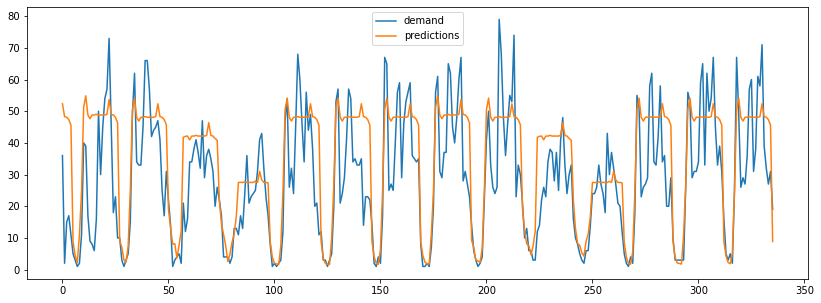

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,195.38487,10.541995,13.978014,0.392101


In [332]:
#Create and train forecaster
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123, max_depth = 10, n_estimators = 100),
                              lags = [168])
forecaster.fit(y=train['rides'], exog = train[columns_for_model])

#Predictions and demand
predictions = forecaster.predict(steps=steps, exog = test[columns_for_model])
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_17 = evaluation_model_17.append({'model':'Random Forest with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_17

##### Catboost

In [333]:
forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True),
                              lags = [24*7,24])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [02:15<00:00, 67.51s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 10, 'n_estimators': 500}
  Backtesting metric: 199.60877151384162



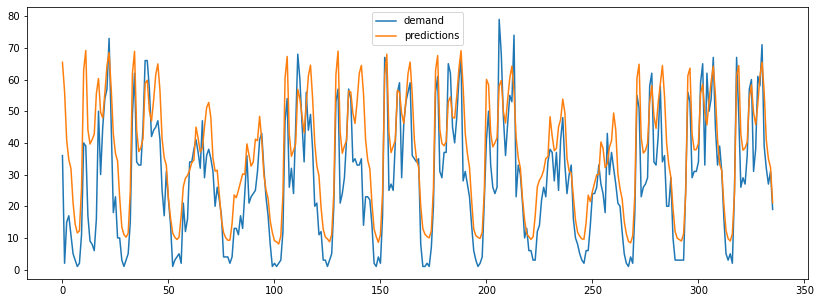

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,195.384870,10.541995,13.978014,0.392101
1,CatBoost,150.935665,9.864490,12.285588,0.509924


In [334]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_17['rides'],
    exog = rides_per_zone_17[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_17 = evaluation_model_17.append({'model':'CatBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_17

##### XGBoost

In [335]:
forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123),
                lags = 24*7
             )
#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.5),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|██████████████████████████████████████| 2/2 [06:03<00:00, 181.85s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 500}
  Backtesting metric: 250.0775173272237



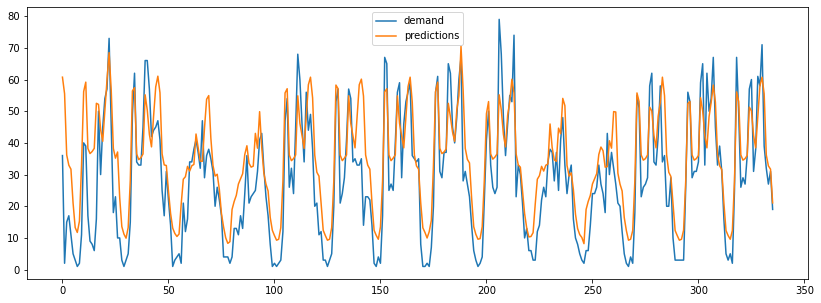

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,195.384870,10.541995,13.978014,0.392101
1,CatBoost,150.935665,9.864490,12.285588,0.509924
2,XGBoost,132.855028,9.245854,11.526276,0.424470


In [336]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y = rides_per_zone_17['rides'],
    exog = rides_per_zone_17[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_17 = evaluation_model_17.append({'model':'XGBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_17

##### Light GBM

In [337]:
forecaster = ForecasterAutoreg(regressor = LGBMRegressor(random_state=123),
                              lags=[24,24*7])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:30<00:00, 15.10s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
  Backtesting metric: 202.88566892345276



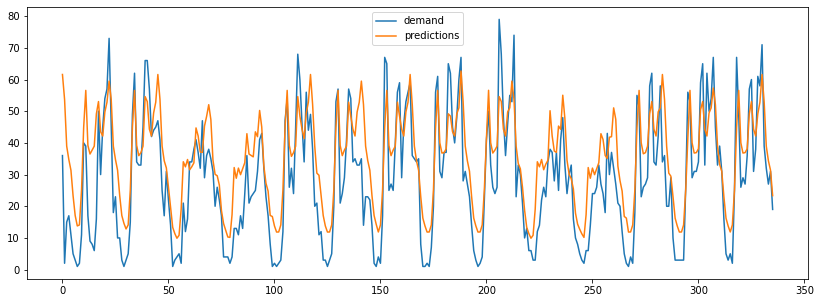

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,195.384870,10.541995,13.978014,0.392101
1,CatBoost,150.935665,9.864490,12.285588,0.509924
2,XGBoost,132.855028,9.245854,11.526276,0.424470
3,LightGBM,149.670875,10.224207,12.234005,0.245658


In [338]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_17['rides'],
    exog = rides_per_zone_17[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)

predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_17 = evaluation_model_17.append({'model':'LightGBM', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_17

##### Choosing the best model

The best model is the XGBoost

In [339]:
#creating and training the forecaster

forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123, learning_rate = 0.01, 
                                                         max_depth = 5, n_estimators= 500),
                              lags=[24*7])

forecaster.fit(y=rides_per_zone_17['rides'], exog = rides_per_zone_17[columns_for_model])

#Obtaining exogenous variables for the model
last_day_data = rides_per_zone_17[-1:]
last_day_data = last_day_data.index[0]

exogenous_variables = pd.date_range(last_day_data, periods = 365*24,freq='H')
exogenous_variables = pd.DataFrame(exogenous_variables, columns = ['datetime'])
exogenous_variables = exogenous_variables[1:]
exogenous_variables['hour'] = exogenous_variables['datetime'].dt.hour
exogenous_variables['month'] = exogenous_variables['datetime'].dt.month
exogenous_variables['weekday'] = exogenous_variables['datetime'].dt.day_name()
exogenous_variables.reset_index(inplace=True)
exogenous_variables = pd.get_dummies(exogenous_variables, columns = ['weekday', 'hour', 'month'])
exogenous_variables = exogenous_variables[:steps]

#Obtaining the predictions and save them in the csv
predictions = forecaster.predict(steps=steps,
                                exog = exogenous_variables[columns_for_model])
predictions = predictions.reset_index()

predictions_zone_17 = pd.concat([predictions, exogenous_variables], axis = 1)
predictions_zone_17 = predictions_zone_17[['pred', 'datetime']]
predictions_zone_17['hour'] = predictions_zone_17['datetime'].dt.hour
predictions_zone_17['day'] = predictions_zone_17['datetime'].dt.date
predictions_zone_17['model'] = 'XGBoost'
predictions_zone_17['postal_code'] = '28009'

predictions_per_zone = predictions_per_zone.append(predictions_zone_17)
predictions_per_zone.to_csv("predictions_per_zone.csv")

### 4.1.18.  Demand prediction for zone: 28007

In [345]:
#Creating the dataframe
rides_per_zone_18 = rides_per_station[rides_per_station['postal_code']==28007]
rides_per_zone_18 = rides_per_zone_18.groupby(['date', 'weekday', 'hour', 'month',
                                             'year', 'time','datetime']).rides.sum().reset_index()
#Converting the column datetime to a datetime format
rides_per_zone_18['datetime'] = pd.to_datetime(rides_per_zone_18['datetime'])
#Resample to fill all values of the time series
rides_per_zone_18.set_index('datetime',inplace=True)
rides_per_zone_18.sort_index(inplace=True)
rides_per_zone_18.resample('1H').sum()

#Adding lag values
rides_per_zone_18['rides_lag_7'] = rides_per_zone_18['rides'].shift(7*24)
rides_per_zone_18['rides_lag_1'] = rides_per_zone_18['rides'].shift(1*24)
rides_per_zone_18['rides_lag_2'] = rides_per_zone_18['rides'].shift(2*24)
rides_per_zone_18['rides_lag_1_month'] = rides_per_zone_18['rides'].shift(30*24)
rides_per_zone_18['rides_lag_12_hours'] = rides_per_zone_18['rides'].shift(12)

#One hot encoding
rides_per_zone_18 = pd.get_dummies(rides_per_zone_18, columns = ['weekday', 'hour', 'month'])
#We save the columns we are using as predictors in columns for model and the target we want to predict in target
columns_for_model = [column for column in rides_per_zone_16.columns
                      if column.startswith(('weekday', 'hour', 'month'))]

target = 'rides'
#Division in train and test
steps = 24*14 # 14 days
train = rides_per_zone_18[:-steps]
test = rides_per_zone_18[-steps:]

#Dataframe to evaluate models
evaluation_model_18 = pd.DataFrame(columns=["model", "MSE", "MAE", "RMSE", "R2"])

##### Random Forest

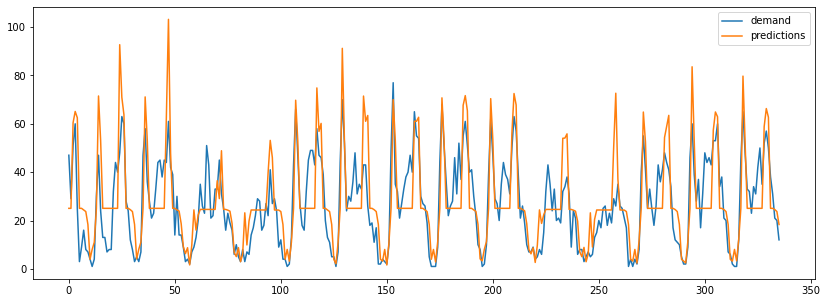

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,149.472203,9.324816,12.225882,0.570074


In [346]:
#Create and train forecaster
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123, max_depth = 10, n_estimators = 100),
                              lags = [168])
forecaster.fit(y=train['rides'], exog = train[columns_for_model])

#Predictions and demand
predictions = forecaster.predict(steps=steps, exog = test[columns_for_model])
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_18 = evaluation_model_18.append({'model':'Random Forest with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_18

##### Cat Boost

In [348]:
forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True),
                              lags = [24*7,24])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [02:27<00:00, 73.63s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 10, 'n_estimators': 500}
  Backtesting metric: 169.25796277491952



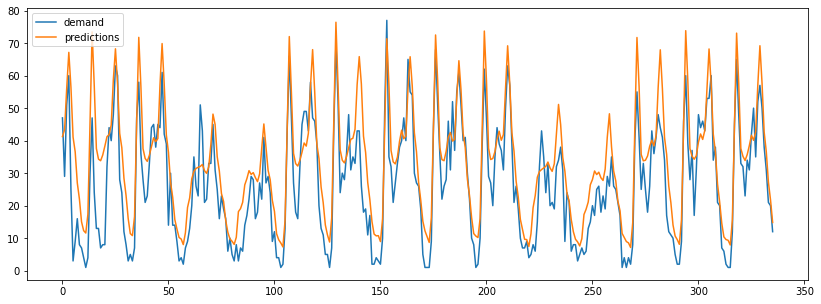

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,149.472203,9.324816,12.225882,0.570074
1,CatBoost,110.845775,8.377318,10.528332,0.601994


In [349]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_18['rides'],
    exog = rides_per_zone_18[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_18 = evaluation_model_18.append({'model':'CatBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_18

##### XGBoost

In [350]:
forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123),
                lags = 24*7
             )
#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.5),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|██████████████████████████████████████| 2/2 [07:26<00:00, 223.14s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
  Backtesting metric: 215.9426906563886



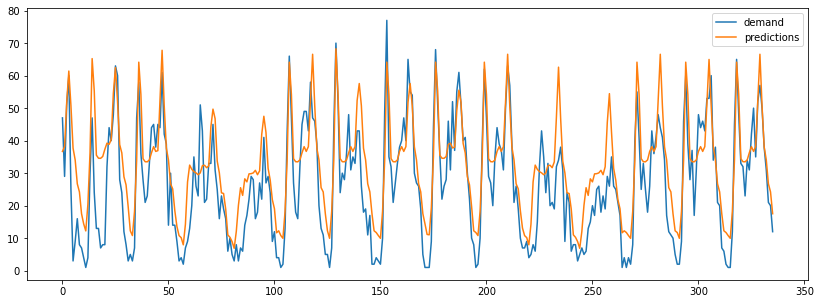

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,149.472203,9.324816,12.225882,0.570074
1,CatBoost,110.845775,8.377318,10.528332,0.601994
2,XGBoost,115.968523,8.742545,10.768868,0.440723


In [351]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y = rides_per_zone_18['rides'],
    exog = rides_per_zone_18[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_18 = evaluation_model_18.append({'model':'XGBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_18

##### Light GBM

In [352]:
forecaster = ForecasterAutoreg(regressor = LGBMRegressor(random_state=123),
                              lags=[24,24*7])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:29<00:00, 14.79s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
  Backtesting metric: 169.8996853288146



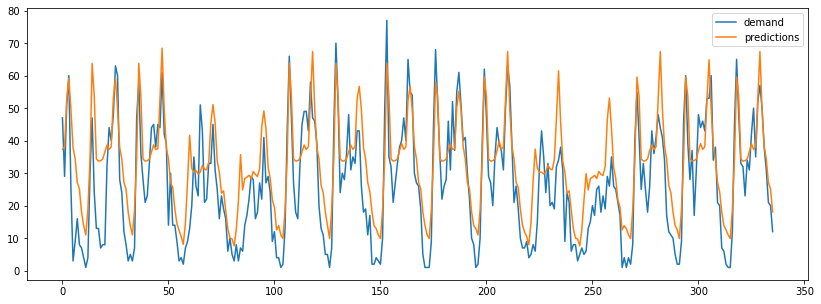

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,149.472203,9.324816,12.225882,0.570074
1,CatBoost,110.845775,8.377318,10.528332,0.601994
2,XGBoost,115.968523,8.742545,10.768868,0.440723
3,LightGBM,120.782820,8.961907,10.990124,0.380513


In [353]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_18['rides'],
    exog = rides_per_zone_18[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)

predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_18 = evaluation_model_18.append({'model':'LightGBM', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_18

##### Choosing the best model

The best model is the CatBoost

In [365]:
#creating and training the forecaster

forecaster = ForecasterAutoreg(
                regressor = CatBoostRegressor(random_state=123, silent=True, learning_rate = 0.01, 
                                                         max_depth = 10, n_estimators= 500),
                              lags=[24*7])

forecaster.fit(y=rides_per_zone_18['rides'], exog = rides_per_zone_18[columns_for_model])

#Obtaining exogenous variables for the model
last_day_data = rides_per_zone_17[-1:]
last_day_data = last_day_data.index[0]

exogenous_variables = pd.date_range(last_day_data, periods = 365*24,freq='H')
exogenous_variables = pd.DataFrame(exogenous_variables, columns = ['datetime'])
exogenous_variables = exogenous_variables[1:]
exogenous_variables['hour'] = exogenous_variables['datetime'].dt.hour
exogenous_variables['month'] = exogenous_variables['datetime'].dt.month
exogenous_variables['weekday'] = exogenous_variables['datetime'].dt.day_name()
exogenous_variables.reset_index(inplace=True)
exogenous_variables = pd.get_dummies(exogenous_variables, columns = ['weekday', 'hour', 'month'])
exogenous_variables = exogenous_variables[:steps]

#Obtaining the predictions and save them in the csv
predictions = forecaster.predict(steps=steps,
                                exog = exogenous_variables[columns_for_model])
predictions = predictions.reset_index()

predictions_zone_18 = pd.concat([predictions, exogenous_variables], axis = 1)
predictions_zone_18 = predictions_zone_18[['pred', 'datetime']]
predictions_zone_18['hour'] = predictions_zone_18['datetime'].dt.hour
predictions_zone_18['day'] = predictions_zone_18['datetime'].dt.date
predictions_zone_18['model'] = 'CatBoost'
predictions_zone_18['postal_code'] = '28007'

predictions_per_zone = predictions_per_zone.append(predictions_zone_18)
predictions_per_zone.to_csv("predictions_per_zone.csv")

### 4.1.19. Demand prediction per zone: 28006

In [356]:
#Creating the dataframe
rides_per_zone_19 = rides_per_station[rides_per_station['postal_code']==28006]
rides_per_zone_19 = rides_per_zone_19.groupby(['date', 'weekday', 'hour', 'month',
                                             'year', 'time','datetime']).rides.sum().reset_index()
#Converting the column datetime to a datetime format
rides_per_zone_19['datetime'] = pd.to_datetime(rides_per_zone_19['datetime'])
#Resample to fill all values of the time series
rides_per_zone_19.set_index('datetime',inplace=True)
rides_per_zone_19.sort_index(inplace=True)
rides_per_zone_19.resample('1H').sum()

#Adding lag values
rides_per_zone_19['rides_lag_7'] = rides_per_zone_19['rides'].shift(7*24)
rides_per_zone_19['rides_lag_1'] = rides_per_zone_19['rides'].shift(1*24)
rides_per_zone_19['rides_lag_2'] = rides_per_zone_19['rides'].shift(2*24)
rides_per_zone_19['rides_lag_1_month'] = rides_per_zone_19['rides'].shift(30*24)
rides_per_zone_19['rides_lag_12_hours'] = rides_per_zone_19['rides'].shift(12)

#One hot encoding
rides_per_zone_19 = pd.get_dummies(rides_per_zone_19, columns = ['weekday', 'hour', 'month'])
#We save the columns we are using as predictors in columns for model and the target we want to predict in target
columns_for_model = [column for column in rides_per_zone_16.columns
                      if column.startswith(('weekday', 'hour', 'month'))]

target = 'rides'
#Division in train and test
steps = 24*14 # 14 days
train = rides_per_zone_19[:-steps]
test = rides_per_zone_19[-steps:]

#Dataframe to evaluate models
evaluation_model_19 = pd.DataFrame(columns=["model", "MSE", "MAE", "RMSE", "R2"])

##### Random Forest

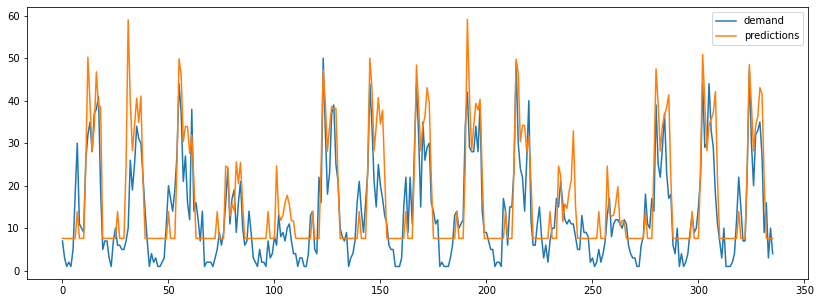

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,60.083548,5.867453,7.751358,0.64805


In [357]:
#Create and train forecaster
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123, max_depth = 10, n_estimators = 100),
                              lags = [168])
forecaster.fit(y=train['rides'], exog = train[columns_for_model])

#Predictions and demand
predictions = forecaster.predict(steps=steps, exog = test[columns_for_model])
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_19 = evaluation_model_19.append({'model':'Random Forest with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_19

##### CatBoost

In [358]:
forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True),
                              lags = [24*7,24])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [01:51<00:00, 55.93s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 10, 'n_estimators': 500}
  Backtesting metric: 70.51129702724583



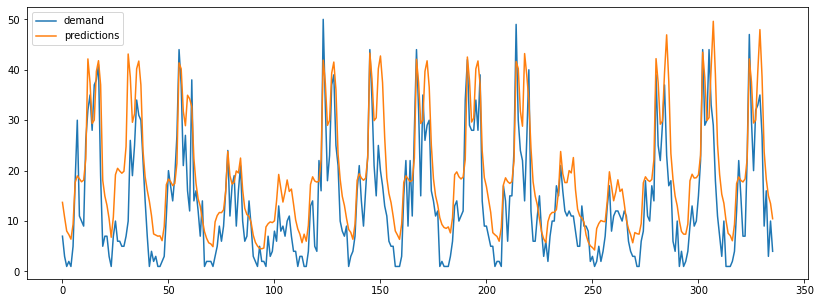

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,60.083548,5.867453,7.751358,0.648050
1,CatBoost,65.358368,6.543750,8.084452,0.472238


In [359]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_19['rides'],
    exog = rides_per_zone_19[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_19 = evaluation_model_19.append({'model':'CatBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_19

##### XGBoost

In [360]:
forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123),
                lags = 24*7
             )
#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.5),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|██████████████████████████████████████| 2/2 [06:56<00:00, 208.05s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 10, 'n_estimators': 100}
  Backtesting metric: 84.23696806884499



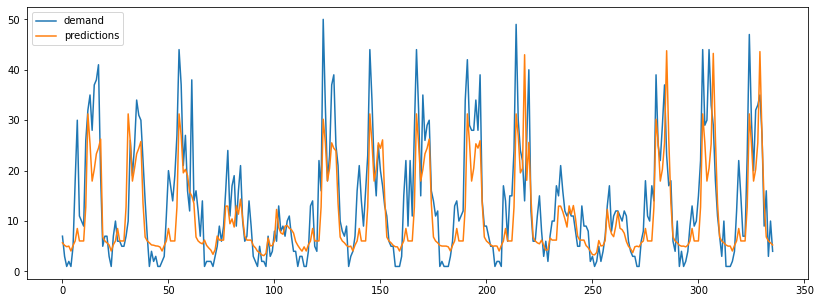

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,60.083548,5.867453,7.751358,0.648050
1,CatBoost,65.358368,6.543750,8.084452,0.472238
2,XGBoost,49.088702,5.088227,7.006333,0.313467


In [361]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y = rides_per_zone_19['rides'],
    exog = rides_per_zone_19[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_19 = evaluation_model_19.append({'model':'XGBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_19

##### Light GBM

In [362]:
forecaster = ForecasterAutoreg(regressor = LGBMRegressor(random_state=123),
                              lags=[24,24*7])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:30<00:00, 15.07s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 10, 'n_estimators': 100}
  Backtesting metric: 68.63446539002373



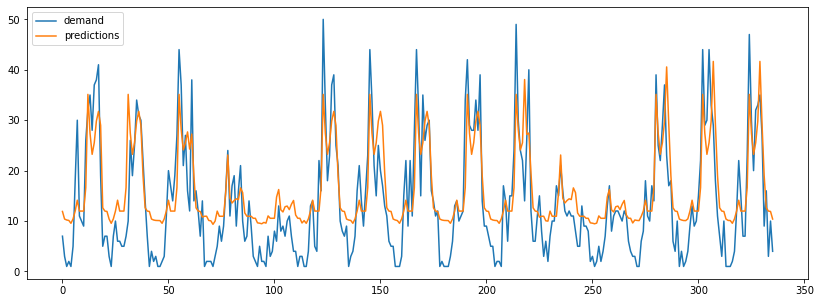

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,60.083548,5.867453,7.751358,0.648050
1,CatBoost,65.358368,6.543750,8.084452,0.472238
2,XGBoost,49.088702,5.088227,7.006333,0.313467
3,LightGBM,45.678896,5.651168,6.758616,0.236763


In [363]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_19['rides'],
    exog = rides_per_zone_19[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)

predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_19 = evaluation_model_19.append({'model':'LightGBM', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_19

##### Choosing the best model

Despite the Light GBM model has lower MSE, we are going to choose the XGBoost model, since it has lower MAE and the plot is more accurate

In [364]:
#creating and training the forecaster

forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123, learning_rate = 0.01, 
                                                         max_depth = 10, n_estimators= 100),
                              lags=[24*7])

forecaster.fit(y=rides_per_zone_19['rides'], exog = rides_per_zone_19[columns_for_model])

#Obtaining exogenous variables for the model
last_day_data = rides_per_zone_19[-1:]
last_day_data = last_day_data.index[0]

exogenous_variables = pd.date_range(last_day_data, periods = 365*24,freq='H')
exogenous_variables = pd.DataFrame(exogenous_variables, columns = ['datetime'])
exogenous_variables = exogenous_variables[1:]
exogenous_variables['hour'] = exogenous_variables['datetime'].dt.hour
exogenous_variables['month'] = exogenous_variables['datetime'].dt.month
exogenous_variables['weekday'] = exogenous_variables['datetime'].dt.day_name()
exogenous_variables.reset_index(inplace=True)
exogenous_variables = pd.get_dummies(exogenous_variables, columns = ['weekday', 'hour', 'month'])
exogenous_variables = exogenous_variables[:steps]

#Obtaining the predictions and save them in the csv
predictions = forecaster.predict(steps=steps,
                                exog = exogenous_variables[columns_for_model])
predictions = predictions.reset_index()

predictions_zone_19 = pd.concat([predictions, exogenous_variables], axis = 1)
predictions_zone_19 = predictions_zone_19[['pred', 'datetime']]
predictions_zone_19['hour'] = predictions_zone_19['datetime'].dt.hour
predictions_zone_19['day'] = predictions_zone_19['datetime'].dt.date
predictions_zone_19['model'] = 'XGBoost'
predictions_zone_19['postal_code'] = '28006'

predictions_per_zone = predictions_per_zone.append(predictions_zone_19)
predictions_per_zone.to_csv("predictions_per_zone.csv")

### 4.1.20. Demand prediction per zone: 28028

In [366]:
rides_per_station['postal_code'].unique()

array([28014, 28004, '28001_2', '28001_8', 28005, 28015, '28001_7', 28013,
       28012, 28009, 28007, 28006, '28001_3', 28028, 28046, 28008, 28045,
       '28001_0', 28020, '28001_5', 28003, 28010, 28016, '28001_1',
       '28001_4', 28027, 28002, 28039, '28001_9', 28026, 28029, 28030,
       28011, 28038, 28019, 28053, 28017, '28001_6'], dtype=object)

In [367]:
#Creating the dataframe
rides_per_zone_20 = rides_per_station[rides_per_station['postal_code']==28028]
rides_per_zone_20 = rides_per_zone_20.groupby(['date', 'weekday', 'hour', 'month',
                                             'year', 'time','datetime']).rides.sum().reset_index()
#Converting the column datetime to a datetime format
rides_per_zone_20['datetime'] = pd.to_datetime(rides_per_zone_20['datetime'])
#Resample to fill all values of the time series
rides_per_zone_20.set_index('datetime',inplace=True)
rides_per_zone_20.sort_index(inplace=True)
rides_per_zone_20.resample('1H').sum()

#Adding lag values
rides_per_zone_20['rides_lag_7'] = rides_per_zone_20['rides'].shift(7*24)
rides_per_zone_20['rides_lag_1'] = rides_per_zone_20['rides'].shift(1*24)
rides_per_zone_20['rides_lag_2'] = rides_per_zone_20['rides'].shift(2*24)
rides_per_zone_20['rides_lag_1_month'] = rides_per_zone_20['rides'].shift(30*24)
rides_per_zone_20['rides_lag_12_hours'] = rides_per_zone_20['rides'].shift(12)

#One hot encoding
rides_per_zone_20 = pd.get_dummies(rides_per_zone_20, columns = ['weekday', 'hour', 'month'])
#We save the columns we are using as predictors in columns for model and the target we want to predict in target
columns_for_model = [column for column in rides_per_zone_20.columns
                      if column.startswith(('weekday', 'hour', 'month'))]

target = 'rides'
#Division in train and test
steps = 24*14 # 14 days
train = rides_per_zone_20[:-steps]
test = rides_per_zone_20[-steps:]

#Dataframe to evaluate models
evaluation_model_20 = pd.DataFrame(columns=["model", "MSE", "MAE", "RMSE", "R2"])

##### Random Forest

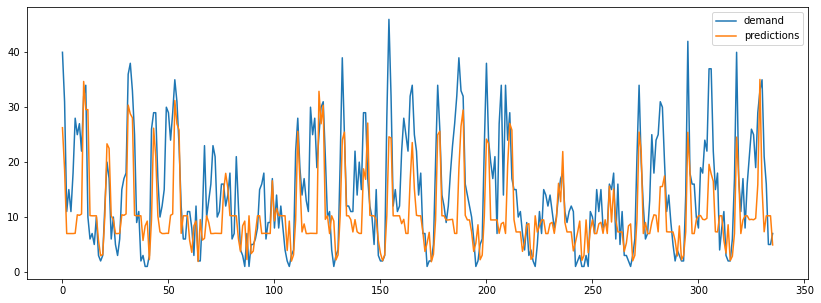

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,72.158753,6.350781,8.494631,-0.613515


In [368]:
#Create and train forecaster
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123, max_depth = 10, n_estimators = 100),
                              lags = [168])
forecaster.fit(y=train['rides'], exog = train[columns_for_model])

#Predictions and demand
predictions = forecaster.predict(steps=steps, exog = test[columns_for_model])
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_20 = evaluation_model_20.append({'model':'Random Forest with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_20

##### CatBoost

In [369]:
forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True),
                              lags = [24*7,24])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [01:44<00:00, 52.34s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 24 168] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 10, 'n_estimators': 500}
  Backtesting metric: 81.67600959589545



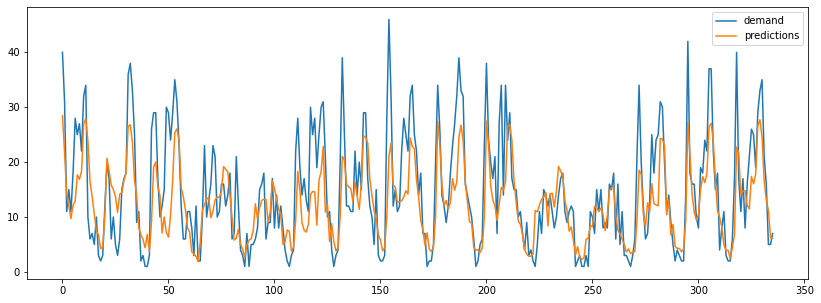

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,72.158753,6.350781,8.494631,-0.613515
1,CatBoost,44.769708,4.994849,6.691017,-0.066393


In [370]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_20['rides'],
    exog = rides_per_zone_20[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_20 = evaluation_model_20.append({'model':'CatBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_20

##### XGBoost

In [371]:
forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123),
                lags = 24*7
             )
#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.5),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|██████████████████████████████████████| 2/2 [06:00<00:00, 180.35s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 24 168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}
  Backtesting metric: 88.86673255384794



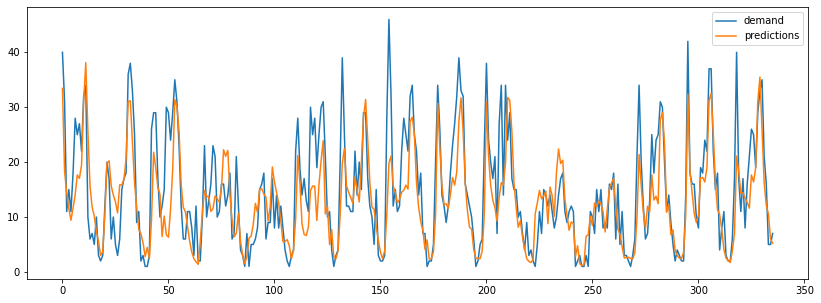

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,72.158753,6.350781,8.494631,-0.613515
1,CatBoost,44.769708,4.994849,6.691017,-0.066393
2,XGBoost,39.702014,4.608880,6.300953,0.330491


In [372]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y = rides_per_zone_20['rides'],
    exog = rides_per_zone_20[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_20 = evaluation_model_20.append({'model':'XGBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_20

##### Light GBM

In [373]:
forecaster = ForecasterAutoreg(regressor = LGBMRegressor(random_state=123),
                              lags=[24,24*7])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:24<00:00, 12.06s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 24 168] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 10, 'n_estimators': 500}
  Backtesting metric: 79.92180723403146



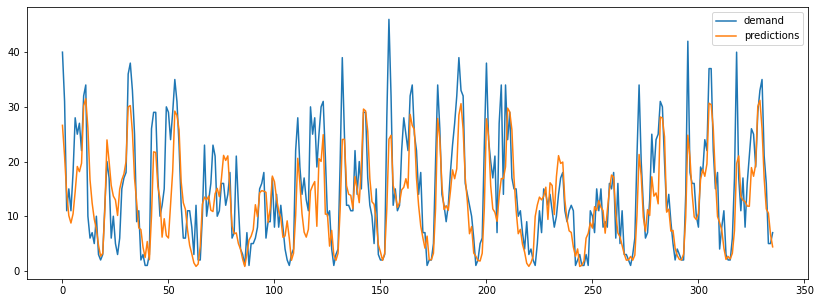

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,72.158753,6.350781,8.494631,-0.613515
1,CatBoost,44.769708,4.994849,6.691017,-0.066393
2,XGBoost,39.702014,4.608880,6.300953,0.330491
3,LightGBM,39.566936,4.680048,6.290225,0.329896


In [374]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_20['rides'],
    exog = rides_per_zone_20[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)

predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_20 = evaluation_model_20.append({'model':'LightGBM', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_20

##### Choosing the best model

The best model is the Light GBM 

In [375]:
#creating and training the forecaster

forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123, learning_rate = 0.01, 
                                                         max_depth = 10, n_estimators= 100),
                              lags=[24*7])

forecaster.fit(y=rides_per_zone_20['rides'], exog = rides_per_zone_20[columns_for_model])

#Obtaining exogenous variables for the model
last_day_data = rides_per_zone_20[-1:]
last_day_data = last_day_data.index[0]

exogenous_variables = pd.date_range(last_day_data, periods = 365*24,freq='H')
exogenous_variables = pd.DataFrame(exogenous_variables, columns = ['datetime'])
exogenous_variables = exogenous_variables[1:]
exogenous_variables['hour'] = exogenous_variables['datetime'].dt.hour
exogenous_variables['month'] = exogenous_variables['datetime'].dt.month
exogenous_variables['weekday'] = exogenous_variables['datetime'].dt.day_name()
exogenous_variables.reset_index(inplace=True)
exogenous_variables = pd.get_dummies(exogenous_variables, columns = ['weekday', 'hour', 'month'])
exogenous_variables = exogenous_variables[:steps]

#Obtaining the predictions and save them in the csv
predictions = forecaster.predict(steps=steps,
                                exog = exogenous_variables[columns_for_model])
predictions = predictions.reset_index()

predictions_zone_20 = pd.concat([predictions, exogenous_variables], axis = 1)
predictions_zone_20 = predictions_zone_20[['pred', 'datetime']]
predictions_zone_20['hour'] = predictions_zone_20['datetime'].dt.hour
predictions_zone_20['day'] = predictions_zone_20['datetime'].dt.date
predictions_zone_20['model'] = 'Light GBM'
predictions_zone_20['postal_code'] = '28028'

predictions_per_zone = predictions_per_zone.append(predictions_zone_20)
predictions_per_zone.to_csv("predictions_per_zone.csv")

### 4.1.21. Demand prediction per zone: 28046

In [377]:
#Creating the dataframe
rides_per_zone_21 = rides_per_station[rides_per_station['postal_code']==28046]
rides_per_zone_21 = rides_per_zone_21.groupby(['date', 'weekday', 'hour', 'month',
                                             'year', 'time','datetime']).rides.sum().reset_index()
#Converting the column datetime to a datetime format
rides_per_zone_21['datetime'] = pd.to_datetime(rides_per_zone_21['datetime'])
#Resample to fill all values of the time series
rides_per_zone_21.set_index('datetime',inplace=True)
rides_per_zone_21.sort_index(inplace=True)
rides_per_zone_21.resample('1H').sum()

#Adding lag values
rides_per_zone_21['rides_lag_7'] = rides_per_zone_21['rides'].shift(7*24)
rides_per_zone_21['rides_lag_1'] = rides_per_zone_21['rides'].shift(1*24)
rides_per_zone_21['rides_lag_2'] = rides_per_zone_21['rides'].shift(2*24)
rides_per_zone_21['rides_lag_1_month'] = rides_per_zone_21['rides'].shift(30*24)
rides_per_zone_21['rides_lag_12_hours'] = rides_per_zone_21['rides'].shift(12)

#One hot encoding
rides_per_zone_21 = pd.get_dummies(rides_per_zone_21, columns = ['weekday', 'hour', 'month'])
#We save the columns we are using as predictors in columns for model and the target we want to predict in target
columns_for_model = [column for column in rides_per_zone_21.columns
                      if column.startswith(('weekday', 'hour', 'month'))]

target = 'rides'
#Division in train and test
steps = 24*14 # 14 days
train = rides_per_zone_21[:-steps]
test = rides_per_zone_21[-steps:]

#Dataframe to evaluate models
evaluation_model_21 = pd.DataFrame(columns=["model", "MSE", "MAE", "RMSE", "R2"])

##### Random Forest

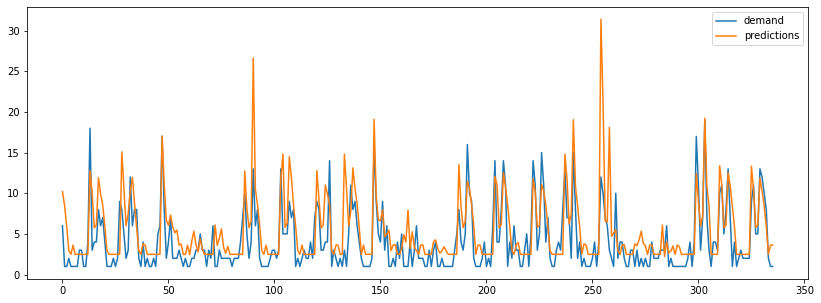

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,10.368965,2.275251,3.220088,0.40502


In [378]:
#Create and train forecaster
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123, max_depth = 10, n_estimators = 100),
                              lags = [168])
forecaster.fit(y=train['rides'], exog = train[columns_for_model])

#Predictions and demand
predictions = forecaster.predict(steps=steps, exog = test[columns_for_model])
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_21 = evaluation_model_21.append({'model':'Random Forest with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_21

##### Catboost

In [379]:
forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True),
                              lags = [24*7,24])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [01:21<00:00, 40.80s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 24 168] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 10, 'n_estimators': 100}
  Backtesting metric: 6.986469184944531



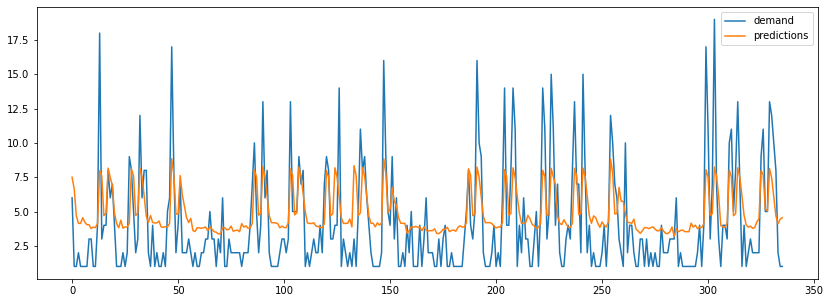

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,10.368965,2.275251,3.220088,0.405020
1,CatBoost,8.171209,2.336698,2.858533,-2.474325


In [380]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_21['rides'],
    exog = rides_per_zone_21[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_21 = evaluation_model_21.append({'model':'CatBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_21

##### XGBoost

In [381]:
forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123),
                lags = 24*7
             )
#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.5),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|██████████████████████████████████████| 2/2 [05:04<00:00, 152.06s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 10, 'n_estimators': 100}
  Backtesting metric: 7.786835517543779



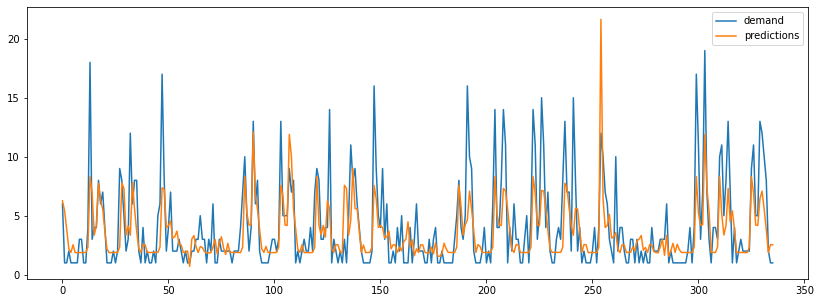

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,10.368965,2.275251,3.220088,0.405020
1,CatBoost,8.171209,2.336698,2.858533,-2.474325
2,XGBoost,7.259612,1.805673,2.694367,-0.388781


In [383]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y = rides_per_zone_21['rides'],
    exog = rides_per_zone_21[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_21 = evaluation_model_21.append({'model':'XGBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_21

##### Light GBM

In [384]:
forecaster = ForecasterAutoreg(regressor = LGBMRegressor(random_state=123),
                              lags=[24,24*7])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:20<00:00, 10.04s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 24 168] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 7.058394520435099



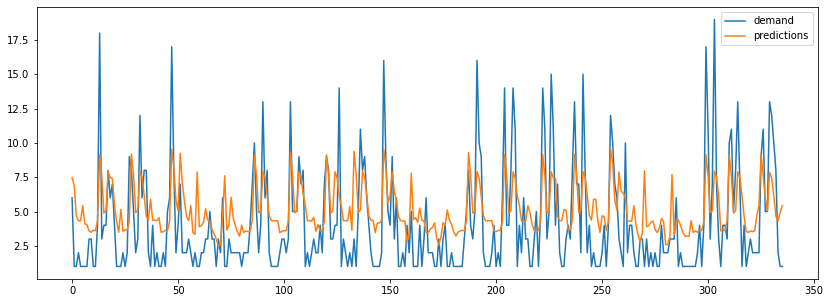

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,10.368965,2.275251,3.220088,0.405020
1,CatBoost,8.171209,2.336698,2.858533,-2.474325
2,XGBoost,7.259612,1.805673,2.694367,-0.388781
3,LightGBM,8.938679,2.453899,2.989762,-2.005852


In [385]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_21['rides'],
    exog = rides_per_zone_21[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)

predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_21 = evaluation_model_21.append({'model':'LightGBM', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_21

##### Choosing the best model

The best model is the XGBoost

In [386]:
#creating and training the forecaster

forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123, learning_rate = 0.01, 
                                                         max_depth = 10, n_estimators= 100),
                              lags=[24*7])

forecaster.fit(y=rides_per_zone_21['rides'], exog = rides_per_zone_21[columns_for_model])

#Obtaining exogenous variables for the model
last_day_data = rides_per_zone_21[-1:]
last_day_data = last_day_data.index[0]

exogenous_variables = pd.date_range(last_day_data, periods = 365*24,freq='H')
exogenous_variables = pd.DataFrame(exogenous_variables, columns = ['datetime'])
exogenous_variables = exogenous_variables[1:]
exogenous_variables['hour'] = exogenous_variables['datetime'].dt.hour
exogenous_variables['month'] = exogenous_variables['datetime'].dt.month
exogenous_variables['weekday'] = exogenous_variables['datetime'].dt.day_name()
exogenous_variables.reset_index(inplace=True)
exogenous_variables = pd.get_dummies(exogenous_variables, columns = ['weekday', 'hour', 'month'])
exogenous_variables = exogenous_variables[:steps]

#Obtaining the predictions and save them in the csv
predictions = forecaster.predict(steps=steps,
                                exog = exogenous_variables[columns_for_model])
predictions = predictions.reset_index()

predictions_zone_21 = pd.concat([predictions, exogenous_variables], axis = 1)
predictions_zone_21 = predictions_zone_21[['pred', 'datetime']]
predictions_zone_21['hour'] = predictions_zone_21['datetime'].dt.hour
predictions_zone_21['day'] = predictions_zone_21['datetime'].dt.date
predictions_zone_21['model'] = 'XGBoost'
predictions_zone_21['postal_code'] = '28046'

predictions_per_zone = predictions_per_zone.append(predictions_zone_21)
predictions_per_zone.to_csv("predictions_per_zone.csv")

### 4.1.22. Demand prediction per zone: 28008

In [388]:
#Creating the dataframe
rides_per_zone_22 = rides_per_station[rides_per_station['postal_code']==28008]
rides_per_zone_22 = rides_per_zone_22.groupby(['date', 'weekday', 'hour', 'month',
                                             'year', 'time','datetime']).rides.sum().reset_index()
#Converting the column datetime to a datetime format
rides_per_zone_22['datetime'] = pd.to_datetime(rides_per_zone_22['datetime'])
#Resample to fill all values of the time series
rides_per_zone_22.set_index('datetime',inplace=True)
rides_per_zone_22.sort_index(inplace=True)
rides_per_zone_22.resample('1H').sum()

#Adding lag values
rides_per_zone_22['rides_lag_7'] = rides_per_zone_22['rides'].shift(7*24)
rides_per_zone_22['rides_lag_1'] = rides_per_zone_22['rides'].shift(1*24)
rides_per_zone_22['rides_lag_2'] = rides_per_zone_22['rides'].shift(2*24)
rides_per_zone_22['rides_lag_1_month'] = rides_per_zone_22['rides'].shift(30*24)
rides_per_zone_22['rides_lag_12_hours'] = rides_per_zone_22['rides'].shift(12)

#One hot encoding
rides_per_zone_22 = pd.get_dummies(rides_per_zone_22, columns = ['weekday', 'hour', 'month'])
#We save the columns we are using as predictors in columns for model and the target we want to predict in target
columns_for_model = [column for column in rides_per_zone_21.columns
                      if column.startswith(('weekday', 'hour', 'month'))]

target = 'rides'
#Division in train and test
steps = 24*14 # 14 days
train = rides_per_zone_22[:-steps]
test = rides_per_zone_22[-steps:]

#Dataframe to evaluate models
evaluation_model_22 = pd.DataFrame(columns=["model", "MSE", "MAE", "RMSE", "R2"])

##### Random Forest

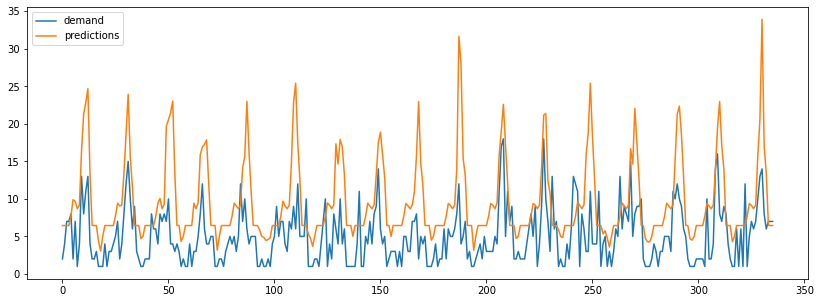

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,39.861228,5.012827,6.313575,-0.407248


In [389]:
#Create and train forecaster
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123, max_depth = 10, n_estimators = 100),
                              lags = [168])
forecaster.fit(y=train['rides'], exog = train[columns_for_model])

#Predictions and demand
predictions = forecaster.predict(steps=steps, exog = test[columns_for_model])
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_22 = evaluation_model_22.append({'model':'Random Forest with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_22

##### Catboost

In [390]:
forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True),
                              lags = [24*7,24])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [01:54<00:00, 57.48s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
  Backtesting metric: 25.33168618130801



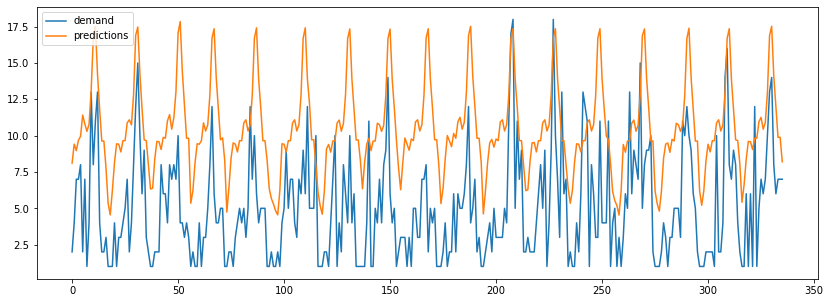

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,39.861228,5.012827,6.313575,-0.407248
1,CatBoost,38.365384,5.600607,6.193980,-3.130668


In [391]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_22['rides'],
    exog = rides_per_zone_22[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_22 = evaluation_model_22.append({'model':'CatBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_22

##### XGBoost

In [392]:
forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123),
                lags = 24*7
             )
#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.5),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|██████████████████████████████████████| 2/2 [06:57<00:00, 208.50s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 32.041796754371546



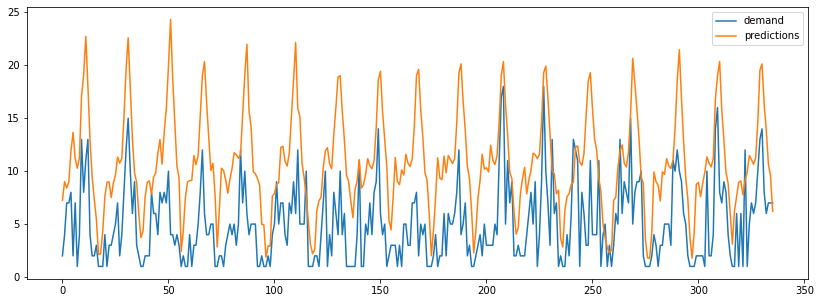

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,39.861228,5.012827,6.313575,-0.407248
1,CatBoost,38.365384,5.600607,6.193980,-3.130668
2,XGBoost,46.411108,5.881700,6.812570,-1.216148


In [393]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y = rides_per_zone_22['rides'],
    exog = rides_per_zone_22[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_22 = evaluation_model_22.append({'model':'XGBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_22

##### Light GBM

In [394]:
forecaster = ForecasterAutoreg(regressor = LGBMRegressor(random_state=123),
                              lags=[24,24*7])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:26<00:00, 13.01s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
  Backtesting metric: 25.761968160832055



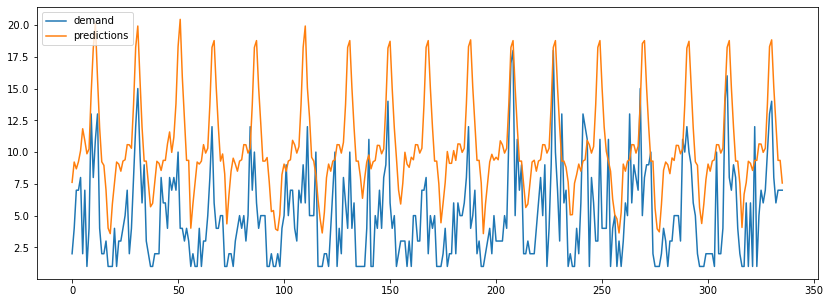

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,39.861228,5.012827,6.313575,-0.407248
1,CatBoost,38.365384,5.600607,6.193980,-3.130668
2,XGBoost,46.411108,5.881700,6.812570,-1.216148
3,LightGBM,39.837519,5.597081,6.311697,-1.911510


In [395]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_22['rides'],
    exog = rides_per_zone_22[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)

predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_22 = evaluation_model_22.append({'model':'LightGBM', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_22

##### Choosing the best model

The best model is the CatBoost. The predictions are worse than other zones, this is because this zone has lower number of stations.

In [396]:
#creating and training the forecaster

forecaster = ForecasterAutoreg(
                regressor = CatBoostRegressor(random_state=123, learning_rate = 0.1, 
                                                         max_depth = 3, n_estimators= 100),
                              lags=[24*7])

forecaster.fit(y=rides_per_zone_22['rides'], exog = rides_per_zone_22[columns_for_model])

#Obtaining exogenous variables for the model
last_day_data = rides_per_zone_22[-1:]
last_day_data = last_day_data.index[0]

exogenous_variables = pd.date_range(last_day_data, periods = 365*24,freq='H')
exogenous_variables = pd.DataFrame(exogenous_variables, columns = ['datetime'])
exogenous_variables = exogenous_variables[1:]
exogenous_variables['hour'] = exogenous_variables['datetime'].dt.hour
exogenous_variables['month'] = exogenous_variables['datetime'].dt.month
exogenous_variables['weekday'] = exogenous_variables['datetime'].dt.day_name()
exogenous_variables.reset_index(inplace=True)
exogenous_variables = pd.get_dummies(exogenous_variables, columns = ['weekday', 'hour', 'month'])
exogenous_variables = exogenous_variables[:steps]

#Obtaining the predictions and save them in the csv
predictions = forecaster.predict(steps=steps,
                                exog = exogenous_variables[columns_for_model])
predictions = predictions.reset_index()

predictions_zone_22 = pd.concat([predictions, exogenous_variables], axis = 1)
predictions_zone_22 = predictions_zone_22[['pred', 'datetime']]
predictions_zone_22['hour'] = predictions_zone_22['datetime'].dt.hour
predictions_zone_22['day'] = predictions_zone_22['datetime'].dt.date
predictions_zone_22['model'] = 'CatBoost'
predictions_zone_22['postal_code'] = '28008'

predictions_per_zone = predictions_per_zone.append(predictions_zone_22)
predictions_per_zone.to_csv("predictions_per_zone.csv")

0:	learn: 6.3026645	total: 1.6ms	remaining: 158ms
1:	learn: 6.2314351	total: 3.15ms	remaining: 154ms
2:	learn: 6.1736958	total: 4.57ms	remaining: 148ms
3:	learn: 6.1228232	total: 6.02ms	remaining: 144ms
4:	learn: 6.0825325	total: 7.49ms	remaining: 142ms
5:	learn: 6.0472425	total: 8.98ms	remaining: 141ms
6:	learn: 6.0162480	total: 10.4ms	remaining: 139ms
7:	learn: 5.9836041	total: 11.9ms	remaining: 137ms
8:	learn: 5.9513018	total: 13.3ms	remaining: 134ms
9:	learn: 5.9238074	total: 14.7ms	remaining: 132ms
10:	learn: 5.8953991	total: 16.2ms	remaining: 131ms
11:	learn: 5.8688680	total: 17.6ms	remaining: 129ms
12:	learn: 5.8429495	total: 19.1ms	remaining: 128ms
13:	learn: 5.8210492	total: 20.6ms	remaining: 127ms
14:	learn: 5.7976986	total: 21.9ms	remaining: 124ms
15:	learn: 5.7755649	total: 23.4ms	remaining: 123ms
16:	learn: 5.7545020	total: 24.6ms	remaining: 120ms
17:	learn: 5.7319317	total: 25.9ms	remaining: 118ms
18:	learn: 5.7125808	total: 27.2ms	remaining: 116ms
19:	learn: 5.6918154	to

### 4.1.23. Demand predictions per zone: 28045

In [397]:
#Creating the dataframe
rides_per_zone_23 = rides_per_station[rides_per_station['postal_code']==28045]
rides_per_zone_23 = rides_per_zone_23.groupby(['date', 'weekday', 'hour', 'month',
                                             'year', 'time','datetime']).rides.sum().reset_index()
#Converting the column datetime to a datetime format
rides_per_zone_23['datetime'] = pd.to_datetime(rides_per_zone_23['datetime'])
#Resample to fill all values of the time series
rides_per_zone_23.set_index('datetime',inplace=True)
rides_per_zone_23.sort_index(inplace=True)
rides_per_zone_23.resample('1H').sum()

#Adding lag values
rides_per_zone_23['rides_lag_7'] = rides_per_zone_23['rides'].shift(7*24)
rides_per_zone_23['rides_lag_1'] = rides_per_zone_23['rides'].shift(1*24)
rides_per_zone_23['rides_lag_2'] = rides_per_zone_23['rides'].shift(2*24)
rides_per_zone_23['rides_lag_1_month'] = rides_per_zone_23['rides'].shift(30*24)
rides_per_zone_23['rides_lag_12_hours'] = rides_per_zone_23['rides'].shift(12)

#One hot encoding
rides_per_zone_23 = pd.get_dummies(rides_per_zone_23, columns = ['weekday', 'hour', 'month'])
#We save the columns we are using as predictors in columns for model and the target we want to predict in target
columns_for_model = [column for column in rides_per_zone_23.columns
                      if column.startswith(('weekday', 'hour', 'month'))]

target = 'rides'
#Division in train and test
steps = 24*14 # 14 days
train = rides_per_zone_23[:-steps]
test = rides_per_zone_23[-steps:]

#Dataframe to evaluate models
evaluation_model_23 = pd.DataFrame(columns=["model", "MSE", "MAE", "RMSE", "R2"])

##### Random Forest 

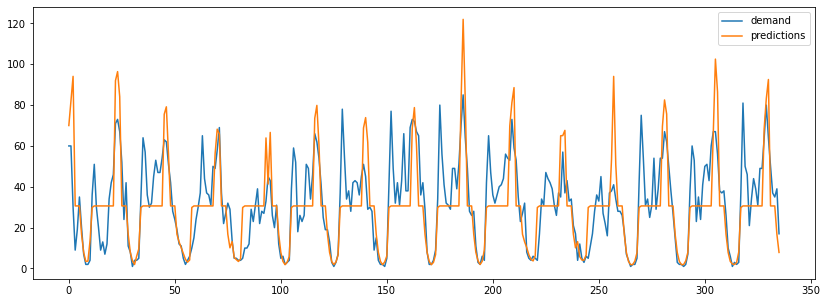

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,228.479339,10.657373,15.115533,0.485758


In [398]:
#Create and train forecaster
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123, max_depth = 10, n_estimators = 100),
                              lags = [168])
forecaster.fit(y=train['rides'], exog = train[columns_for_model])

#Predictions and demand
predictions = forecaster.predict(steps=steps, exog = test[columns_for_model])
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_23 = evaluation_model_23.append({'model':'Random Forest with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_23

##### Catboost

In [399]:
forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True),
                              lags = [24*7,24])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [02:23<00:00, 71.94s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 226.60307421153206



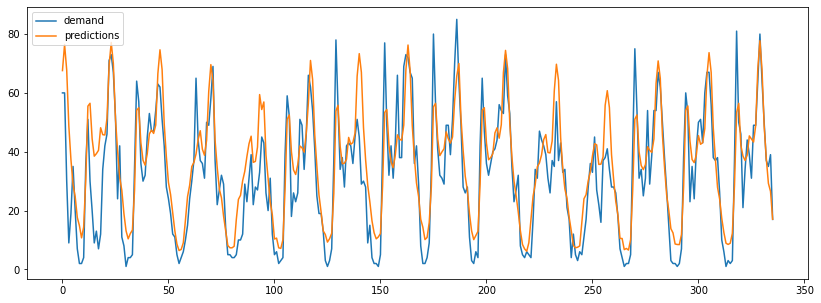

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,228.479339,10.657373,15.115533,0.485758
1,CatBoost,119.420014,8.449784,10.927946,0.642273


In [400]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_23['rides'],
    exog = rides_per_zone_23[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_23 = evaluation_model_23.append({'model':'CatBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_23

##### XGBoost

In [401]:
forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123),
                lags = 24*7
             )
#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.5),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|██████████████████████████████████████| 2/2 [08:16<00:00, 248.29s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}
  Backtesting metric: 234.19349855708757



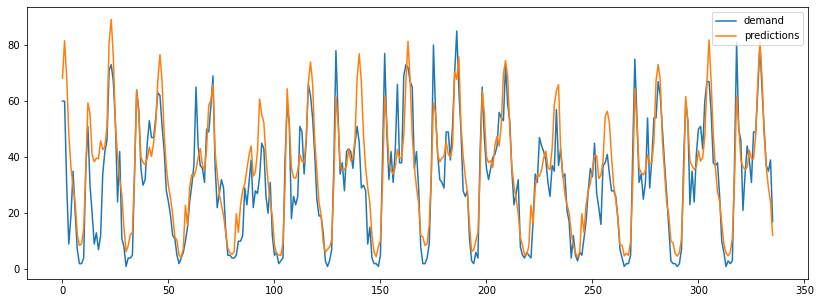

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,228.479339,10.657373,15.115533,0.485758
1,CatBoost,119.420014,8.449784,10.927946,0.642273
2,XGBoost,103.618761,7.456393,10.179330,0.730350


In [402]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y = rides_per_zone_23['rides'],
    exog = rides_per_zone_23[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_23 = evaluation_model_23.append({'model':'XGBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_23

##### Light GBM

In [403]:
forecaster = ForecasterAutoreg(regressor = LGBMRegressor(random_state=123),
                              lags=[24,24*7])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:28<00:00, 14.27s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 10, 'n_estimators': 500}
  Backtesting metric: 230.82906404891045



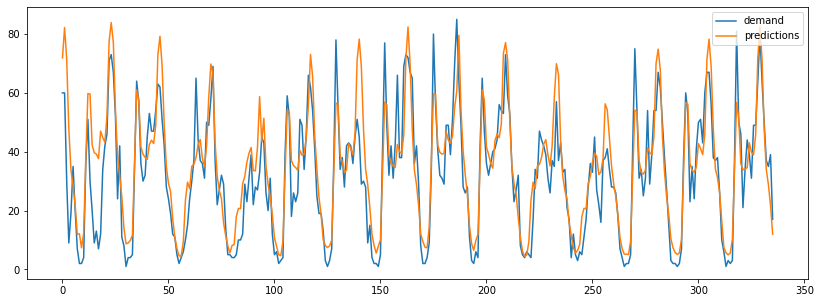

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,228.479339,10.657373,15.115533,0.485758
1,CatBoost,119.420014,8.449784,10.927946,0.642273
2,XGBoost,103.618761,7.456393,10.179330,0.730350
3,LightGBM,111.599894,7.836423,10.564085,0.711319


In [404]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_23['rides'],
    exog = rides_per_zone_23[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)

predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_23 = evaluation_model_23.append({'model':'LightGBM', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_23

##### Choosing the best model

The best model is XGBoost

In [405]:
#creating and training the forecaster

forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123, learning_rate = 0.1, 
                                                         max_depth = 5, n_estimators= 100),
                              lags=[24*7])

forecaster.fit(y=rides_per_zone_23['rides'], exog = rides_per_zone_23[columns_for_model])

#Obtaining exogenous variables for the model
last_day_data = rides_per_zone_23[-1:]
last_day_data = last_day_data.index[0]

exogenous_variables = pd.date_range(last_day_data, periods = 365*24,freq='H')
exogenous_variables = pd.DataFrame(exogenous_variables, columns = ['datetime'])
exogenous_variables = exogenous_variables[1:]
exogenous_variables['hour'] = exogenous_variables['datetime'].dt.hour
exogenous_variables['month'] = exogenous_variables['datetime'].dt.month
exogenous_variables['weekday'] = exogenous_variables['datetime'].dt.day_name()
exogenous_variables.reset_index(inplace=True)
exogenous_variables = pd.get_dummies(exogenous_variables, columns = ['weekday', 'hour', 'month'])
exogenous_variables = exogenous_variables[:steps]

#Obtaining the predictions and save them in the csv
predictions = forecaster.predict(steps=steps,
                                exog = exogenous_variables[columns_for_model])
predictions = predictions.reset_index()

predictions_zone_23 = pd.concat([predictions, exogenous_variables], axis = 1)
predictions_zone_23 = predictions_zone_23[['pred', 'datetime']]
predictions_zone_23['hour'] = predictions_zone_23['datetime'].dt.hour
predictions_zone_23['day'] = predictions_zone_23['datetime'].dt.date
predictions_zone_23['model'] = 'XGBoost'
predictions_zone_23['postal_code'] = '28045'

predictions_per_zone = predictions_per_zone.append(predictions_zone_23)
predictions_per_zone.to_csv("predictions_per_zone.csv")

### 4.1.24. Demand predictions per zone: 28020

In [407]:
#Creating the dataframe
rides_per_zone_24 = rides_per_station[rides_per_station['postal_code']==28020]
rides_per_zone_24 = rides_per_zone_24.groupby(['date', 'weekday', 'hour', 'month',
                                             'year', 'time','datetime']).rides.sum().reset_index()
#Converting the column datetime to a datetime format
rides_per_zone_24['datetime'] = pd.to_datetime(rides_per_zone_24['datetime'])
#Resample to fill all values of the time series
rides_per_zone_24.set_index('datetime',inplace=True)
rides_per_zone_24.sort_index(inplace=True)
rides_per_zone_24.resample('1H').sum()

#Adding lag values
rides_per_zone_24['rides_lag_7'] = rides_per_zone_24['rides'].shift(7*24)
rides_per_zone_24['rides_lag_1'] = rides_per_zone_24['rides'].shift(1*24)
rides_per_zone_24['rides_lag_2'] = rides_per_zone_24['rides'].shift(2*24)
rides_per_zone_24['rides_lag_1_month'] = rides_per_zone_24['rides'].shift(30*24)
rides_per_zone_24['rides_lag_12_hours'] = rides_per_zone_24['rides'].shift(12)

#One hot encoding
rides_per_zone_24 = pd.get_dummies(rides_per_zone_24, columns = ['weekday', 'hour', 'month'])
#We save the columns we are using as predictors in columns for model and the target we want to predict in target
columns_for_model = [column for column in rides_per_zone_24.columns
                      if column.startswith(('weekday', 'hour', 'month'))]

target = 'rides'
#Division in train and test
steps = 24*14 # 14 days
train = rides_per_zone_24[:-steps]
test = rides_per_zone_24[-steps:]

#Dataframe to evaluate models
evaluation_model_24 = pd.DataFrame(columns=["model", "MSE", "MAE", "RMSE", "R2"])

##### Random Forest

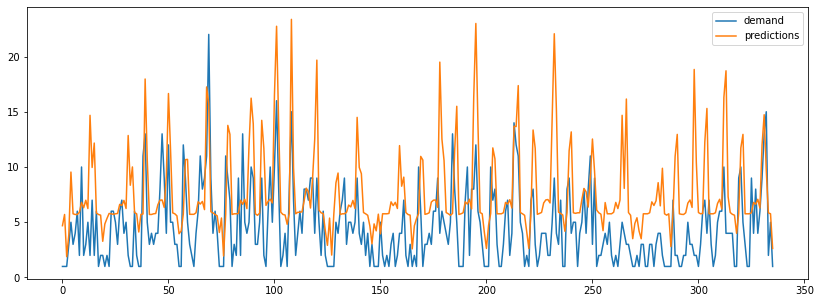

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,21.918014,3.786736,4.681668,-0.572565


In [408]:
#Create and train forecaster
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123, max_depth = 10, n_estimators = 100),
                              lags = [168])
forecaster.fit(y=train['rides'], exog = train[columns_for_model])

#Predictions and demand
predictions = forecaster.predict(steps=steps, exog = test[columns_for_model])
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_24 = evaluation_model_24.append({'model':'Random Forest with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_24

##### CatBoost

In [409]:
forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True),
                              lags = [24*7,24])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [01:35<00:00, 47.67s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 10, 'n_estimators': 100}
  Backtesting metric: 7.229741003901181



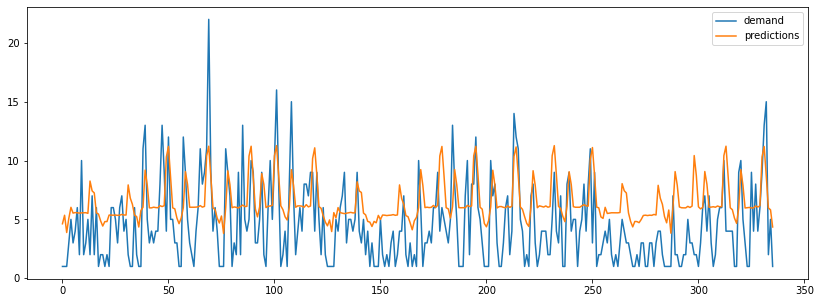

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,21.918014,3.786736,4.681668,-0.572565
1,CatBoost,11.625311,2.899542,3.409591,-3.205069


In [410]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_24['rides'],
    exog = rides_per_zone_24[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_24 = evaluation_model_24.append({'model':'CatBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_24

##### XGBoost

In [411]:
forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123),
                lags = 24*7
             )
#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.5),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|██████████████████████████████████████| 2/2 [05:31<00:00, 165.57s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 10.29155835215585



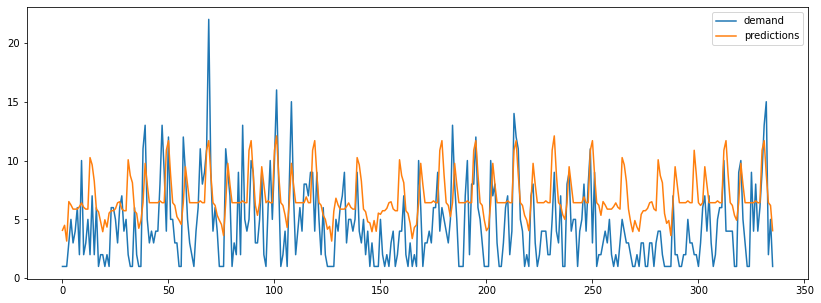

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,21.918014,3.786736,4.681668,-0.572565
1,CatBoost,11.625311,2.899542,3.409591,-3.205069
2,XGBoost,13.324823,3.114259,3.650318,-2.840652


In [412]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y = rides_per_zone_24['rides'],
    exog = rides_per_zone_24[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_24 = evaluation_model_24.append({'model':'XGBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_24

##### Light GBM

In [413]:
forecaster = ForecasterAutoreg(regressor = LGBMRegressor(random_state=123),
                              lags=[24,24*7])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:24<00:00, 12.07s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 24 168] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 10, 'n_estimators': 100}
  Backtesting metric: 7.275338712569412



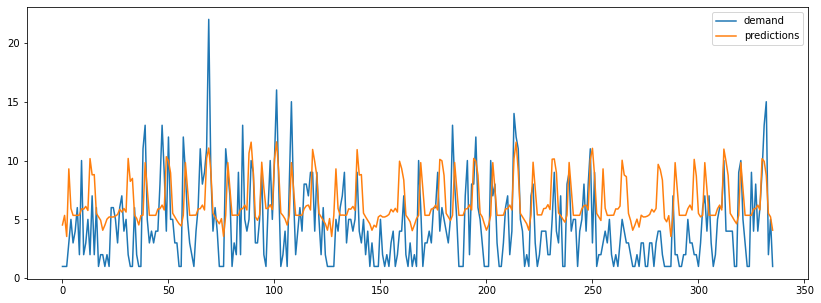

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,21.918014,3.786736,4.681668,-0.572565
1,CatBoost,11.625311,2.899542,3.409591,-3.205069
2,XGBoost,13.324823,3.114259,3.650318,-2.840652
3,LightGBM,12.014151,2.932528,3.466144,-2.405552


In [414]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_24['rides'],
    exog = rides_per_zone_24[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)

predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_24 = evaluation_model_24.append({'model':'LightGBM', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_24

##### Choosing the best model

The model for this zone is worse than other models, despite the error is low, the plots show the high difference between predictions and demand. The model with the best results is the CatBoost

In [415]:
#creating and training the forecaster

forecaster = ForecasterAutoreg(
                regressor = CatBoostRegressor(random_state=123, learning_rate = 0.01, 
                                                         max_depth = 10, n_estimators= 100),
                              lags=[24*7])

forecaster.fit(y=rides_per_zone_24['rides'], exog = rides_per_zone_24[columns_for_model])

#Obtaining exogenous variables for the model
last_day_data = rides_per_zone_24[-1:]
last_day_data = last_day_data.index[0]

exogenous_variables = pd.date_range(last_day_data, periods = 365*24,freq='H')
exogenous_variables = pd.DataFrame(exogenous_variables, columns = ['datetime'])
exogenous_variables = exogenous_variables[1:]
exogenous_variables['hour'] = exogenous_variables['datetime'].dt.hour
exogenous_variables['month'] = exogenous_variables['datetime'].dt.month
exogenous_variables['weekday'] = exogenous_variables['datetime'].dt.day_name()
exogenous_variables.reset_index(inplace=True)
exogenous_variables = pd.get_dummies(exogenous_variables, columns = ['weekday', 'hour', 'month'])
exogenous_variables = exogenous_variables[:steps]

#Obtaining the predictions and save them in the csv
predictions = forecaster.predict(steps=steps,
                                exog = exogenous_variables[columns_for_model])
predictions = predictions.reset_index()

predictions_zone_24 = pd.concat([predictions, exogenous_variables], axis = 1)
predictions_zone_24 = predictions_zone_24[['pred', 'datetime']]
predictions_zone_24['hour'] = predictions_zone_24['datetime'].dt.hour
predictions_zone_24['day'] = predictions_zone_24['datetime'].dt.date
predictions_zone_24['model'] = 'CatBoost'
predictions_zone_24['postal_code'] = '28020'

predictions_per_zone = predictions_per_zone.append(predictions_zone_24)
predictions_per_zone.to_csv("predictions_per_zone.csv")

0:	learn: 3.9036017	total: 4.75ms	remaining: 470ms
1:	learn: 3.8950549	total: 9.26ms	remaining: 454ms
2:	learn: 3.8858589	total: 13.4ms	remaining: 433ms
3:	learn: 3.8768223	total: 17.7ms	remaining: 425ms
4:	learn: 3.8677730	total: 21.8ms	remaining: 413ms
5:	learn: 3.8594641	total: 25.8ms	remaining: 404ms
6:	learn: 3.8508562	total: 29.8ms	remaining: 396ms
7:	learn: 3.8425380	total: 34ms	remaining: 391ms
8:	learn: 3.8341935	total: 38.3ms	remaining: 387ms
9:	learn: 3.8262812	total: 43ms	remaining: 387ms
10:	learn: 3.8184379	total: 47ms	remaining: 380ms
11:	learn: 3.8107303	total: 51ms	remaining: 374ms
12:	learn: 3.8033045	total: 55ms	remaining: 368ms
13:	learn: 3.7956644	total: 59.4ms	remaining: 365ms
14:	learn: 3.7889952	total: 63.5ms	remaining: 360ms
15:	learn: 3.7814955	total: 67.7ms	remaining: 355ms
16:	learn: 3.7742759	total: 72.1ms	remaining: 352ms
17:	learn: 3.7674082	total: 76.5ms	remaining: 348ms
18:	learn: 3.7601229	total: 80.7ms	remaining: 344ms
19:	learn: 3.7535217	total: 84.7

### 4.1.25. Demand predictions per zone: 28003

In [416]:
#Creating the dataframe
rides_per_zone_25 = rides_per_station[rides_per_station['postal_code']==28003]
rides_per_zone_25 = rides_per_zone_25.groupby(['date', 'weekday', 'hour', 'month',
                                             'year', 'time','datetime']).rides.sum().reset_index()
#Converting the column datetime to a datetime format
rides_per_zone_25['datetime'] = pd.to_datetime(rides_per_zone_25['datetime'])
#Resample to fill all values of the time series
rides_per_zone_25.set_index('datetime',inplace=True)
rides_per_zone_25.sort_index(inplace=True)
rides_per_zone_25.resample('1H').sum()

#Adding lag values
rides_per_zone_25['rides_lag_7'] = rides_per_zone_25['rides'].shift(7*24)
rides_per_zone_25['rides_lag_1'] = rides_per_zone_25['rides'].shift(1*24)
rides_per_zone_25['rides_lag_2'] = rides_per_zone_25['rides'].shift(2*24)
rides_per_zone_25['rides_lag_1_month'] = rides_per_zone_25['rides'].shift(30*24)
rides_per_zone_25['rides_lag_12_hours'] = rides_per_zone_25['rides'].shift(12)

#One hot encoding
rides_per_zone_25 = pd.get_dummies(rides_per_zone_25, columns = ['weekday', 'hour', 'month'])
#We save the columns we are using as predictors in columns for model and the target we want to predict in target
columns_for_model = [column for column in rides_per_zone_25.columns
                      if column.startswith(('weekday', 'hour', 'month'))]

target = 'rides'
#Division in train and test
steps = 24*14 # 14 days
train = rides_per_zone_25[:-steps]
test = rides_per_zone_25[-steps:]

#Dataframe to evaluate models
evaluation_model_25 = pd.DataFrame(columns=["model", "MSE", "MAE", "RMSE", "R2"])

##### Random Forest

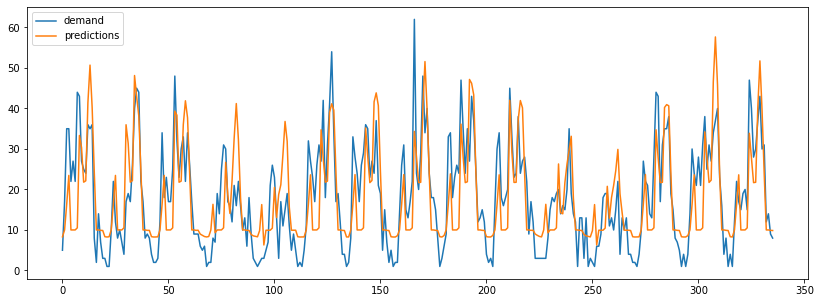

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,78.401838,7.093434,8.854481,0.396404


In [417]:
#Create and train forecaster
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123, max_depth = 10, n_estimators = 100),
                              lags = [168])
forecaster.fit(y=train['rides'], exog = train[columns_for_model])

#Predictions and demand
predictions = forecaster.predict(steps=steps, exog = test[columns_for_model])
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_25 = evaluation_model_25.append({'model':'Random Forest with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_25

##### Cat Boost

In [418]:
forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True),
                              lags = [24*7,24])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [02:15<00:00, 67.73s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 24 168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 500}
  Backtesting metric: 79.29856192175316



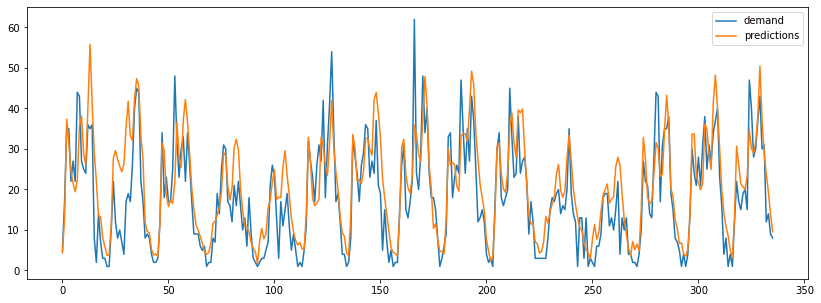

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,78.401838,7.093434,8.854481,0.396404
1,CatBoost,55.822638,5.551931,7.471455,0.591179


In [419]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_25['rides'],
    exog = rides_per_zone_25[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_25 = evaluation_model_25.append({'model':'CatBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_25

##### XGBoost

In [420]:
forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123),
                lags = 24*7
             )
#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.5),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|██████████████████████████████████████| 2/2 [08:17<00:00, 249.00s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}
  Backtesting metric: 85.07465509370033



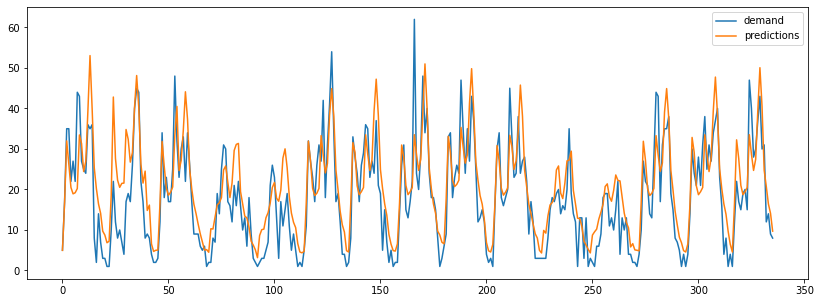

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,78.401838,7.093434,8.854481,0.396404
1,CatBoost,55.822638,5.551931,7.471455,0.591179
2,XGBoost,52.310139,5.574762,7.232575,0.550386


In [421]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y = rides_per_zone_25['rides'],
    exog = rides_per_zone_25[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_25 = evaluation_model_25.append({'model':'XGBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_25

##### Light GBM

In [422]:
forecaster = ForecasterAutoreg(regressor = LGBMRegressor(random_state=123),
                              lags=[24,24*7])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:37<00:00, 18.99s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 24 168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 10, 'n_estimators': 100}
  Backtesting metric: 78.68065047366596



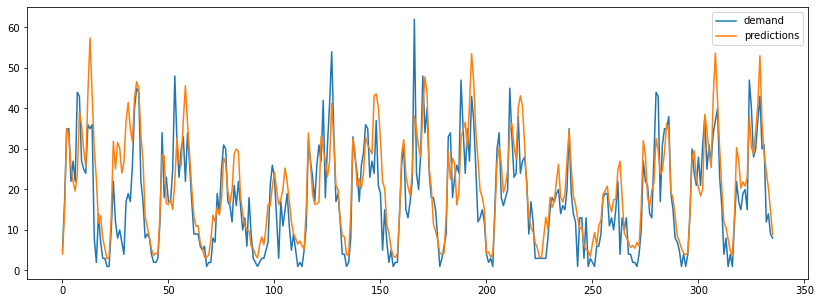

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,78.401838,7.093434,8.854481,0.396404
1,CatBoost,55.822638,5.551931,7.471455,0.591179
2,XGBoost,52.310139,5.574762,7.232575,0.550386
3,LightGBM,57.803819,5.575393,7.602882,0.595344


In [423]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_25['rides'],
    exog = rides_per_zone_25[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)

predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_25 = evaluation_model_25.append({'model':'LightGBM', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_25

##### Choosing the best model

The best model is the XGBoost

In [424]:
#creating and training the forecaster

forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123, learning_rate = 0.1, 
                                                         max_depth = 5, n_estimators= 100),
                              lags=[24*7])

forecaster.fit(y=rides_per_zone_25['rides'], exog = rides_per_zone_25[columns_for_model])

#Obtaining exogenous variables for the model
last_day_data = rides_per_zone_25[-1:]
last_day_data = last_day_data.index[0]

exogenous_variables = pd.date_range(last_day_data, periods = 365*24,freq='H')
exogenous_variables = pd.DataFrame(exogenous_variables, columns = ['datetime'])
exogenous_variables = exogenous_variables[1:]
exogenous_variables['hour'] = exogenous_variables['datetime'].dt.hour
exogenous_variables['month'] = exogenous_variables['datetime'].dt.month
exogenous_variables['weekday'] = exogenous_variables['datetime'].dt.day_name()
exogenous_variables.reset_index(inplace=True)
exogenous_variables = pd.get_dummies(exogenous_variables, columns = ['weekday', 'hour', 'month'])
exogenous_variables = exogenous_variables[:steps]

#Obtaining the predictions and save them in the csv
predictions = forecaster.predict(steps=steps,
                                exog = exogenous_variables[columns_for_model])
predictions = predictions.reset_index()

predictions_zone_25 = pd.concat([predictions, exogenous_variables], axis = 1)
predictions_zone_25 = predictions_zone_25[['pred', 'datetime']]
predictions_zone_25['hour'] = predictions_zone_25['datetime'].dt.hour
predictions_zone_25['day'] = predictions_zone_25['datetime'].dt.date
predictions_zone_25['model'] = 'XGBoost'
predictions_zone_25['postal_code'] = '28003'

predictions_per_zone = predictions_per_zone.append(predictions_zone_25)
predictions_per_zone.to_csv("predictions_per_zone.csv")

### 4.1.26. Demand predictions per zone: 28010

In [425]:
#Creating the dataframe
rides_per_zone_26 = rides_per_station[rides_per_station['postal_code']==28010]
rides_per_zone_26 = rides_per_zone_26.groupby(['date', 'weekday', 'hour', 'month',
                                             'year', 'time','datetime']).rides.sum().reset_index()
#Converting the column datetime to a datetime format
rides_per_zone_26['datetime'] = pd.to_datetime(rides_per_zone_26['datetime'])
#Resample to fill all values of the time series
rides_per_zone_26.set_index('datetime',inplace=True)
rides_per_zone_26.sort_index(inplace=True)
rides_per_zone_26.resample('1H').sum()

#Adding lag values
rides_per_zone_26['rides_lag_7'] = rides_per_zone_26['rides'].shift(7*24)
rides_per_zone_26['rides_lag_1'] = rides_per_zone_26['rides'].shift(1*24)
rides_per_zone_26['rides_lag_2'] = rides_per_zone_26['rides'].shift(2*24)
rides_per_zone_26['rides_lag_1_month'] = rides_per_zone_26['rides'].shift(30*24)
rides_per_zone_26['rides_lag_12_hours'] = rides_per_zone_26['rides'].shift(12)

#One hot encoding
rides_per_zone_26 = pd.get_dummies(rides_per_zone_26, columns = ['weekday', 'hour', 'month'])
#We save the columns we are using as predictors in columns for model and the target we want to predict in target
columns_for_model = [column for column in rides_per_zone_26.columns
                      if column.startswith(('weekday', 'hour', 'month'))]

target = 'rides'
#Division in train and test
steps = 24*14 # 14 days
train = rides_per_zone_26[:-steps]
test = rides_per_zone_26[-steps:]

#Dataframe to evaluate models
evaluation_model_26 = pd.DataFrame(columns=["model", "MSE", "MAE", "RMSE", "R2"])

##### Random Forest

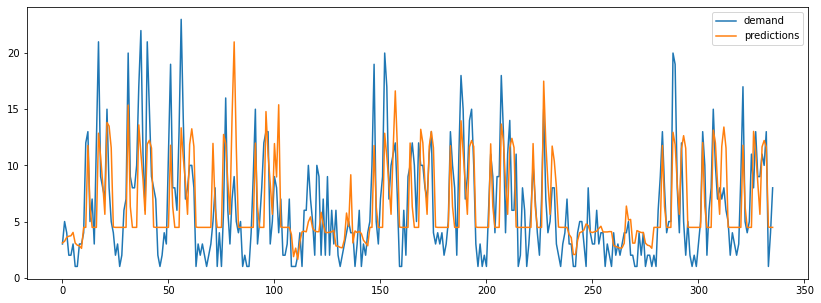

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,11.810325,2.686769,3.436615,0.062854


In [426]:
#Create and train forecaster
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123, max_depth = 10, n_estimators = 100),
                              lags = [168])
forecaster.fit(y=train['rides'], exog = train[columns_for_model])

#Predictions and demand
predictions = forecaster.predict(steps=steps, exog = test[columns_for_model])
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_26 = evaluation_model_26.append({'model':'Random Forest with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_26

##### Cat Boost

In [427]:
forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True),
                              lags = [24*7,24])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [01:52<00:00, 56.02s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 24 168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 10, 'n_estimators': 100}
  Backtesting metric: 14.685186764106477



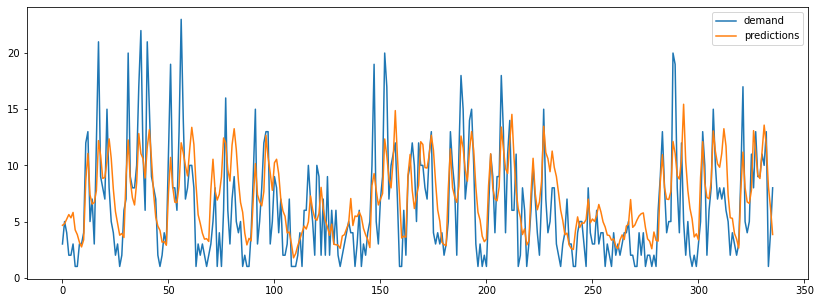

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,11.810325,2.686769,3.436615,0.062854
1,CatBoost,11.720773,2.699241,3.423561,-0.197963


In [428]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_26['rides'],
    exog = rides_per_zone_26[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_26 = evaluation_model_26.append({'model':'CatBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_26

##### XGBoost

In [429]:
forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123),
                lags = 24*7
             )
#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.5),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|██████████████████████████████████████| 2/2 [06:19<00:00, 189.83s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 16.169048908764626



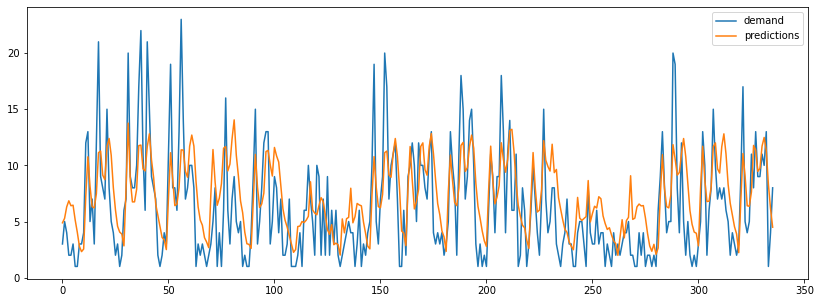

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,11.810325,2.686769,3.436615,0.062854
1,CatBoost,11.720773,2.699241,3.423561,-0.197963
2,XGBoost,12.353771,2.838166,3.514793,-0.352181


In [430]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y = rides_per_zone_26['rides'],
    exog = rides_per_zone_26[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_26 = evaluation_model_26.append({'model':'XGBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_26

##### Light GBM

In [431]:
forecaster = ForecasterAutoreg(regressor = LGBMRegressor(random_state=123),
                              lags=[24,24*7])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:26<00:00, 13.47s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 24 168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 14.76458237532167



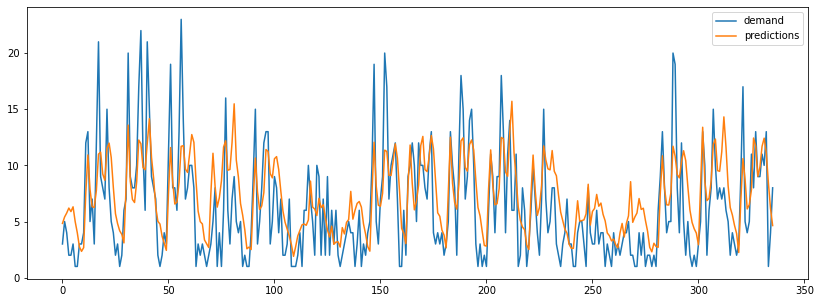

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,11.810325,2.686769,3.436615,0.062854
1,CatBoost,11.720773,2.699241,3.423561,-0.197963
2,XGBoost,12.353771,2.838166,3.514793,-0.352181
3,LightGBM,11.906693,2.774510,3.450608,-0.246985


In [432]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_26['rides'],
    exog = rides_per_zone_26[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)

predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_26 = evaluation_model_26.append({'model':'LightGBM', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_26

##### Choosing the best model

The best model is the CatBoost

In [433]:
#creating and training the forecaster

forecaster = ForecasterAutoreg(
                regressor = CatBoostRegressor(random_state=123, learning_rate = 0.1, 
                                                         max_depth = 10, n_estimators= 100),
                              lags=[24*7])

forecaster.fit(y=rides_per_zone_26['rides'], exog = rides_per_zone_26[columns_for_model])

#Obtaining exogenous variables for the model
last_day_data = rides_per_zone_26[-1:]
last_day_data = last_day_data.index[0]

exogenous_variables = pd.date_range(last_day_data, periods = 365*24,freq='H')
exogenous_variables = pd.DataFrame(exogenous_variables, columns = ['datetime'])
exogenous_variables = exogenous_variables[1:]
exogenous_variables['hour'] = exogenous_variables['datetime'].dt.hour
exogenous_variables['month'] = exogenous_variables['datetime'].dt.month
exogenous_variables['weekday'] = exogenous_variables['datetime'].dt.day_name()
exogenous_variables.reset_index(inplace=True)
exogenous_variables = pd.get_dummies(exogenous_variables, columns = ['weekday', 'hour', 'month'])
exogenous_variables = exogenous_variables[:steps]

#Obtaining the predictions and save them in the csv
predictions = forecaster.predict(steps=steps,
                                exog = exogenous_variables[columns_for_model])
predictions = predictions.reset_index()

predictions_zone_26 = pd.concat([predictions, exogenous_variables], axis = 1)
predictions_zone_26 = predictions_zone_26[['pred', 'datetime']]
predictions_zone_26['hour'] = predictions_zone_26['datetime'].dt.hour
predictions_zone_26['day'] = predictions_zone_26['datetime'].dt.date
predictions_zone_26['model'] = 'CatBoost'
predictions_zone_26['postal_code'] = '28010'

predictions_per_zone = predictions_per_zone.append(predictions_zone_26)
predictions_per_zone.to_csv("predictions_per_zone.csv")

0:	learn: 4.4331481	total: 4.82ms	remaining: 477ms
1:	learn: 4.3520402	total: 9.6ms	remaining: 471ms
2:	learn: 4.2630248	total: 13.8ms	remaining: 445ms
3:	learn: 4.1777205	total: 18.2ms	remaining: 438ms
4:	learn: 4.1106929	total: 22.5ms	remaining: 427ms
5:	learn: 4.0460570	total: 26.3ms	remaining: 412ms
6:	learn: 3.9972281	total: 30ms	remaining: 399ms
7:	learn: 3.9488867	total: 33.6ms	remaining: 387ms
8:	learn: 3.9074699	total: 37.4ms	remaining: 378ms
9:	learn: 3.8757775	total: 41.8ms	remaining: 377ms
10:	learn: 3.8442311	total: 46ms	remaining: 372ms
11:	learn: 3.8143831	total: 49.9ms	remaining: 366ms
12:	learn: 3.7891529	total: 53.6ms	remaining: 359ms
13:	learn: 3.7540026	total: 57.2ms	remaining: 351ms
14:	learn: 3.7393078	total: 61.2ms	remaining: 347ms
15:	learn: 3.7191474	total: 64.9ms	remaining: 341ms
16:	learn: 3.6972818	total: 69.1ms	remaining: 337ms
17:	learn: 3.6809295	total: 72.9ms	remaining: 332ms
18:	learn: 3.6634143	total: 76.9ms	remaining: 328ms
19:	learn: 3.6454926	total:

### 4.1.27. Demand predictions per zone: 28016

In [434]:
#Creating the dataframe
rides_per_zone_27 = rides_per_station[rides_per_station['postal_code']==28016]
rides_per_zone_27 = rides_per_zone_27.groupby(['date', 'weekday', 'hour', 'month',
                                             'year', 'time','datetime']).rides.sum().reset_index()
#Converting the column datetime to a datetime format
rides_per_zone_27['datetime'] = pd.to_datetime(rides_per_zone_27['datetime'])
#Resample to fill all values of the time series
rides_per_zone_27.set_index('datetime',inplace=True)
rides_per_zone_27.sort_index(inplace=True)
rides_per_zone_27.resample('1H').sum()

#Adding lag values
rides_per_zone_27['rides_lag_7'] = rides_per_zone_27['rides'].shift(7*24)
rides_per_zone_27['rides_lag_1'] = rides_per_zone_27['rides'].shift(1*24)
rides_per_zone_27['rides_lag_2'] = rides_per_zone_27['rides'].shift(2*24)
rides_per_zone_27['rides_lag_1_month'] = rides_per_zone_27['rides'].shift(30*24)
rides_per_zone_27['rides_lag_12_hours'] = rides_per_zone_27['rides'].shift(12)

#One hot encoding
rides_per_zone_27 = pd.get_dummies(rides_per_zone_27, columns = ['weekday', 'hour', 'month'])
#We save the columns we are using as predictors in columns for model and the target we want to predict in target
columns_for_model = [column for column in rides_per_zone_27.columns
                      if column.startswith(('weekday', 'hour', 'month'))]

target = 'rides'
#Division in train and test
steps = 24*14 # 14 days
train = rides_per_zone_27[:-steps]
test = rides_per_zone_27[-steps:]

#Dataframe to evaluate models
evaluation_model_27 = pd.DataFrame(columns=["model", "MSE", "MAE", "RMSE", "R2"])

##### Random Forest

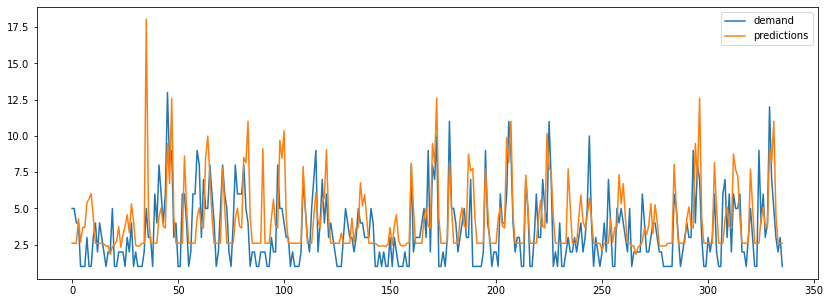

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,5.26032,1.750398,2.293539,0.025708


In [435]:
#Create and train forecaster
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123, max_depth = 10, n_estimators = 100),
                              lags = [168])
forecaster.fit(y=train['rides'], exog = train[columns_for_model])

#Predictions and demand
predictions = forecaster.predict(steps=steps, exog = test[columns_for_model])
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_27 = evaluation_model_27.append({'model':'Random Forest with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_27

##### Cat Boost

In [436]:
forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True),
                              lags = [24*7,24])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [01:32<00:00, 46.02s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 10, 'n_estimators': 500}
  Backtesting metric: 4.652623907484192



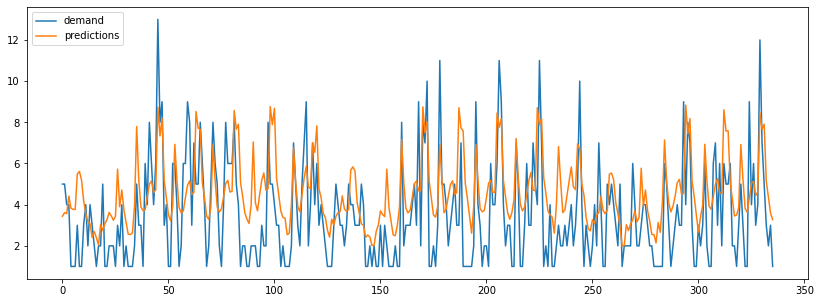

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,5.260320,1.750398,2.293539,0.025708
1,CatBoost,4.633906,1.829503,2.152651,-0.844067


In [437]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_27['rides'],
    exog = rides_per_zone_27[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_27 = evaluation_model_27.append({'model':'CatBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_27

##### XGBoost

In [438]:
forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123),
                lags = 24*7
             )
#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.5),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|██████████████████████████████████████| 2/2 [05:43<00:00, 171.82s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 24 168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 7.76859036489701



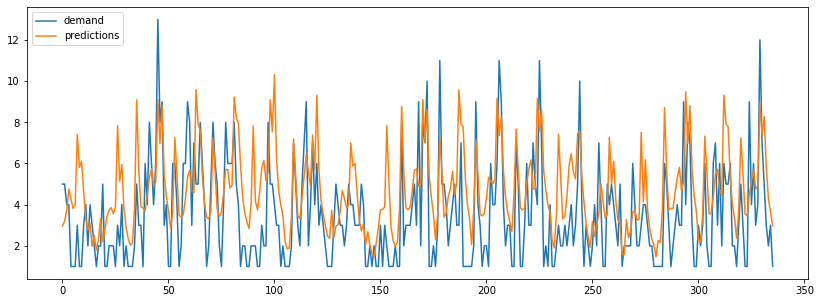

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,5.260320,1.750398,2.293539,0.025708
1,CatBoost,4.633906,1.829503,2.152651,-0.844067
2,XGBoost,5.344339,1.917715,2.311783,-0.470385


In [439]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y = rides_per_zone_27['rides'],
    exog = rides_per_zone_27[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_27 = evaluation_model_27.append({'model':'XGBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                           ignore_index=True)
evaluation_model_27

##### Light GBM

In [440]:
forecaster = ForecasterAutoreg(regressor = LGBMRegressor(random_state=123),
                              lags=[24,24*7])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:22<00:00, 11.45s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 500}
  Backtesting metric: 4.648822116058457



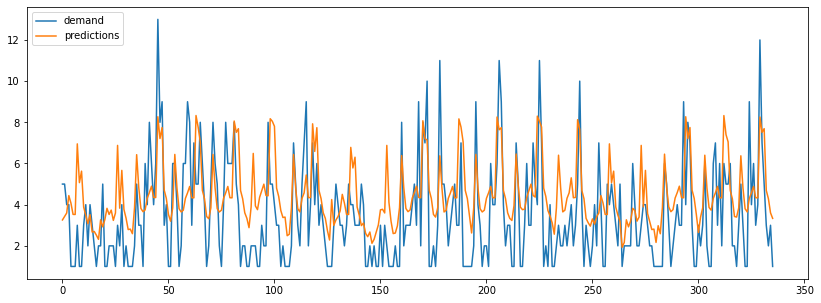

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,5.260320,1.750398,2.293539,0.025708
1,CatBoost,4.633906,1.829503,2.152651,-0.844067
2,XGBoost,5.344339,1.917715,2.311783,-0.470385
3,LightGBM,4.570951,1.819788,2.137978,-1.048143


In [441]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_27['rides'],
    exog = rides_per_zone_27[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)

predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_27 = evaluation_model_27.append({'model':'LightGBM', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_27

##### Choosing the best model

The model with the best results is the LightGBM model

In [442]:
#creating and training the forecaster

forecaster = ForecasterAutoreg(
                regressor = LGBMRegressor(random_state=123, learning_rate = 0.01, 
                                                         max_depth = 5, n_estimators= 500),
                              lags=[24*7])

forecaster.fit(y=rides_per_zone_27['rides'], exog = rides_per_zone_27[columns_for_model])

#Obtaining exogenous variables for the model
last_day_data = rides_per_zone_27[-1:]
last_day_data = last_day_data.index[0]

exogenous_variables = pd.date_range(last_day_data, periods = 365*24,freq='H')
exogenous_variables = pd.DataFrame(exogenous_variables, columns = ['datetime'])
exogenous_variables = exogenous_variables[1:]
exogenous_variables['hour'] = exogenous_variables['datetime'].dt.hour
exogenous_variables['month'] = exogenous_variables['datetime'].dt.month
exogenous_variables['weekday'] = exogenous_variables['datetime'].dt.day_name()
exogenous_variables.reset_index(inplace=True)
exogenous_variables = pd.get_dummies(exogenous_variables, columns = ['weekday', 'hour', 'month'])
exogenous_variables = exogenous_variables[:steps]

#Obtaining the predictions and save them in the csv
predictions = forecaster.predict(steps=steps,
                                exog = exogenous_variables[columns_for_model])
predictions = predictions.reset_index()

predictions_zone_27 = pd.concat([predictions, exogenous_variables], axis = 1)
predictions_zone_27 = predictions_zone_27[['pred', 'datetime']]
predictions_zone_27['hour'] = predictions_zone_27['datetime'].dt.hour
predictions_zone_27['day'] = predictions_zone_27['datetime'].dt.date
predictions_zone_27['model'] = 'Light GBM'
predictions_zone_27['postal_code'] = '28016'

predictions_per_zone = predictions_per_zone.append(predictions_zone_27)
predictions_per_zone.to_csv("predictions_per_zone.csv")

### 4.1.28. Demand predictions per zone: 28027

In [443]:
#Creating the dataframe
rides_per_zone_28 = rides_per_station[rides_per_station['postal_code']==28016]
rides_per_zone_28 = rides_per_zone_28.groupby(['date', 'weekday', 'hour', 'month',
                                             'year', 'time','datetime']).rides.sum().reset_index()
#Converting the column datetime to a datetime format
rides_per_zone_28['datetime'] = pd.to_datetime(rides_per_zone_28['datetime'])
#Resample to fill all values of the time series
rides_per_zone_28.set_index('datetime',inplace=True)
rides_per_zone_28.sort_index(inplace=True)
rides_per_zone_28.resample('1H').sum()

#Adding lag values
rides_per_zone_28['rides_lag_7'] = rides_per_zone_28['rides'].shift(7*24)
rides_per_zone_28['rides_lag_1'] = rides_per_zone_28['rides'].shift(1*24)
rides_per_zone_28['rides_lag_2'] = rides_per_zone_28['rides'].shift(2*24)
rides_per_zone_28['rides_lag_1_month'] = rides_per_zone_28['rides'].shift(30*24)
rides_per_zone_28['rides_lag_12_hours'] = rides_per_zone_28['rides'].shift(12)

#One hot encoding
rides_per_zone_28 = pd.get_dummies(rides_per_zone_28, columns = ['weekday', 'hour', 'month'])
#We save the columns we are using as predictors in columns for model and the target we want to predict in target
columns_for_model = [column for column in rides_per_zone_28.columns
                      if column.startswith(('weekday', 'hour', 'month'))]

target = 'rides'
#Division in train and test
steps = 24*14 # 14 days
train = rides_per_zone_28[:-steps]
test = rides_per_zone_28[-steps:]

#Dataframe to evaluate models
evaluation_model_28 = pd.DataFrame(columns=["model", "MSE", "MAE", "RMSE", "R2"])

##### Random Forest

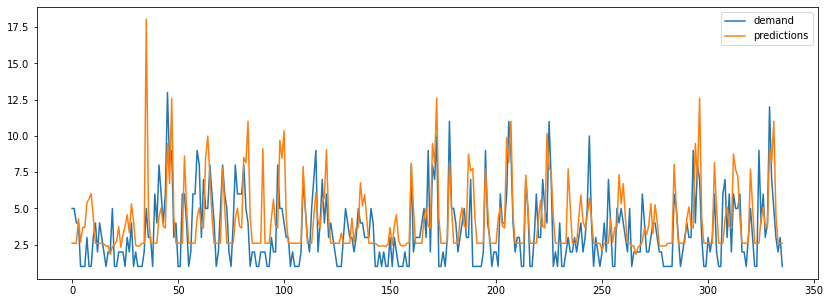

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,5.26032,1.750398,2.293539,0.025708


In [444]:
#Create and train forecaster
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123, max_depth = 10, n_estimators = 100),
                              lags = [168])
forecaster.fit(y=train['rides'], exog = train[columns_for_model])

#Predictions and demand
predictions = forecaster.predict(steps=steps, exog = test[columns_for_model])
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_28 = evaluation_model_28.append({'model':'Random Forest with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_28

##### Cat Boost

In [445]:
forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True),
                              lags = [24*7,24])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [01:32<00:00, 46.04s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 10, 'n_estimators': 500}
  Backtesting metric: 4.652623907484192



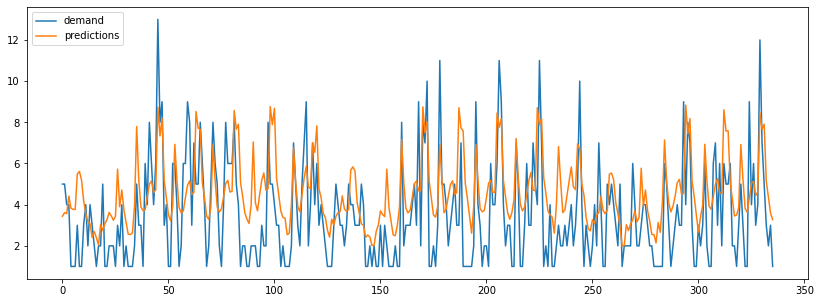

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,5.260320,1.750398,2.293539,0.025708
1,CatBoost,4.633906,1.829503,2.152651,-0.844067


In [446]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_28['rides'],
    exog = rides_per_zone_28[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_28 = evaluation_model_28.append({'model':'CatBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_28

##### XGBoost

In [447]:
forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123),
                lags = 24*7
             )
#Grid search to fAind best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.5),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|██████████████████████████████████████| 2/2 [05:41<00:00, 170.72s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 24 168] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 7.76859036489701



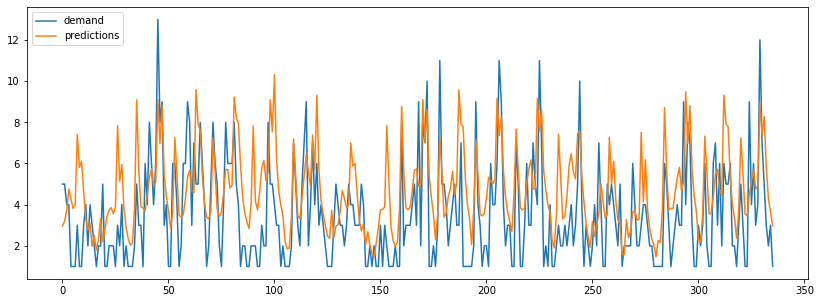

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,5.260320,1.750398,2.293539,0.025708
1,CatBoost,4.633906,1.829503,2.152651,-0.844067
2,XGBoost,5.344339,1.917715,2.311783,-0.470385


In [448]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y = rides_per_zone_28['rides'],
    exog = rides_per_zone_28[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_28 = evaluation_model_28.append({'model':'XGBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                           ignore_index=True)
evaluation_model_28

##### Light GBM

In [449]:
forecaster = ForecasterAutoreg(regressor = LGBMRegressor(random_state=123),
                              lags=[24,24*7])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:18<00:00,  9.15s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 500}
  Backtesting metric: 4.648822116058457



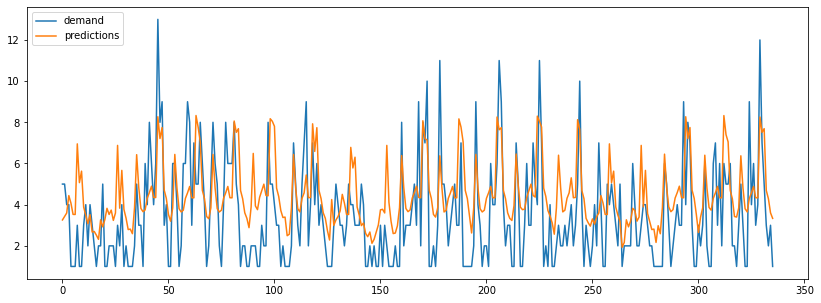

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,5.260320,1.750398,2.293539,0.025708
1,CatBoost,4.633906,1.829503,2.152651,-0.844067
2,XGBoost,5.344339,1.917715,2.311783,-0.470385
3,LightGBM,4.570951,1.819788,2.137978,-1.048143


In [450]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_28['rides'],
    exog = rides_per_zone_28[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)

predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_28 = evaluation_model_28.append({'model':'LightGBM', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_28

##### Choosing the best model

In [451]:
#creating and training the forecaster

forecaster = ForecasterAutoreg(
                regressor = CatBoostRegressor(random_state=123, learning_rate = 0.01, 
                                                         max_depth = 10, n_estimators= 100),
                              lags=[24*7])

forecaster.fit(y=rides_per_zone_28['rides'], exog = rides_per_zone_28[columns_for_model])

#Obtaining exogenous variables for the model
last_day_data = rides_per_zone_28[-1:]
last_day_data = last_day_data.index[0]

exogenous_variables = pd.date_range(last_day_data, periods = 365*24,freq='H')
exogenous_variables = pd.DataFrame(exogenous_variables, columns = ['datetime'])
exogenous_variables = exogenous_variables[1:]
exogenous_variables['hour'] = exogenous_variables['datetime'].dt.hour
exogenous_variables['month'] = exogenous_variables['datetime'].dt.month
exogenous_variables['weekday'] = exogenous_variables['datetime'].dt.day_name()
exogenous_variables.reset_index(inplace=True)
exogenous_variables = pd.get_dummies(exogenous_variables, columns = ['weekday', 'hour', 'month'])
exogenous_variables = exogenous_variables[:steps]

#Obtaining the predictions and save them in the csv
predictions = forecaster.predict(steps=steps,
                                exog = exogenous_variables[columns_for_model])
predictions = predictions.reset_index()

predictions_zone_28 = pd.concat([predictions, exogenous_variables], axis = 1)
predictions_zone_28 = predictions_zone_28[['pred', 'datetime']]
predictions_zone_28['hour'] = predictions_zone_28['datetime'].dt.hour
predictions_zone_28['day'] = predictions_zone_28['datetime'].dt.date
predictions_zone_28['model'] = 'CatBoost'
predictions_zone_28['postal_code'] = '28027'

predictions_per_zone = predictions_per_zone.append(predictions_zone_28)
predictions_per_zone.to_csv("predictions_per_zone.csv")

0:	learn: 2.8879000	total: 4.81ms	remaining: 477ms
1:	learn: 2.8829084	total: 9.22ms	remaining: 452ms
2:	learn: 2.8793656	total: 11.6ms	remaining: 374ms
3:	learn: 2.8734471	total: 15.6ms	remaining: 374ms
4:	learn: 2.8675983	total: 19.5ms	remaining: 371ms
5:	learn: 2.8623696	total: 23.5ms	remaining: 368ms
6:	learn: 2.8569897	total: 27.7ms	remaining: 368ms
7:	learn: 2.8519366	total: 31.7ms	remaining: 365ms
8:	learn: 2.8468461	total: 35.9ms	remaining: 363ms
9:	learn: 2.8419220	total: 40.1ms	remaining: 361ms
10:	learn: 2.8371709	total: 44.6ms	remaining: 361ms
11:	learn: 2.8328164	total: 48.3ms	remaining: 354ms
12:	learn: 2.8285883	total: 52ms	remaining: 348ms
13:	learn: 2.8236241	total: 56.5ms	remaining: 347ms
14:	learn: 2.8198894	total: 60.5ms	remaining: 343ms
15:	learn: 2.8152113	total: 64.6ms	remaining: 339ms
16:	learn: 2.8108778	total: 68.6ms	remaining: 335ms
17:	learn: 2.8063411	total: 72.5ms	remaining: 330ms
18:	learn: 2.8023604	total: 76.1ms	remaining: 324ms
19:	learn: 2.7980954	tot

### 4.1.29. Demand predictions per zone: 28002

In [452]:
#Creating the dataframe
rides_per_zone_29 = rides_per_station[rides_per_station['postal_code']==28002]
rides_per_zone_29 = rides_per_zone_29.groupby(['date', 'weekday', 'hour', 'month',
                                             'year', 'time','datetime']).rides.sum().reset_index()
#Converting the column datetime to a datetime format
rides_per_zone_29['datetime'] = pd.to_datetime(rides_per_zone_29['datetime'])
#Resample to fill all values of the time series
rides_per_zone_29.set_index('datetime',inplace=True)
rides_per_zone_29.sort_index(inplace=True)
rides_per_zone_29.resample('1H').sum()

#Adding lag values
rides_per_zone_29['rides_lag_7'] = rides_per_zone_29['rides'].shift(7*24)
rides_per_zone_29['rides_lag_1'] = rides_per_zone_29['rides'].shift(1*24)
rides_per_zone_29['rides_lag_2'] = rides_per_zone_29['rides'].shift(2*24)
rides_per_zone_29['rides_lag_1_month'] = rides_per_zone_29['rides'].shift(30*24)
rides_per_zone_29['rides_lag_12_hours'] = rides_per_zone_29['rides'].shift(12)

#One hot encoding
rides_per_zone_29 = pd.get_dummies(rides_per_zone_29, columns = ['weekday', 'hour', 'month'])
#We save the columns we are using as predictors in columns for model and the target we want to predict in target
columns_for_model = [column for column in rides_per_zone_29.columns
                      if column.startswith(('weekday', 'hour', 'month'))]

target = 'rides'
#Division in train and test
steps = 24*14 # 14 days
train = rides_per_zone_29[:-steps]
test = rides_per_zone_29[-steps:]

#Dataframe to evaluate models
evaluation_model_29 = pd.DataFrame(columns=["model", "MSE", "MAE", "RMSE", "R2"])

##### Random Forest

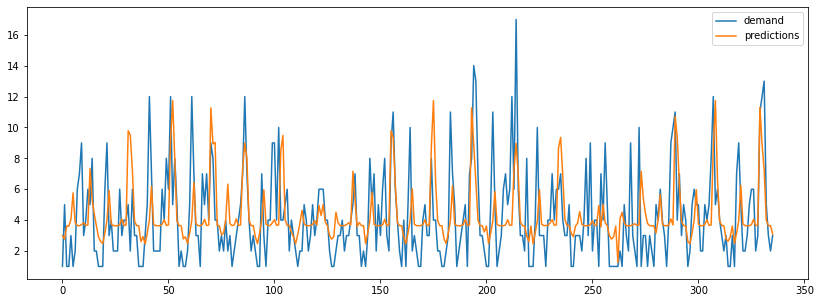

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,6.822481,1.980076,2.611988,-1.001394


In [453]:
#Create and train forecaster
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123, max_depth = 10, n_estimators = 100),
                              lags = [168])
forecaster.fit(y=train['rides'], exog = train[columns_for_model])

#Predictions and demand
predictions = forecaster.predict(steps=steps, exog = test[columns_for_model])
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_29 = evaluation_model_29.append({'model':'Random Forest with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_29

##### CatBoost

In [454]:
forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True),
                              lags = [24*7,24])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [01:02<00:00, 31.06s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 24 168] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 10, 'n_estimators': 100}
  Backtesting metric: 6.412516278999163



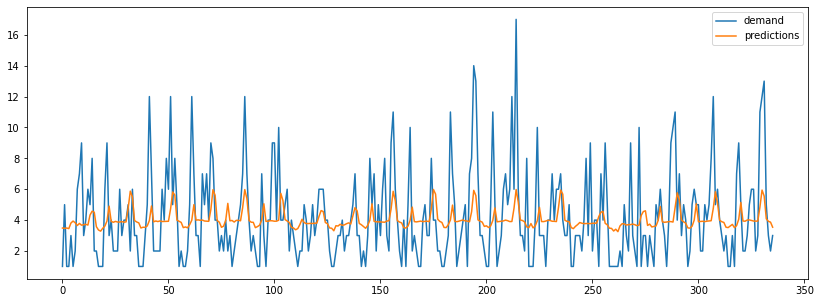

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,6.822481,1.980076,2.611988,-1.001394
1,CatBoost,7.137965,2.044526,2.671697,-19.527195


In [455]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_29['rides'],
    exog = rides_per_zone_29[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_29 = evaluation_model_29.append({'model':'CatBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_29

##### XGBoost

In [456]:
forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123),
                lags = 24*7
             )
#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.5),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|██████████████████████████████████████| 2/2 [03:44<00:00, 112.36s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 6.639761667198732



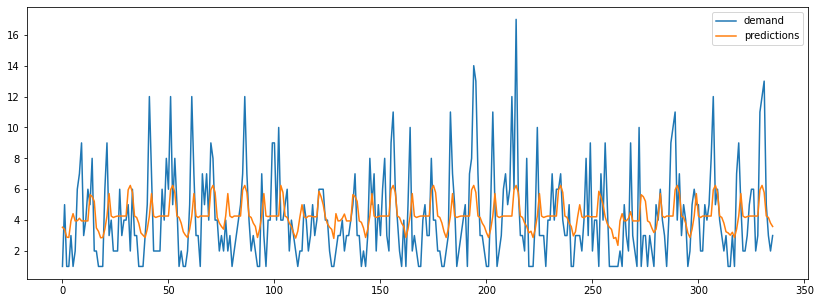

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,6.822481,1.980076,2.611988,-1.001394
1,CatBoost,7.137965,2.044526,2.671697,-19.527195
2,XGBoost,6.624965,1.997475,2.573901,-7.808527


In [457]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y = rides_per_zone_29['rides'],
    exog = rides_per_zone_29[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_29 = evaluation_model_29.append({'model':'XGBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                           ignore_index=True)
evaluation_model_29

##### Light GBM

In [458]:
forecaster = ForecasterAutoreg(regressor = LGBMRegressor(random_state=123),
                              lags=[24,24*7])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [00:18<00:00,  9.18s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 24 168] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 10, 'n_estimators': 100}
  Backtesting metric: 6.423073499308724



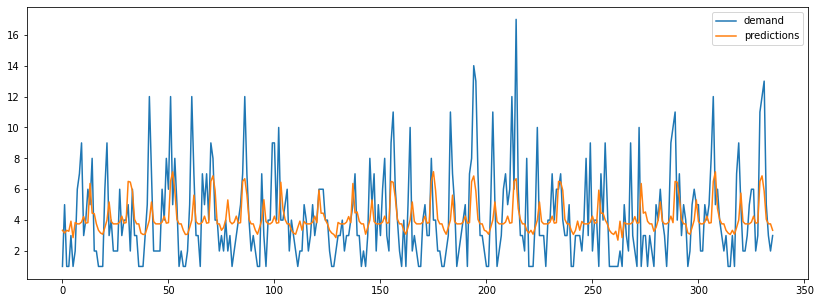

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,6.822481,1.980076,2.611988,-1.001394
1,CatBoost,7.137965,2.044526,2.671697,-19.527195
2,XGBoost,6.624965,1.997475,2.573901,-7.808527
3,LightGBM,6.490809,1.952889,2.547707,-6.229891


In [459]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_29['rides'],
    exog = rides_per_zone_29[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)

predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_29 = evaluation_model_29.append({'model':'LightGBM', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_29

##### Choosing the best model

The best model is the Light GBM

In [460]:
#creating and training the forecaster

forecaster = ForecasterAutoreg(
                regressor = LGBMRegressor(random_state=123, learning_rate = 0.01, 
                                                         max_depth = 10, n_estimators= 100),
                              lags=[24*7])

forecaster.fit(y=rides_per_zone_29['rides'], exog = rides_per_zone_29[columns_for_model])

#Obtaining exogenous variables for the model
last_day_data = rides_per_zone_29[-1:]
last_day_data = last_day_data.index[0]

exogenous_variables = pd.date_range(last_day_data, periods = 365*24,freq='H')
exogenous_variables = pd.DataFrame(exogenous_variables, columns = ['datetime'])
exogenous_variables = exogenous_variables[1:]
exogenous_variables['hour'] = exogenous_variables['datetime'].dt.hour
exogenous_variables['month'] = exogenous_variables['datetime'].dt.month
exogenous_variables['weekday'] = exogenous_variables['datetime'].dt.day_name()
exogenous_variables.reset_index(inplace=True)
exogenous_variables = pd.get_dummies(exogenous_variables, columns = ['weekday', 'hour', 'month'])
exogenous_variables = exogenous_variables[:steps]

#Obtaining the predictions and save them in the csv
predictions = forecaster.predict(steps=steps,
                                exog = exogenous_variables[columns_for_model])
predictions = predictions.reset_index()

predictions_zone_29 = pd.concat([predictions, exogenous_variables], axis = 1)
predictions_zone_29 = predictions_zone_29[['pred', 'datetime']]
predictions_zone_29['hour'] = predictions_zone_29['datetime'].dt.hour
predictions_zone_29['day'] = predictions_zone_29['datetime'].dt.date
predictions_zone_29['model'] = 'Light GBM'
predictions_zone_29['postal_code'] = '28002'

predictions_per_zone = predictions_per_zone.append(predictions_zone_29)
predictions_per_zone.to_csv("predictions_per_zone.csv")

### 4.1.30. Demand predictions per zone: 28039

In [461]:
#Creating the dataframe
rides_per_zone_30 = rides_per_station[rides_per_station['postal_code']==28002]
rides_per_zone_30 = rides_per_zone_30.groupby(['date', 'weekday', 'hour', 'month',
                                             'year', 'time','datetime']).rides.sum().reset_index()
#Converting the column datetime to a datetime format
rides_per_zone_30['datetime'] = pd.to_datetime(rides_per_zone_30['datetime'])
#Resample to fill all values of the time series
rides_per_zone_30.set_index('datetime',inplace=True)
rides_per_zone_30.sort_index(inplace=True)
rides_per_zone_30.resample('1H').sum()

#Adding lag values
rides_per_zone_30['rides_lag_7'] = rides_per_zone_30['rides'].shift(7*24)
rides_per_zone_30['rides_lag_1'] = rides_per_zone_30['rides'].shift(1*24)
rides_per_zone_30['rides_lag_2'] = rides_per_zone_30['rides'].shift(2*24)
rides_per_zone_30['rides_lag_1_month'] = rides_per_zone_30['rides'].shift(30*24)
rides_per_zone_30['rides_lag_12_hours'] = rides_per_zone_30['rides'].shift(12)

#One hot encoding
rides_per_zone_30 = pd.get_dummies(rides_per_zone_30, columns = ['weekday', 'hour', 'month'])
#We save the columns we are using as predictors in columns for model and the target we want to predict in target
columns_for_model = [column for column in rides_per_zone_30.columns
                      if column.startswith(('weekday', 'hour', 'month'))]

target = 'rides'
#Division in train and test
steps = 24*14 # 14 days
train = rides_per_zone_30[:-steps]
test = rides_per_zone_30[-steps:]

#Dataframe to evaluate models
evaluation_model_30 = pd.DataFrame(columns=["model", "MSE", "MAE", "RMSE", "R2"])

##### Random Forest

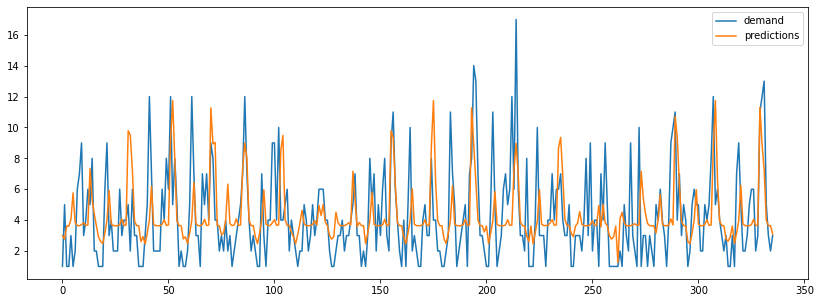

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,6.822481,1.980076,2.611988,-1.001394


In [462]:
#Create and train forecaster
forecaster = ForecasterAutoreg(regressor = RandomForestRegressor(random_state=123, max_depth = 10, n_estimators = 100),
                              lags = [168])
forecaster.fit(y=train['rides'], exog = train[columns_for_model])

#Predictions and demand
predictions = forecaster.predict(steps=steps, exog = test[columns_for_model])
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_30 = evaluation_model_30.append({'model':'Random Forest with exog. variables', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_30

##### Cat Boost

In [463]:
forecaster = ForecasterAutoreg(regressor = CatBoostRegressor(random_state=123, silent=True),
                              lags = [24*7,24])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [01:00<00:00, 30.45s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 24 168] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 10, 'n_estimators': 100}
  Backtesting metric: 6.412516278999163



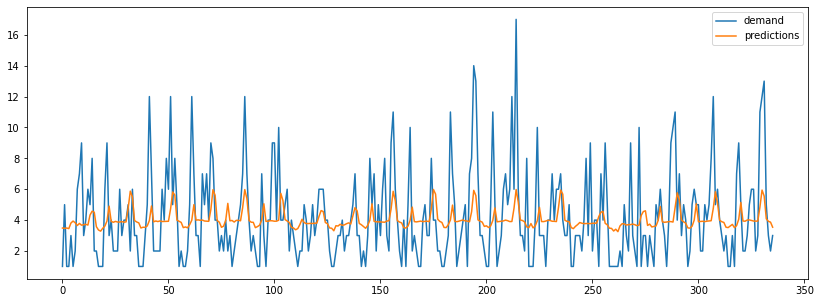

,model,MSE,MAE,RMSE,R2
0,Random Forest with exog. variables,6.822481,1.980076,2.611988,-1.001394
1,CatBoost,7.137965,2.044526,2.671697,-19.527195


In [465]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_30['rides'],
    exog = rides_per_zone_30[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_30 = evaluation_model_30.append({'model':'CatBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_30

##### XGBoost

In [466]:
forecaster = ForecasterAutoreg(
                regressor = XGBRegressor(random_state=123),
                lags = 24*7
             )
#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.5),
                                    return_best=True,
                                    verbose=False)

loop param_grid:   0%|                                             | 0/12 [00:00<?, ?it/s]

Number of models compared: 24



loop lags_grid: 100%|███████████████████████████████████████| 2/2 [03:17<00:00, 98.76s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [168] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 6.639761667198732



In [ ]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y = rides_per_zone_30['rides'],
    exog = rides_per_zone_30[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)
predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']
#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_30 = evaluation_model_30.append({'model':'XGBoost', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                           ignore_index=True)
evaluation_model_30

##### Light GBM

In [ ]:
forecaster = ForecasterAutoreg(regressor = LGBMRegressor(random_state=123),
                              lags=[24,24*7])

#Grid search to find best combination of hyperparameters

param_grid = {
    'n_estimators': [100,500],
    'max_depth': [3,5,10],
    'learning_rate': [0.01,0.1]
}

lags_grid = [[24,24*7],[24*7]]

grid_search = grid_search_forecaster(forecaster = forecaster,
                                    y = train['rides'],
                                    exog = train[columns_for_model],
                                    param_grid = param_grid,
                                    lags_grid = lags_grid,
                                    steps = steps,
                                    refit = False,
                                    metric = 'mean_squared_error',
                                    initial_train_size = int(len(train)*0.75),
                                    return_best=True,
                                    verbose=False)

In [ ]:
#Backtesting to evaluate model

metric, predictions = backtesting_forecaster(
    forecaster = forecaster,
    y          = rides_per_zone_30['rides'],
    exog = rides_per_zone_30[columns_for_model],
    initial_train_size = len(train),
    steps      = 24,
    refit      = False,
    metric     = 'mean_squared_error',
    verbose    = False
)

predictions = predictions.reset_index()
predictions = predictions['pred']
demand = test['rides']
demand = demand.reset_index()
demand = demand['rides']

#Plot of demand and predictions
fig, ax = plt.subplots(figsize=(14, 5))

plt.plot(demand, label='demand')
plt.plot(predictions, label = 'predictions')
ax.legend()
plt.show()

#Metrics of the model
mse, mae, rmse, r2 = calculate_metrics(predictions, demand)
evaluation_model_30 = evaluation_model_30.append({'model':'LightGBM', 
                                                'MSE': mse, 'MAE': mae, 'RMSE': rmse,  'R2':r2},
                                             ignore_index=True)
evaluation_model_30

##### Choosing the best model

In [ ]:
#creating and training the forecaster

forecaster = ForecasterAutoreg(
                regressor = CatBoostRegressor(random_state=123, learning_rate = 0.01, 
                                                         max_depth = 10, n_estimators= 100),
                              lags=[24*7])

forecaster.fit(y=rides_per_zone_30['rides'], exog = rides_per_zone_30[columns_for_model])

#Obtaining exogenous variables for the model
last_day_data = rides_per_zone_30[-1:]
last_day_data = last_day_data.index[0]

exogenous_variables = pd.date_range(last_day_data, periods = 365*24,freq='H')
exogenous_variables = pd.DataFrame(exogenous_variables, columns = ['datetime'])
exogenous_variables = exogenous_variables[1:]
exogenous_variables['hour'] = exogenous_variables['datetime'].dt.hour
exogenous_variables['month'] = exogenous_variables['datetime'].dt.month
exogenous_variables['weekday'] = exogenous_variables['datetime'].dt.day_name()
exogenous_variables.reset_index(inplace=True)
exogenous_variables = pd.get_dummies(exogenous_variables, columns = ['weekday', 'hour', 'month'])
exogenous_variables = exogenous_variables[:steps]

#Obtaining the predictions and save them in the csv
predictions = forecaster.predict(steps=steps,
                                exog = exogenous_variables[columns_for_model])
predictions = predictions.reset_index()

predictions_zone_30 = pd.concat([predictions, exogenous_variables], axis = 1)
predictions_zone_30 = predictions_zone_30[['pred', 'datetime']]
predictions_zone_30['hour'] = predictions_zone_30['datetime'].dt.hour
predictions_zone_30['day'] = predictions_zone_30['datetime'].dt.date
predictions_zone_30['model'] = 'CatBoost'
predictions_zone_30['postal_code'] = '28039'

predictions_per_zone = predictions_per_zone.append(predictions_zone_30)
predictions_per_zone.to_csv("predictions_per_zone.csv")